In [2]:
# all modules necessary for this nb
import os
import sys
import pickle

import numpy as np
import pylab as pl
import scipy.stats as sstats

# setting parameters for default matplotlib plots
%matplotlib inline

In [3]:
pl.style.use('fabiostyle')
#this will cause text to be exported as 'true text' which can be edited in Adobe Illustrator
pl.rcParams['pdf.fonttype']=42
pl.rcParams['ps.fonttype']=42
# needs to find the library of functions
sys.path.append('../../../code/')  # to be replaced!

import utils as ut
import plots as pt

In [4]:
# NOTEBOOK_NAME = NOTEBOOK_NAME.split('/')[-1][:-6]
NOTEBOOK_NAME = 'decoding_around_onset_combined_FIGURES'

In [5]:
from pickleshare import PickleShareDB

autorestore_folder = os.path.join(os.getcwd(), 'autorestore', NOTEBOOK_NAME)
db = PickleShareDB(autorestore_folder)
import sys
from workspace import *
import IPython
ip = IPython.get_ipython()

# this will restore all the saved variables. ignore the errors listed.
load_workspace(ip, db)

# use `save_worspace(db)` to save variables at the end

Unable to restore variable 'add_2way_sig', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'add_significance', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'add_significance_fishers', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'add_significance_fishers_point', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'add_significance_line', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'annotate_heatmap', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'sig_vs_chance', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'heatmap', ignoring (use %sto

In [5]:
from itertools import product
def load_all_animals_vars(varname, animal_list, pilot_list=None, notebook='preprocessing'):
    all_of_them = {}
    for ani in animal_list:
        folder = '../%s/notebooks/autorestore/%s/' % (ani, notebook)
        all_of_them.update({ani: ut.load_variable(varname, folder)})
    return all_of_them

In [6]:
def report_stats (array1, array2, sig_func=None,mcc=1):
    if sig_func is None:
        sig_func = lambda x, y: sstats.mannwhitneyu(x, y, alternative='two-sided')
        U = sig_func(array1, array2)[0]
        z = ((U-((loops*loops)/2))/(np.sqrt(((loops*loops)*(loops+loops+1))/12)))
        r = z/np.sqrt(loops*2)
        p = sig_func(array1, array2)[-1]
        print "U =",U,"p =",p*mcc,"r =",r
    if sig_func is 'ttest':
        sig_func = lambda x, y: sstats.ttest_ind(x, y)
        cohens_d = (np.mean(array1)-np.mean(array2))/np.sqrt((np.std(array1)**2+np.std(array2)**2)/2)
        p = sig_func(array1, array2)[-1]
        print sig_func(array1, array2),"d =", cohens_d, 'corrected p =',p*mcc
    if sig_func is 'fishers':
        table = array1,array2
        sig_func = lambda x: sstats.fisher_exact(x, alternative='two-sided')
        p = sig_func(table)[-1]
        odds_ratio = sig_func(table)[0]
        print sig_func(table),"odd's ratio =", odds_ratio, 'corrected p =',p*mcc
        

def report_stats_chance (array1, chance=0.5, sig_func=None,mcc=1):
    if sig_func is None:
        sig_func = lambda x: sstats.wilcoxon(x)
        subtracted = [x-chance for x in array1]
        U = sig_func(subtracted)[0]
        z = ((U-((loops*loops)/2))/(np.sqrt(((loops*loops)*(loops+loops+1))/12)))
        r = z/np.sqrt(loops*2)
        print sig_func(subtracted),"r =",r
    elif sig_func is 'ttest':
        sig_func = lambda x, y: sstats.ttest_1samp(x,y)
        cohens_d = (np.mean(array1)-chance)/np.std(array1)
        print sig_func(array1,chance),"d =",cohens_d

In [13]:
all_animals_vhpc =     'c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m8', '90', '91', '92', '93'
pre_animals_vhpc =     'c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m8', '90', '91', '92', '93'
post_animals_vhpc =    'c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m8', '90', '91', '92', '93'
pre_rev_animals_vhpc = 'c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m8', '90', '91', '92', '93'
post_rev_animals_vhpc ='c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m8', '90', '91', '92', '93'
catch_animals_vhpc =   'c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m8', '90', '91', '92', '93'

In [14]:
all_animals_dhpc =      'dhpcg1','dhpcg20','dhpc24'
pre_animals_dhpc =      'dhpcg1','dhpcg20','dhpc24'
post_animals_dhpc =     'dhpcg1','dhpcg20','dhpc24'
pre_rev_animals_dhpc =  'dhpcg1','dhpcg20','dhpc24'
post_rev_animals_dhpc = 'dhpcg1','dhpcg20','dhpc24'
catch_animals_dhpc =    'dhpcg1','dhpcg20'

In [17]:
sessions = 'pre','d2','post','pre_rev','post_rev'#,'catch'

all_labels='rwVSsh','rwVScsm','shVScsm','rwndVSshnd','rwVSrwnd','rwndVScsm','shVSshnd','shndVScsm'
non_catch_labels = 'rwVSsh','rwVScsm','shVScsm'
catch_labels = 'rwndVSshnd','rwVSrwnd','rwndVScsm','shVSshnd','shndVScsm'
comp_colors = 'k','darkorchid','sandybrown'

In [18]:
v_name=[]
for t in range(13):
    for label in non_catch_labels:
        for r in 'dhpc','vhpc':
            exec("scores_gmin_tb_%s_%s_%s = {}"%(t,label,r))
            for sess in sessions:
                exec("v_name = 'scores_gmin_tb_%s_%s'"%(t,label))
                exec("path='../notebooks/autorestore/decoding_around_onset_combined_1sec_%s/'"%(r))
                exec("scores_gmin_tb_%s_%s_%s_t = ut.load_variable(v_name,path)"%(t,label,r))
                exec("scores_gmin_tb_%s_%s_%s_t = scores_gmin_tb_%s_%s_%s_t['%s']"%(t,label,r,t,label,r,sess))
                exec("scores_gmin_tb_%s_%s_%s['%s'] = scores_gmin_tb_%s_%s_%s_t"%(t,label,r,sess,t,label,r))

In [19]:
v_name=[]
for t in range(13):
    for label in catch_labels:
        for r in 'dhpc','vhpc':
            exec("scores_gmin_tb_%s_%s_%s = {}"%(t,label,r))
            for sess in 'catch',:
                exec("v_name = 'scores_gmin_tb_%s_%s'"%(t,label))
                exec("path='../notebooks/autorestore/decoding_around_onset_combined_1sec_%s/'"%(r))
                exec("scores_gmin_tb_%s_%s_%s_t = ut.load_variable(v_name,path)"%(t,label,r))
                exec("scores_gmin_tb_%s_%s_%s_t = scores_gmin_tb_%s_%s_%s_t['%s']"%(t,label,r,t,label,r,sess))
                exec("scores_gmin_tb_%s_%s_%s['%s'] = scores_gmin_tb_%s_%s_%s_t"%(t,label,r,sess,t,label,r))

In [20]:
#get mean of each array
for label in non_catch_labels:
    for t in range(13):
        for r in 'dhpc','vhpc':
            exec("mean_scores_gmin_tb_%s_%s_%s={}"%(t,label,r))
            for sess in sessions:
                exec("mean_scores_gmin_tb_%s_%s_%s[sess]=[]"%(t,label,r))
                for i in eval("scores_gmin_tb_%s_%s_%s[sess]"%(t,label,r)):
                    exec("mean_scores_gmin_tb_%s_%s_%s[sess].append(i.mean())"%(t,label,r))
                    
for label in catch_labels:
    for t in range(13):
        for r in 'dhpc','vhpc':
            exec("mean_scores_gmin_tb_%s_%s_%s={}"%(t,label,r))
            for sess in 'catch',:
                exec("mean_scores_gmin_tb_%s_%s_%s[sess]=[]"%(t,label,r))
                for i in eval("scores_gmin_tb_%s_%s_%s[sess]"%(t,label,r)):
                    exec("mean_scores_gmin_tb_%s_%s_%s[sess].append(i.mean())"%(t,label,r))

In [21]:
loops=10
for label in non_catch_labels:
    for t in range (13):
        exec("mannwhitU_tb_%s_%s = {}"%(t,label))
        for sess in sessions:
            exec("mannwhitU_tb_%s_%s[sess] = sstats.mannwhitneyu(mean_scores_gmin_tb_%s_%s_dhpc[sess][:loops],mean_scores_gmin_tb_%s_%s_vhpc[sess][:loops])"%(t,label,t,label,t,label))
            
for label in catch_labels:
    for t in range (13):
        exec("mannwhitU_tb_%s_%s = {}"%(t,label))
        for sess in 'catch',:
            exec("mannwhitU_tb_%s_%s[sess] = sstats.mannwhitneyu(mean_scores_gmin_tb_%s_%s_dhpc[sess][:loops],mean_scores_gmin_tb_%s_%s_vhpc[sess][:loops])"%(t,label,t,label,t,label))

In [22]:
v_name=[]
for t in range(13):
    for label in non_catch_labels:
        for r in 'dhpc','vhpc':
            exec("subsets_within_scores_%s_VS_%s_%s_%s = {}"%(t,t,label,r))
            for sess in sessions:
                exec("v_name = 'subsets_within_scores_%s_VS_%s_%s'"%(t,t,label))
                exec("path='../notebooks/autorestore/decoding_around_onset_combined_1sec_%s/'"%(r))
                exec("subsets_within_scores_%s_VS_%s_%s_%s_t = ut.load_variable(v_name,path)"%(t,t,label,r))
                exec("subsets_within_scores_%s_VS_%s_%s_%s_t = subsets_within_scores_%s_VS_%s_%s_%s_t['%s']"%(t,t,label,r,t,t,label,r,sess))
                exec("subsets_within_scores_%s_VS_%s_%s_%s['%s'] = subsets_within_scores_%s_VS_%s_%s_%s_t"%(t,t,label,r,sess,t,t,label,r))

In [23]:
#trad_co = ('limegreen','b','r','silver','grey','y')
#pal_co = ('#003f5c','#444e86','#955196','#dd5182','#ff6e54','#ffa600')
dark_co = ('darkcyan','firebrick','steelblue')
linesty = ('-','-','-')#,'dotted')
#alt_co = ('hotpink','mediumorchid','darkturquoise','mediumspringgreen','lawngreen','khaki')
sessions_to_plot = 'pre','post','post_rev'
session_labels = ('Early','Late','Reversal')
comp_labels = ('Rew vs Sh','Rew VS CS-','Sh vs CS-')
all_session_labels = ('Early','Day 2','Late','Rev. Early','Rev. Late','Catch')

/home/fabios/anaconda2/lib/python2.7/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


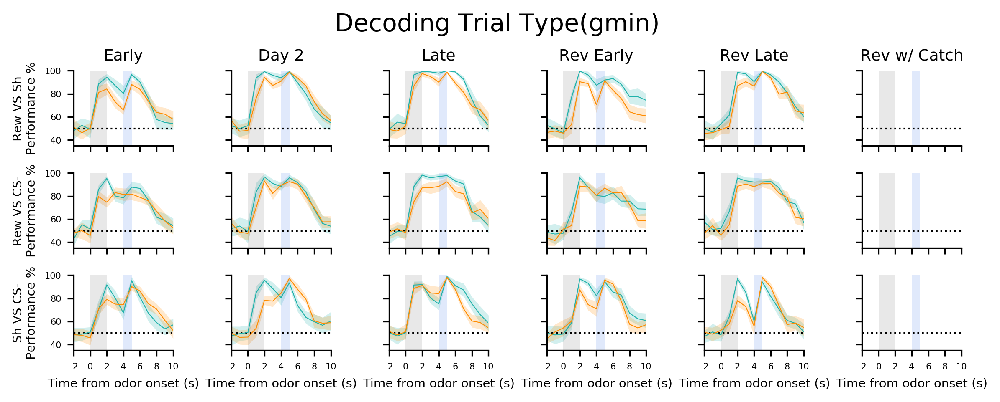

In [24]:
fig, ax = pl.subplots(3,6, figsize=(8, 3), sharex=True, sharey=True)
loops=10

for r,sess in zip(range(6),sessions):
    for c,label in zip(range(3),non_catch_labels):
        for reg,col in zip(('dhpc','vhpc'),('lightseagreen','darkorange')):
            ax[c][r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100) for t in range(13)],
                          color=col, ls='-',lw=.5 ,ms=1, label=reg)
            m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100) for t in range(13)])
            s = np.array([np.std(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100 for t in range(13)])
            ax[c][r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=col,linewidth=0)

for r in range(6):       
    for lab, c in zip(['Rew VS Sh','Rew VS CS-','Sh VS CS-'],range(3)):
        ax[c][r].set_ylim(35, 100)
        ax[c][r].set_xlim(-2, 10)
        ax[c][r].set_xticks(np.arange(-2,11, 2))
        ax[c][r].set_xticklabels(np.arange(-2,11, 2))
        ax[c][r].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
        ax[2][r].set_xlabel('Time from odor onset (s)')
        ax[c][0].set_ylabel(lab+'\nPerformance %')
        pt.plot_period_bar(ax[c][r], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.09)
        pt.plot_period_bar(ax[c][r], 0, start_end=(4, 5), color='cornflowerblue', delta_y=100, alpha=.2)
ax[0][0].set_title('Early', fontsize=9, color = 'k')
ax[0][1].set_title('Day 2', fontsize=9, color='k')
ax[0][2].set_title('Late', fontsize=9, color = 'k')
ax[0][3].set_title('Rev Early', fontsize=9, color = 'k')
ax[0][4].set_title('Rev Late', fontsize=9, color = 'k')
ax[0][5].set_title('Rev w/ Catch', fontsize=9, color='k')
ax[0][5].legend(bbox_to_anchor=(1.05,.9),labelspacing=0.45,fontsize=5)

pl.suptitle('Decoding Trial Type(gmin)',fontsize=14,y=1.05)
fig.tight_layout(pad=2)


fig.savefig('../figures/%s_gmin_lines_all.pdf'%NOTEBOOK_NAME)

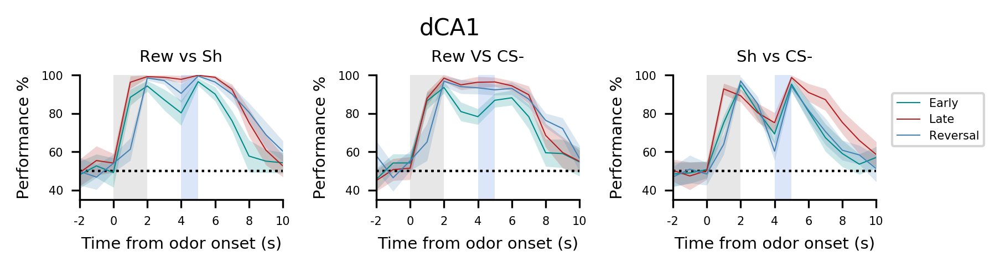

In [700]:
from matplotlib import cm
fig, ax = pl.subplots(1,3, figsize=(5.5, 1.5))
loops=10

for label,r in zip(non_catch_labels,range(3)):
    for sess,c,linsty,sessla in zip(sessions_to_plot,dark_co,linesty,session_labels):
        ax[r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_dhpc[sess][:loops]"%(t,label)))*100) for t in range(13)],
                color=c,linestyle=linsty,label=sessla)
        m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_dhpc[sess][:loops]"%(t,label)))*100) for t in range(13)])
        s = np.array([np.std(eval("scores_gmin_tb_%s_%s_dhpc[sess][:loops]"%(t,label)))*100 for t in range(13)])
        ax[r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=c,linewidth=0)
        ax[r].set_ylim(35, 100)
        ax[r].set_xlim(-2, 10)
        ax[r].set_xticks(np.arange(-2,11, 2))
        ax[r].set_xticklabels(np.arange(-2,11, 2))
        ax[r].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
        ax[r].set_xlabel('Time from odor onset (s)')
        ax[r].set_ylabel('Performance %')
        pt.plot_period_bar(ax[r], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.03)
        pt.plot_period_bar(ax[r], 0, start_end=(4, 5), color='cornflowerblue', delta_y=100, alpha=.08)
        fig.tight_layout(pad=2)
        ax[r].set_title(comp_labels[r])
ax[2].legend(bbox_to_anchor=(1.05,.9),labelspacing=0.45,fontsize=5)
pl.suptitle('dCA1',fontsize=10, y=1.04)

fig.savefig('../figures/%s_gmin_combined_dhpc.pdf'%NOTEBOOK_NAME)

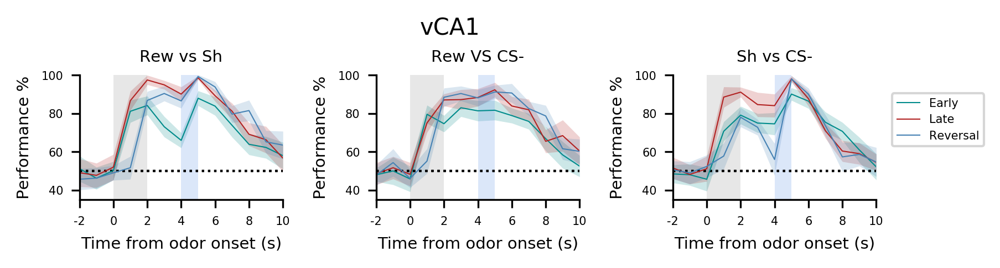

In [721]:
from matplotlib import cm
fig, ax = pl.subplots(1,3, figsize=(5.5, 1.5))
loops=10

for label,r in zip(non_catch_labels,range(3)):
    for sess,c,linsty,sessla in zip(sessions_to_plot,dark_co,linesty,session_labels):
        ax[r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_vhpc[sess][:loops]"%(t,label)))*100) for t in range(13)],
                color=c,linestyle=linsty,label=sessla)
        m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_vhpc[sess][:loops]"%(t,label)))*100) for t in range(13)])
        s = np.array([np.std(eval("scores_gmin_tb_%s_%s_vhpc[sess][:loops]"%(t,label)))*100 for t in range(13)])
        ax[r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=c,linewidth=0)
        ax[r].set_ylim(35, 100)
        ax[r].set_xlim(-2, 10)
        ax[r].set_xticks(np.arange(-2,11, 2))
        ax[r].set_xticklabels(np.arange(-2,11, 2))
        ax[r].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
        ax[r].set_xlabel('Time from odor onset (s)')
        ax[r].set_ylabel('Performance %')
        pt.plot_period_bar(ax[r], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.03)
        pt.plot_period_bar(ax[r], 0, start_end=(4, 5), color='cornflowerblue', delta_y=100, alpha=.08)
        fig.tight_layout(pad=2)
        ax[r].set_title(comp_labels[r])
ax[2].legend(bbox_to_anchor=(1.05,.9),labelspacing=0.45,fontsize=5)
pl.suptitle('vCA1',fontsize=10, y=1.04)

fig.savefig('../figures/%s_gmin_combined_vhpc.pdf'%NOTEBOOK_NAME)

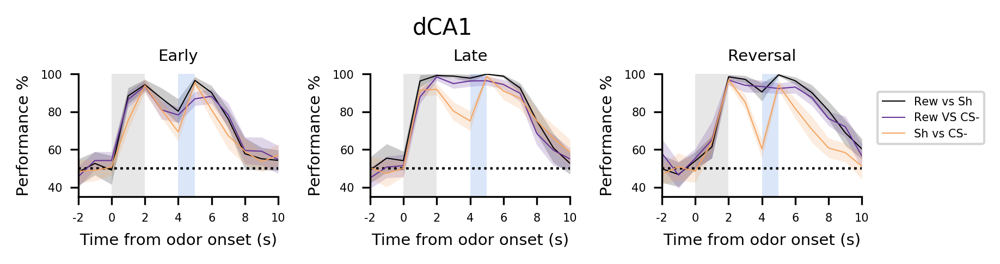

In [722]:
from matplotlib import cm
fig, ax = pl.subplots(1,3, figsize=(5.5, 1.5))
loops=10

for sess,r in zip(sessions_to_plot,range(3)):
    for label,c,linsty,compla in zip(non_catch_labels,comp_colors,linesty,comp_labels):
        ax[r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_dhpc[sess][:loops]"%(t,label)))*100) for t in range(13)],
                color=c,linestyle=linsty,label=compla)
        m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_dhpc[sess][:loops]"%(t,label)))*100) for t in range(13)])
        s = np.array([np.std(eval("scores_gmin_tb_%s_%s_dhpc[sess][:loops]"%(t,label)))*100 for t in range(13)])
        ax[r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=c,linewidth=0)
        ax[r].set_ylim(35, 100)
        ax[r].set_xlim(-2, 10)
        ax[r].set_xticks(np.arange(-2,11, 2))
        ax[r].set_xticklabels(np.arange(-2,11, 2))
        ax[r].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
        ax[r].set_xlabel('Time from odor onset (s)')
        ax[r].set_ylabel('Performance %')
        pt.plot_period_bar(ax[r], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.03)
        pt.plot_period_bar(ax[r], 0, start_end=(4, 5), color='cornflowerblue', delta_y=100, alpha=.08)
        fig.tight_layout(pad=2)
        ax[r].set_title(session_labels[r])
ax[2].legend(bbox_to_anchor=(1.05,.9),labelspacing=0.45,fontsize=5)
pl.suptitle('dCA1',fontsize=10, y=1.04)

#fig.savefig('../figures/%s_gmin_combined_dhpc.pdf'%NOTEBOOK_NAME)

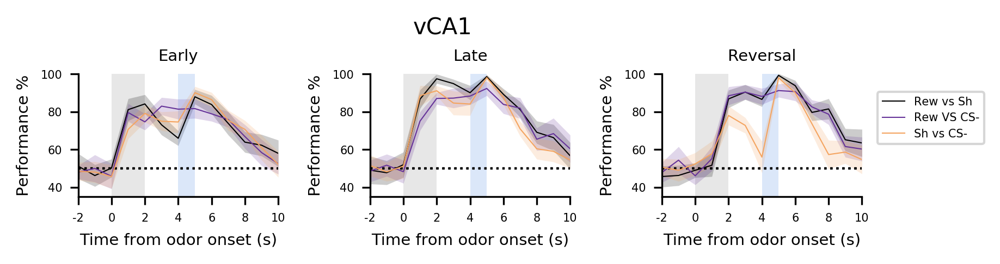

In [723]:
from matplotlib import cm
fig, ax = pl.subplots(1,3, figsize=(5.5, 1.5))
loops=10

for sess,r in zip(sessions_to_plot,range(3)):
    for label,c,linsty,compla in zip(non_catch_labels,comp_colors,linesty,comp_labels):
        ax[r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_vhpc[sess][:loops]"%(t,label)))*100) for t in range(13)],
                color=c,linestyle=linsty,label=compla)
        m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_vhpc[sess][:loops]"%(t,label)))*100) for t in range(13)])
        s = np.array([np.std(eval("scores_gmin_tb_%s_%s_vhpc[sess][:loops]"%(t,label)))*100 for t in range(13)])
        ax[r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=c,linewidth=0)
        ax[r].set_ylim(35, 100)
        ax[r].set_xlim(-2, 10)
        ax[r].set_xticks(np.arange(-2,11, 2))
        ax[r].set_xticklabels(np.arange(-2,11, 2))
        ax[r].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
        ax[r].set_xlabel('Time from odor onset (s)')
        ax[r].set_ylabel('Performance %')
        pt.plot_period_bar(ax[r], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.03)
        pt.plot_period_bar(ax[r], 0, start_end=(4, 5), color='cornflowerblue', delta_y=100, alpha=.08)
        fig.tight_layout(pad=2)
        ax[r].set_title(session_labels[r])
ax[2].legend(bbox_to_anchor=(1.05,.9),labelspacing=0.45,fontsize=5)
pl.suptitle('vCA1',fontsize=10, y=1.04)

#fig.savefig('../figures/%s_gmin_combined_vhpc.pdf'%NOTEBOOK_NAME)

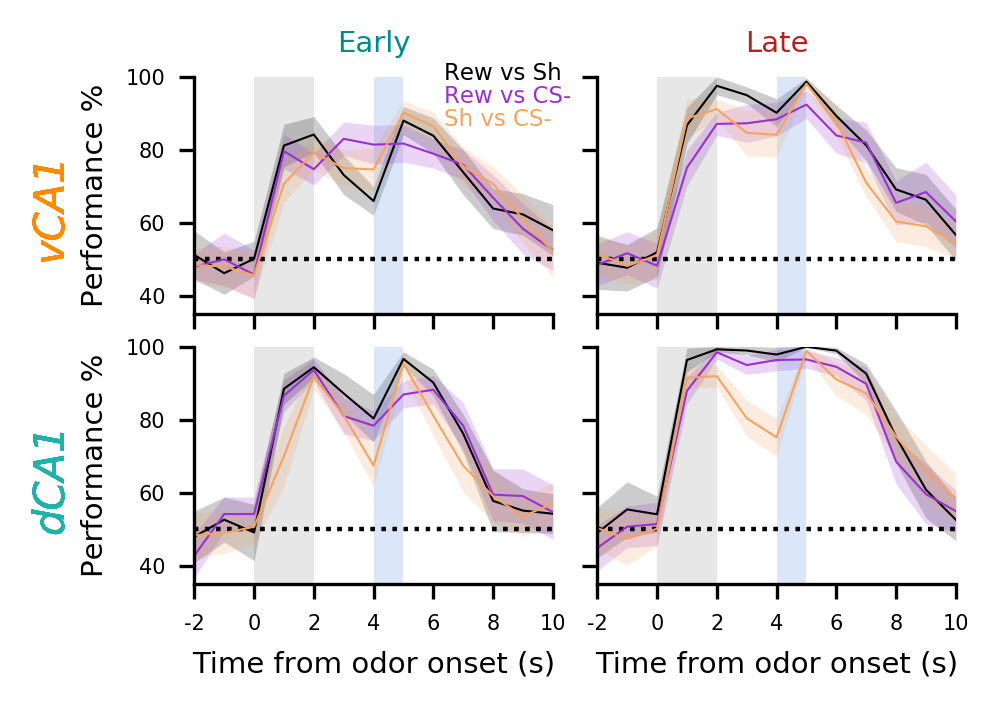

In [828]:
from matplotlib import cm
fig, ax = pl.subplots(2,2, figsize=(3.1, 2.3),sharex=True, sharey=True)
loops=10

for sess,r in zip(sessions_to_plot,range(2)):
    for label,c,linsty,compla in zip(non_catch_labels,comp_colors,linesty,comp_labels):
        for l,reg in zip(range(2),['vhpc','dhpc']):
            ax[l][r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100) for t in range(13)],
                    color=c,linestyle=linsty,label=compla)
            m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100) for t in range(13)])
            s = np.array([np.std(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100 for t in range(13)])
            ax[l][r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=c,linewidth=0)
            ax[l][r].set_ylim(35, 100)
            ax[l][r].set_xlim(-2, 10)
            ax[l][r].set_xticks(np.arange(-2,11, 2))
            ax[l][r].set_xticklabels(np.arange(-2,11, 2))
            ax[l][r].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
            ax[1][r].set_xlabel('Time from odor onset (s)')
            ax[l][0].set_ylabel('Performance %')
            pt.plot_period_bar(ax[l][r], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.03)
            pt.plot_period_bar(ax[l][r], 0, start_end=(4, 5), color='cornflowerblue', delta_y=100, alpha=.08)
            fig.tight_layout(pad=1)
            ax[0][r].set_title(session_labels[r],color=dark_co[r])
            ax[0][0].text(-7.5,70,'vCA1',rotation=90,color='darkorange',fontsize=10,fontstyle='italic')
            ax[1][0].text(-7.5,70,'dCA1',rotation=90,color='lightseagreen',fontsize=10,fontstyle='italic')
ax[0][0].text(6.35,-2+101.3,'Rew vs Sh',color=comp_colors[0],fontsize=5.5)
ax[0][0].text(6.35,-2+95,'Rew vs CS-',color=comp_colors[1],fontsize=5.5)
ax[0][0].text(6.35,-2+88.5,'Sh vs CS-',color=comp_colors[2],fontsize=5.5)

#ax[0][1].legend(bbox_to_anchor=(1.05,.9),labelspacing=0.45,fontsize=5)
#pl.suptitle('vCA1',fontsize=10, y=1.04)

fig.savefig('../figures/%s_gmin_ALLcomp_PrePo.pdf'%NOTEBOOK_NAME)

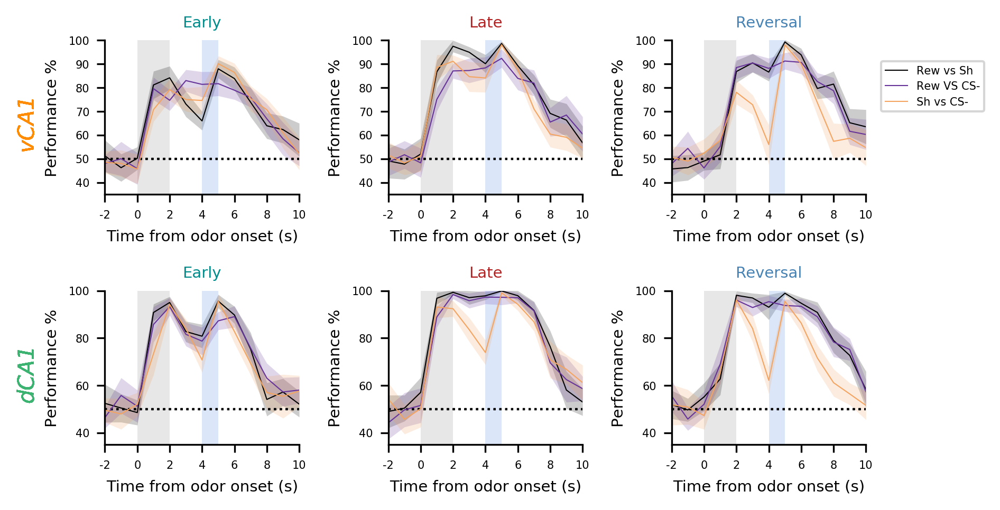

In [461]:
from matplotlib import cm
fig, ax = pl.subplots(2,3, figsize=(5.5, 3.3))
loops=10

for sess,r in zip(sessions_to_plot,range(3)):
    for label,c,linsty,compla in zip(non_catch_labels,comp_colors,linesty,comp_labels):
        for l,reg in zip(range(2),['vhpc','dhpc']):
            ax[l][r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100) for t in range(13)],
                    color=c,linestyle=linsty,label=compla)
            m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100) for t in range(13)])
            s = np.array([np.std(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100 for t in range(13)])
            ax[l][r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=c,linewidth=0)
            ax[l][r].set_ylim(35, 100)
            ax[l][r].set_xlim(-2, 10)
            ax[l][r].set_xticks(np.arange(-2,11, 2))
            ax[l][r].set_xticklabels(np.arange(-2,11, 2))
            ax[l][r].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
            ax[l][r].set_xlabel('Time from odor onset (s)')
            ax[l][r].set_ylabel('Performance %')
            pt.plot_period_bar(ax[l][r], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.03)
            pt.plot_period_bar(ax[l][r], 0, start_end=(4, 5), color='cornflowerblue', delta_y=100, alpha=.08)
            fig.tight_layout(pad=2)
            ax[l][r].set_title(session_labels[r],color=dark_co[r])
            ax[0][0].text(-7.5,70,'vCA1',rotation=90,color='darkorange',fontsize=10,fontstyle='italic')
            ax[1][0].text(-7.5,70,'dCA1',rotation=90,color='lightseagreen',fontsize=10,fontstyle='italic')
ax[0][2].legend(bbox_to_anchor=(1.05,.9),labelspacing=0.45,fontsize=5)
#pl.suptitle('vCA1',fontsize=10, y=1.04)

fig.savefig('../figures/%s_gmin_ALLcomp_ALLsess.pdf'%NOTEBOOK_NAME)

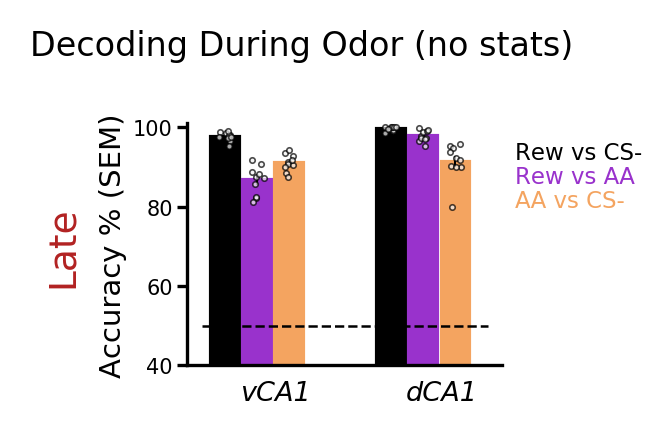

In [34]:
from matplotlib.patches import Patch
labels = ['vCA1','dCA1']
x = np.arange(len(labels))  # the label locations
width = 0.3# the width of the bars
loops=10
to_plot = [0,1]
t=4
fig, ax = pl.subplots(figsize=(1.7,1.3))

for comp,c,la,wide in zip(non_catch_labels,['k','darkorchid','sandybrown'],
                     ['Rew vs CS-','Rew vs AA','AA vs CS-'],[-width/3-.25,0,width/3+.25,0.5+.2]):
    ste = np.array(np.std(np.mean(eval("scores_gmin_tb_%s_%s_vhpc['post'][-loops:]"%(t,comp)),1))*100/np.sqrt(loops-1))
    ax.bar(wide, np.mean(eval("scores_gmin_tb_%s_%s_vhpc['post'][-loops:]"%(t,comp)))*100,
           width, edgecolor=c,color=c,yerr=ste)
    ax.scatter(wide+np.random.random(loops)*width/2-width/4.5, np.mean(eval("scores_gmin_tb_%s_%s_vhpc['post'][-loops:]"%(t,comp)),1)*100,
               color='whitesmoke',s=1.7,zorder=2,alpha=.7,linewidths=.4,edgecolor='k')
    
for comp,c,la,wide in zip(non_catch_labels,['k','darkorchid','sandybrown'],
                     ['Rew vs CS-','Rew vs AA','AA vs CS-'],[1.8+-width/3-.25,1.8+0,1.8+width/3+.25,1.8+0.5+.2]):
    ste = np.array(np.std(np.mean(eval("scores_gmin_tb_%s_%s_dhpc['post'][-loops:]"%(t,comp)),1))*100/np.sqrt(loops-1))
    ax.bar(wide, np.mean(eval("scores_gmin_tb_%s_%s_dhpc['post'][-loops:]"%(t,comp)))*100,
           width, edgecolor=c,color=c,yerr=ste)
    ax.scatter(wide+np.random.random(loops)*width/2-width/4.5, np.mean(eval("scores_gmin_tb_%s_%s_dhpc['post'][-loops:]"%(t,comp)),1)*100,
               color='whitesmoke',s=1.7,zorder=2,alpha=.7,linewidths=.4,edgecolor='k')

ax.hlines(50,-.6,2.5, color='k', lw=.6, linestyles='dashed')
# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Accuracy % (SEM)',labelpad=1.5)
#ax.set_title('Decoding During CS')
ax.set_ylim(40,101)
ax.set_xticks([0.2,2])
ax.set_xticklabels(labels,fontstyle='italic',fontsize=6.5)
#ax.legend([Patch(facecolor='darkorchid'),Patch(facecolor='sandybrown'),Patch(facecolor='darkturquoise')],
#          ['Rew','Shock','CS-'],loc=(.95,.6),frameon=False)
ax.text(2.8,92,'Rew vs CS-',color='k',fontsize=5.5)
ax.text(2.8,86,'Rew vs AA',color='darkorchid',fontsize=5.5)
ax.text(2.8,80,'AA vs CS-',color='sandybrown',fontsize=5.5)
ax.tick_params(axis='both',bottom=False,pad=1,length=2.5)
#pvs=[]
#test='ttest'
#for reg,i in zip(['vhpc','dhpc'], [0,1.8]):
#    pvs.append(add_significance(ax,np.mean(eval("scores_gmins_%s_%s_consumed_vs_run_CSm_%s['post'][-loops:]"%(tb,t,reg)),1),
#                                np.mean(eval("scores_gmins_%s_%s_consumed_vs_run_AA_%s['post'][-loops:]"%(tb,t,reg)),1),
#                                -width/3-.25+i,i-.03,104,sig_func=test,mcc=2))
#    pvs.append(add_significance(ax,np.mean(eval("scores_gmins_%s_%s_consumed_vs_run_AA_%s['post'][-loops:]"%(tb,t,reg)),1),
#                                np.mean(eval("scores_gmins_%s_%s_run_CSm_vs_run_AA_%s['post'][-loops:]"%(tb,t,reg)),1),
#        i+.03,width/3+.25+i,104,sig_func=test,mcc=2))
#    pvs.append(add_significance(ax,np.mean(eval("scores_gmins_%s_%s_consumed_vs_run_CSm_%s['post'][-loops:]"%(tb,t,reg)),1),
#                                np.mean(eval("scores_gmins_%s_%s_run_CSm_vs_run_AA_%s['post'][-loops:]"%(tb,t,reg)),1),
#        -width/3-.25+i,width/3+.25+i,111,sig_func=test,mcc=2))
#    #print reg,'rw/sh',report_stats(eval("scores_tb_4_rw_%s['post'][-loops:]"%reg), eval("scores_tb_4_sh_%s['post'][-loops:]"%reg),mcc=2)
#    #print reg,'rw/CS-',report_stats(eval("scores_tb_4_rw_%s['post'][-loops:]"%reg), eval("scores_tb_4_csm_%s['post'][-loops:]"%reg),mcc=2)
#    #print reg,'sh/CS-',report_stats(eval("scores_tb_4_sh_%s['post'][-loops:]"%reg), eval("scores_tb_4_csm_%s['post'][-loops:]"%reg),mcc=2)

pl.suptitle('Decoding During Odor (no stats)',y=1.1,fontsize=8)
ax.text(-2.1,70,'Late',rotation=90,fontsize=9,color='firebrick',ha='center',va='center')
fig.tight_layout(pad=2.5)

fig.savefig('../figures/%s_bars_odor.jpg'%NOTEBOOK_NAME)

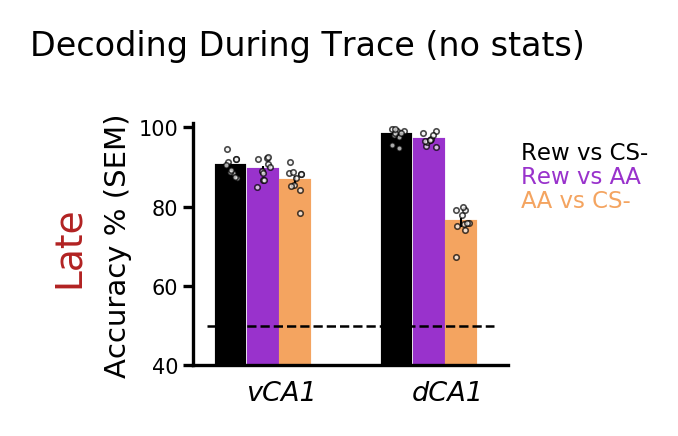

In [33]:
from matplotlib.patches import Patch
labels = ['vCA1','dCA1']
x = np.arange(len(labels))  # the label locations
width = 0.3# the width of the bars
loops=10
to_plot = [0,1]
t=6
tb='1s'
fig, ax = pl.subplots(figsize=(1.7,1.3))

for comp,c,la,wide in zip(non_catch_labels,['k','darkorchid','sandybrown'],
                     ['Rew vs CS-','Rew vs AA','AA vs CS-'],[-width/3-.25,0,width/3+.25,0.5+.2]):
    ste = np.array(np.std(np.mean(eval("scores_gmin_tb_%s_%s_vhpc['post'][-loops:]"%(t,comp)),1))*100/np.sqrt(loops-1))
    ax.bar(wide, np.mean(eval("scores_gmin_tb_%s_%s_vhpc['post'][-loops:]"%(t,comp)))*100,
           width, edgecolor=c,color=c,yerr=ste)
    ax.scatter(wide+np.random.random(loops)*width/2-width/4.5, np.mean(eval("scores_gmin_tb_%s_%s_vhpc['post'][-loops:]"%(t,comp)),1)*100,
               color='whitesmoke',s=1.7,zorder=2,alpha=.7,linewidths=.4,edgecolor='k')
    
for comp,c,la,wide in zip(non_catch_labels,['k','darkorchid','sandybrown'],
                     ['Rew vs CS-','Rew vs AA','AA vs CS-'],[1.8+-width/3-.25,1.8+0,1.8+width/3+.25,1.8+0.5+.2]):
    ste = np.array(np.std(np.mean(eval("scores_gmin_tb_%s_%s_dhpc['post'][-loops:]"%(t,comp)),1))*100/np.sqrt(loops-1))
    ax.bar(wide, np.mean(eval("scores_gmin_tb_%s_%s_dhpc['post'][-loops:]"%(t,comp)))*100,
           width, edgecolor=c,color=c,yerr=ste)
    ax.scatter(wide+np.random.random(loops)*width/2-width/4.5, np.mean(eval("scores_gmin_tb_%s_%s_dhpc['post'][-loops:]"%(t,comp)),1)*100,
               color='whitesmoke',s=1.7,zorder=2,alpha=.7,linewidths=.4,edgecolor='k')

ax.hlines(50,-.6,2.5, color='k', lw=.6, linestyles='dashed')
# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Accuracy % (SEM)',labelpad=1.5)
#ax.set_title('Decoding During CS')
ax.set_ylim(40,101)
ax.set_xticks([0.2,2])
ax.set_xticklabels(labels,fontstyle='italic',fontsize=6.5)
#ax.legend([Patch(facecolor='darkorchid'),Patch(facecolor='sandybrown'),Patch(facecolor='darkturquoise')],
#          ['Rew','Shock','CS-'],loc=(.95,.6),frameon=False)
ax.text(2.8,92,'Rew vs CS-',color='k',fontsize=5.5)
ax.text(2.8,86,'Rew vs AA',color='darkorchid',fontsize=5.5)
ax.text(2.8,80,'AA vs CS-',color='sandybrown',fontsize=5.5)
ax.tick_params(axis='both',bottom=False,pad=1,length=2.5)
#pvs=[]
#test='ttest'
#for reg,i in zip(['vhpc','dhpc'], [0,1.8]):
#    pvs.append(add_significance(ax,np.mean(eval("scores_gmins_%s_%s_consumed_vs_run_CSm_%s['post'][-loops:]"%(tb,t,reg)),1),
#                                np.mean(eval("scores_gmins_%s_%s_consumed_vs_run_AA_%s['post'][-loops:]"%(tb,t,reg)),1),
#                                -width/3-.25+i,i-.03,104,sig_func=test,mcc=2))
#    pvs.append(add_significance(ax,np.mean(eval("scores_gmins_%s_%s_consumed_vs_run_AA_%s['post'][-loops:]"%(tb,t,reg)),1),
#                                np.mean(eval("scores_gmins_%s_%s_run_CSm_vs_run_AA_%s['post'][-loops:]"%(tb,t,reg)),1),
#        i+.03,width/3+.25+i,104,sig_func=test,mcc=2))
#    pvs.append(add_significance(ax,np.mean(eval("scores_gmins_%s_%s_consumed_vs_run_CSm_%s['post'][-loops:]"%(tb,t,reg)),1),
#                                np.mean(eval("scores_gmins_%s_%s_run_CSm_vs_run_AA_%s['post'][-loops:]"%(tb,t,reg)),1),
#        -width/3-.25+i,width/3+.25+i,111,sig_func=test,mcc=2))
#    #print reg,'rw/sh',report_stats(eval("scores_tb_4_rw_%s['post'][-loops:]"%reg), eval("scores_tb_4_sh_%s['post'][-loops:]"%reg),mcc=2)
#    #print reg,'rw/CS-',report_stats(eval("scores_tb_4_rw_%s['post'][-loops:]"%reg), eval("scores_tb_4_csm_%s['post'][-loops:]"%reg),mcc=2)
#    #print reg,'sh/CS-',report_stats(eval("scores_tb_4_sh_%s['post'][-loops:]"%reg), eval("scores_tb_4_csm_%s['post'][-loops:]"%reg),mcc=2)

pl.suptitle('Decoding During Trace (no stats)',y=1.1,fontsize=8)
ax.text(-2.1,70,'Late',rotation=90,fontsize=9,color='firebrick',ha='center',va='center')
fig.tight_layout(pad=2.5)

fig.savefig('../figures/%s_bars_tr.jpg'%NOTEBOOK_NAME)

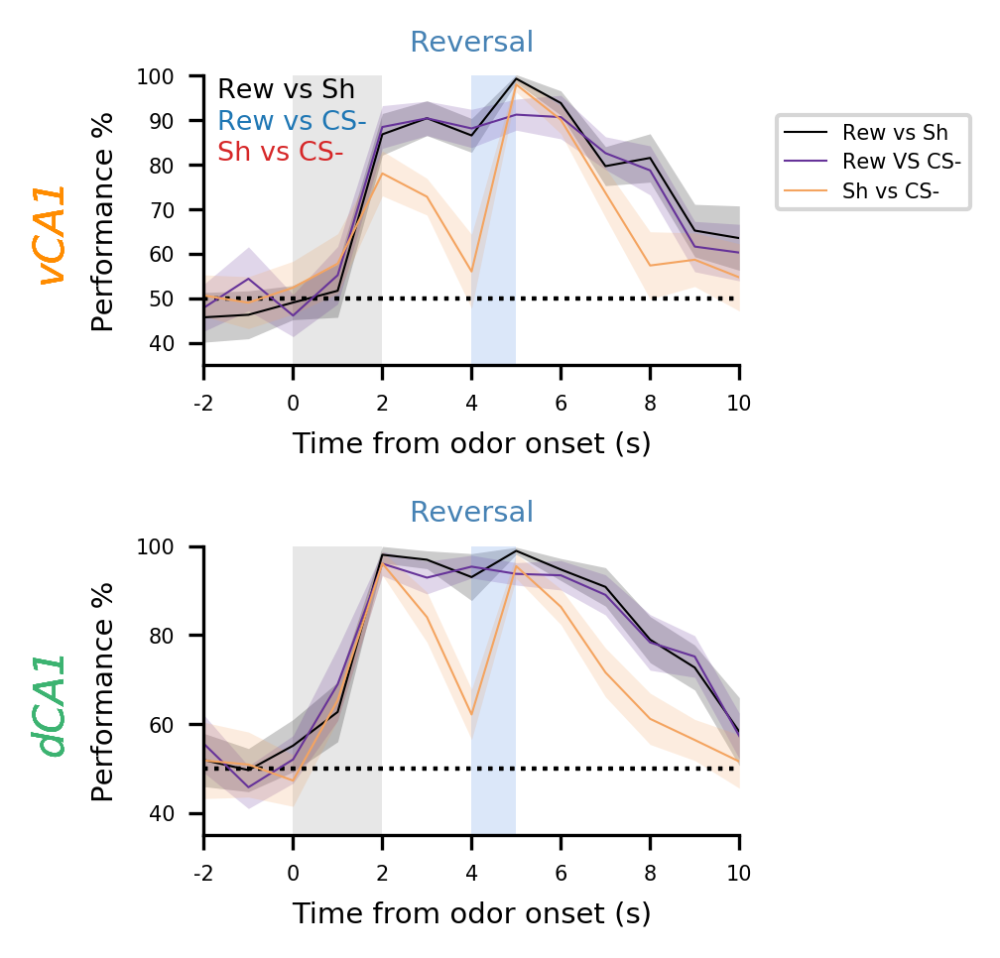

In [468]:
from matplotlib import cm
fig, ax = pl.subplots(2,1, figsize=(2.5, 3.3))
loops=10
sess='post_rev'

for label,c,linsty,compla in zip(non_catch_labels,comp_colors,linesty,comp_labels):
        for l,reg in zip(range(2),['vhpc','dhpc']):
            ax[l].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100) for t in range(13)],
                    color=c,linestyle=linsty,label=compla)
            m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100) for t in range(13)])
            s = np.array([np.std(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100 for t in range(13)])
            ax[l].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=c,linewidth=0)
            ax[l].set_ylim(35, 100)
            ax[l].set_xlim(-2, 10)
            ax[l].set_xticks(np.arange(-2,11, 2))
            ax[l].set_xticklabels(np.arange(-2,11, 2))
            ax[l].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
            ax[l].set_xlabel('Time from odor onset (s)')
            ax[l].set_ylabel('Performance %')
            pt.plot_period_bar(ax[l], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.03)
            pt.plot_period_bar(ax[l], 0, start_end=(4, 5), color='cornflowerblue', delta_y=100, alpha=.08)
            fig.tight_layout(pad=2)
            ax[l].set_title('Reversal',color=dark_co[-1])
            ax[0].text(-5.9,70,'vCA1',rotation=90,color='darkorange',fontsize=10,fontstyle='italic')
            ax[1].text(-5.9,70,'dCA1',rotation=90,color='lightseagreen',fontsize=10,fontstyle='italic')
ax[0].legend(bbox_to_anchor=(1.05,.9),labelspacing=0.45,fontsize=5)
ax[0].text(-1.7,95,'Rew vs Sh',color='k',fontsize=6.5)
ax[0].text(-1.7,88,'Rew vs CS-',color='tab:blue',fontsize=6.5)
ax[0].text(-1.7,81,'Sh vs CS-',color='tab:red',fontsize=6.5)
#pl.suptitle('vCA1',fontsize=10, y=1.04)

#fig.savefig('../figures/%s_gmin_ALLcomp_Porev.pdf'%NOTEBOOK_NAME)

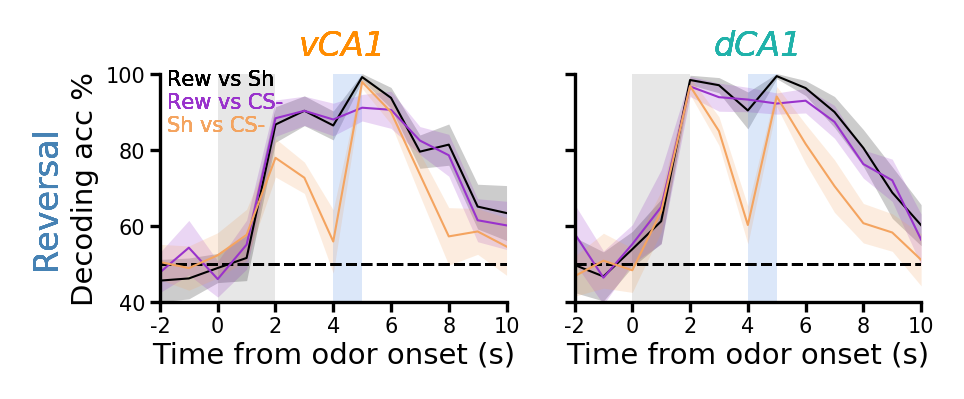

In [781]:
from matplotlib import cm
fig, ax = pl.subplots(1,2, figsize=(3.05, 1.2),sharey=True)
loops=10
sess='post_rev'

for label,c,linsty,compla in zip(non_catch_labels,['black','darkorchid','sandybrown'],linesty,comp_labels):
        for l,reg in zip(range(2),['vhpc','dhpc']):
            ax[l].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100) for t in range(13)],
                    color=c,linestyle=linsty,label=compla)
            m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100) for t in range(13)])
            s = np.array([np.std(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100 for t in range(13)])
            ax[l].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=c,linewidth=0)
            ax[l].set_ylim(40, 100)
            ax[l].tick_params(axis='both',pad=1,length=2.5)
            ax[l].set_xlim(-2, 10)
            ax[l].set_xticks(np.arange(-2,11, 2))
            ax[l].set_xticklabels(np.arange(-2,11, 2))
            ax[l].hlines(50, -2,10, color='k', lw=.7, linestyles='dashed')
            ax[l].set_xlabel('Time from odor onset (s)',labelpad=1)
            ax[0].set_ylabel('Decoding acc %',labelpad=1.5)
            pt.plot_period_bar(ax[l], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.03)
            pt.plot_period_bar(ax[l], 0, start_end=(4, 5), color='cornflowerblue', delta_y=100, alpha=.08)
            fig.tight_layout(pad=2)
            #ax[l].set_title('Reversal',color=dark_co[-1])
            ax[0].text(2.8,105,'vCA1',color='darkorange',fontsize=8,fontstyle='italic')
            ax[1].text(2.8,105,'dCA1',color='lightseagreen',fontsize=8,fontstyle='italic')
            ax[0].text(-6.5,80,'Reversal',rotation=90,color=dark_co[-1],fontsize=8)
            ax[0].text(-1.75,97,'Rew vs Sh',color='k',fontsize=5)
            ax[0].text(-1.75,91,'Rew vs CS-',color='darkorchid',fontsize=5)
            ax[0].text(-1.75,85,'Sh vs CS-',color='sandybrown',fontsize=5)

#pl.suptitle('vCA1',fontsize=10, y=1.04)
fig.tight_layout(pad=1)

fig.savefig('../figures/%s_gmin_ALLcomp_Porev.pdf'%NOTEBOOK_NAME)

In [8]:
import matplotlib.lines
from matplotlib.lines import Line2D
def add_significance_line(ax, array1, array2, x1, x2, y, color1='b',color2='r',thresh=0.05, sig_func=None, thresholds=(0.05, 0.01, 0.001),lines=True,stars=True,mcc=1):
    if sig_func is None:
        sig_func = lambda x, y: sstats.mannwhitneyu(x, y, alternative='two-sided')
    p = sig_func(array1, array2)[-1]
    sig_value = sig_func(array1, array2)[0]
    if lines==True:
        if p < thresh/mcc:
            if np.mean(array1) > np.mean(array2):
                line = Line2D([x1, x2], [y,y], lw=1, color=color1, clip_on=False)
            if np.mean(array1) < np.mean(array2):
                line = Line2D([x1, x2], [y,y], lw=1, color=color2, clip_on=False)
            ax.add_line(line)
    if stars == True:
        ax.text(np.mean([x1, x2]), y+1,
            '' if p > thresholds[0]/mcc else
            '' if p > thresholds[1]/mcc else
            '**' if p > thresholds[2]/mcc else
            '***',
            ha='center', fontsize=5)
    return sig_value, p

In [9]:
#mmc = multiple-comparisons correction (using bonferroni), where mcc = number of comparisons))

from matplotlib.lines import Line2D
def add_significance_point(ax, array1, array2, x1, y, ticksize=0.02, sig_func=None, thresholds=(0.05, 0.01, 0.001),
                                   mcc=1,color='k',symbol='*'):
    if sig_func is None:
        sig_func = lambda x, y: sstats.mannwhitneyu(x, y, alternative='two-sided')
    p = sig_func(array1, array2)[-1]
    sig_value = sig_func(array1, array2)[0]
    deltay = np.diff(ax.axis()[-2:])*ticksize
    #line = Line2D([x1, x1, x2, x2], [y-deltay, y, y, y-deltay], lw=.5, color='k', clip_on=False)
    #ax.add_line(line)
    ax.text(x1, y,
            "" if p > thresholds[0]/mcc else
            symbol if p > thresholds[1]/mcc else
            symbol+symbol if p > thresholds[2]/mcc else
            symbol+symbol+symbol,
            #symbol if p < thresholds[1]/mcc else
            #"",
            ha='center', fontsize=5,color=color)
    return sig_value, p

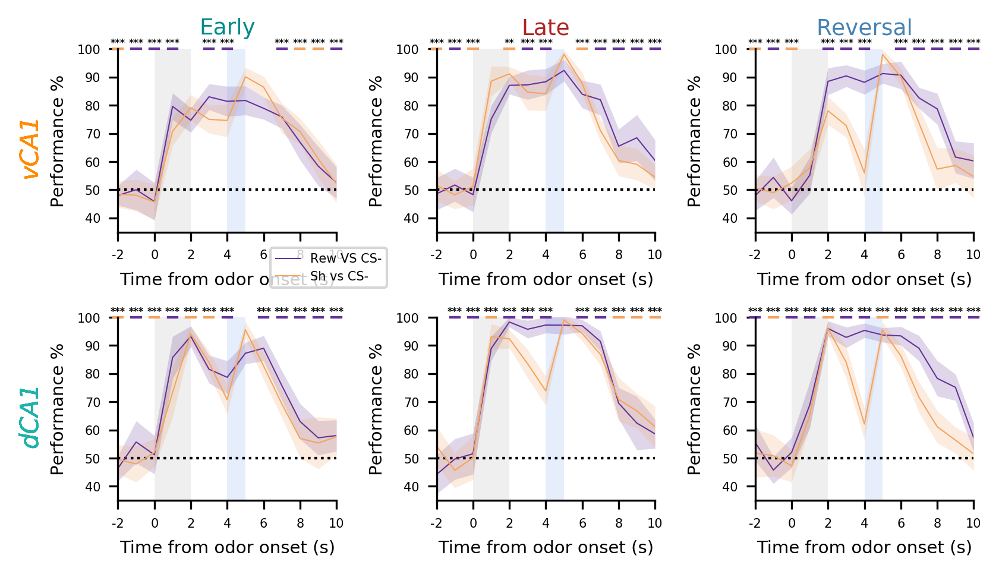

In [622]:
from matplotlib import cm
fig, ax = pl.subplots(2,3, figsize=(5.5, 3.3))
loops=10

for sess,r in zip(sessions_to_plot,range(3)):
    for label,c,linsty,compla in zip(non_catch_labels[-2:],[comp_colors[1],comp_colors[2]],linesty[-2:],comp_labels[-2:]):
        for l,reg in zip(range(2),['vhpc','dhpc']):
            ax[l][r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100) for t in range(13)],
                    color=c,linestyle=linsty,label=compla)
            m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100) for t in range(13)])
            s = np.array([np.std(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,reg)))*100 for t in range(13)])
            ax[l][r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=c,linewidth=0)
            ax[l][r].set_ylim(35, 100)
            ax[l][r].set_xlim(-2, 10)
            ax[l][r].set_xticks(np.arange(-2,11, 2))
            ax[l][r].set_xticklabels(np.arange(-2,11, 2))
            ax[l][r].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
            ax[l][r].set_xlabel('Time from odor onset (s)')
            ax[l][r].set_ylabel('Performance %')
            pt.plot_period_bar(ax[l][r], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.03)
            pt.plot_period_bar(ax[l][r], 0, start_end=(4, 5), color='cornflowerblue', delta_y=100, alpha=.08)
            fig.tight_layout(pad=2)
            ax[0][r].set_title(session_labels[r],color=dark_co[r],fontsize=9)
            ax[0][0].text(-7.5,70,'vCA1',rotation=90,color='darkorange',fontsize=10,fontstyle='italic')
            ax[1][0].text(-7.5,70,'dCA1',rotation=90,color='lightseagreen',fontsize=10,fontstyle='italic')
            for t in range(13):
                add_significance_line(ax[l][r], eval("scores_gmin_tb_%s_rwVScsm_%s[sess][:loops]"%(t,reg)),
                    eval("scores_gmin_tb_%s_shVScsm_%s[sess][:loops]"%(t,reg)),t-2.25, t-1.75, 100,color1=comp_colors[1],
                    color2=comp_colors[2],thresh=.01,lines=True,stars=True,sig_func=None, thresholds=(0.05, 0.01, 0.001),mcc=1)
ax[1][0].legend(bbox_to_anchor=(.67,1.13),labelspacing=0.45,fontsize=5)
#pl.suptitle('vCA1',fontsize=10, y=1.04)

#fig.savefig('../figures/%s_gmin_combined_vhpc.pdf'%NOTEBOOK_NAME)

In [10]:
#mmc = multiple-comparisons correction (using bonferroni), where mcc = number of comparisons))

from matplotlib.lines import Line2D
def add_significance(ax, array1, array2, x1, x2, y, ticksize=0.02, sig_func=None, thresholds=(0.05, 0.01, 0.001),mcc=1):
    if sig_func is None:
        sig_func = lambda x, y: sstats.mannwhitneyu(x, y, alternative='two-sided')
    p = sig_func(array1, array2)[-1]
    sig_value = sig_func(array1, array2)[0]
    deltay = np.diff(ax.axis()[-2:])*ticksize
    line = Line2D([x1, x1, x2, x2], [y-deltay, y, y, y-deltay], lw=.5, color='k', clip_on=False)
    ax.add_line(line)
    ax.text(np.mean([x1, x2]), y+1,
            'n.s.' if p > thresholds[0]/mcc else
            '*' if p > thresholds[1]/mcc else
            '**' if p > thresholds[2]/mcc else
            '***',
            ha='center', fontsize=5)
    return sig_value, p

In [11]:
def sig_vs_chance(ax, array1, chance, x1, y1, loops=loops, ticksize=0.02, sig_func=None, thresholds=(0.05, 0.01, 0.001),colors='k'):
    if sig_func is None:
        sig_func = lambda x: sstats.wilcoxon(x)
        subtracted = [x-chance for x in array1]
        p = sig_func(subtracted)[-1]
        sig_value = sig_func(subtracted)[0]
    elif sig_func is ttest:
        sig_func = lambda x, y: sstats.ttest_1samp(x,y)
        p = sig_func(array1,chance)[-1]
        sig_value = sig_func(array1,chance)[0]
    ax.text(x1, y1,
            'n.s.' if p>thresholds[0] else
            '*' if p>thresholds[1] else
            '**' if p>thresholds[2] else
            '***',
            ha='center', fontsize=5, color=colors)
    return sig_value, p

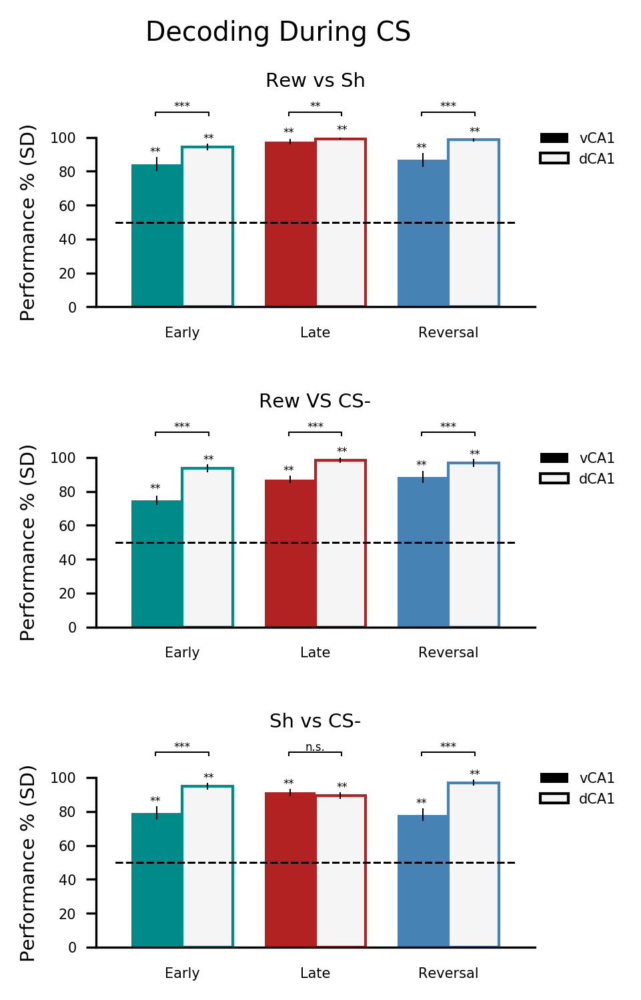

In [703]:
from matplotlib.patches import Patch
labels = session_labels
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 10
v={}
d={}

fig, ax = pl.subplots(3,1,figsize=(3,5),sharey=True)
for lab, l in zip(non_catch_labels,range(3)):
    for sess,c,i in zip(sessions_to_plot,dark_co,range(len(sessions_to_plot))):
        v[sess] = np.array(np.std(eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab))*100)
        ax[l].bar(i - width/2, np.mean(eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab))*100, width, color=c,yerr=v[sess])
        d[sess] = np.array(np.std(eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab))*100)
        ax[l].bar(i + width/2,  np.mean(eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab))*100, width,color='whitesmoke', edgecolor=c,yerr=d[sess])
        ax[l].hlines(50,-.5,2.5, color='k', lw=.7, linestyles='dashed')
        # Add some text for labels, title and custom x-axis tick labels, etc.
        ax[l].set_ylabel('Performance % (SD)')
        #ax.set_title('Decoding During CS')
        ax[l].set_xticks(x)
        ax[l].set_xticklabels(labels)
        ax[l].legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
        ax[l].tick_params(axis='x',bottom=False)
        ax[l].set_ylim(0,100)
        ax[l].set_title(comp_labels[l],y=1.2)
pvs=[]
for lab, l in zip(non_catch_labels,range(3)):
    for sess,i in zip(sessions_to_plot, range(len(sessions_to_plot))):
        pvs.append(add_significance(ax[l], eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab), eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab),
            -.2+i,0.2+i,115))
        pvs.append(sig_vs_chance(ax[l],eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab),.5,-.2+i,
                   np.mean(eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab))*100+v[sess]+1,loops=loops,sig_func=None,colors='k'))
        pvs.append(sig_vs_chance(ax[l],eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab),.5, .2+i,
                   np.mean(eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab))*100+d[sess]+1,loops=loops,sig_func=None,colors='k'))
pl.suptitle('Decoding During CS',y=1,fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../img/%s_gmin_bars_CS_all.jpg'%NOTEBOOK_NAME)

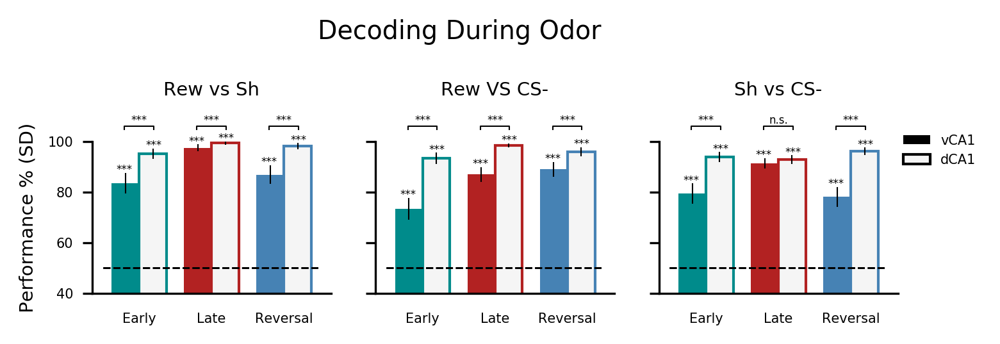

In [204]:
from matplotlib.patches import Patch
labels = session_labels
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 15
v={}
d={}
pvs=[]

fig, ax = pl.subplots(1,3,figsize=(5,1.8),sharey=True)
for lab, l in zip(non_catch_labels,range(3)):
    for sess,c,i in zip(sessions_to_plot,dark_co,range(len(sessions_to_plot))):
        v[sess] = np.array(np.std(eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab))*100)
        ax[l].bar(i - width/2, np.mean(eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab))*100, width, color=c,yerr=v[sess])
        d[sess] = np.array(np.std(eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab))*100)
        ax[l].bar(i + width/2,  np.mean(eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab))*100, width,color='whitesmoke', edgecolor=c,yerr=d[sess])
        ax[l].hlines(50,-.5,2.5, color='k', lw=.7, linestyles='dashed')
        # Add some text for labels, title and custom x-axis tick labels, etc.
        ax[0].set_ylabel('Performance % (SD)')
        #ax.set_title('Decoding During CS')
        ax[l].set_xticks(x)
        ax[l].set_xticklabels(labels)
        ax[2].legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
        ax[l].tick_params(axis='x',bottom=False)
        ax[l].set_ylim(40,100)
        ax[l].set_title(comp_labels[l],y=1.2)

        pvs.append(add_significance(ax[l], eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab), eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab),
            -.2+i,0.2+i,106))
        pvs.append(sig_vs_chance(ax[l],eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab),.5,-.2+i,
                   np.mean(eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab))*100+v[sess],loops=loops,sig_func=None,colors='k'))
        pvs.append(sig_vs_chance(ax[l],eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab),.5, .2+i,
                   np.mean(eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab))*100+d[sess],loops=loops,sig_func=None,colors='k'))
pl.suptitle('Decoding During Odor',y=1,fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../img/%s_gmin_bars_CS.jpg'%NOTEBOOK_NAME)

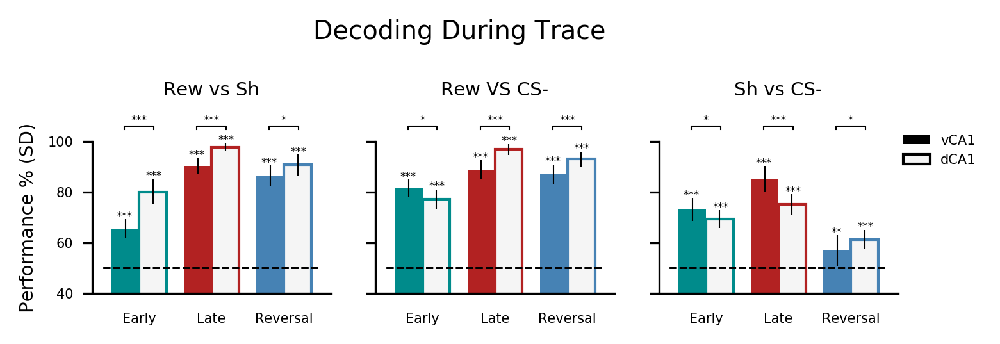

In [788]:
from matplotlib.patches import Patch
labels = session_labels
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 15
v={}
d={}
pvs=[]

fig, ax = pl.subplots(1,3,figsize=(5,1.8),sharey=True)
for lab, l in zip(non_catch_labels,range(3)):
    for sess,c,i in zip(sessions_to_plot,dark_co,range(len(sessions_to_plot))):
        v[sess] = np.array(np.std(eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab))*100)
        ax[l].bar(i - width/2, np.mean(eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab))*100, width, color=c,yerr=v[sess])
        d[sess] = np.array(np.std(eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab))*100)
        ax[l].bar(i + width/2,  np.mean(eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab))*100, width,color='whitesmoke', edgecolor=c,yerr=d[sess])
        ax[l].hlines(50,-.5,2.5, color='k', lw=.7, linestyles='dashed')
        # Add some text for labels, title and custom x-axis tick labels, etc.
        ax[0].set_ylabel('Performance % (SD)')
        #ax.set_title('Decoding During CS')
        ax[l].set_xticks(x)
        ax[l].set_xticklabels(labels)
        ax[2].legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
        ax[l].tick_params(axis='x',bottom=False)
        ax[l].set_ylim(40,100)
        ax[l].set_title(comp_labels[l],y=1.2)

        pvs.append(add_significance(ax[l], eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab), eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab),
            -.2+i,0.2+i,106))
        pvs.append(sig_vs_chance(ax[l],eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab),.5,-.2+i,
                   np.mean(eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab))*100+v[sess],loops=loops,sig_func=None,colors='k'))
        pvs.append(sig_vs_chance(ax[l],eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab),.5, .2+i,
                   np.mean(eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab))*100+d[sess],loops=loops,sig_func=None,colors='k'))
pl.suptitle('Decoding During Trace',y=1,fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../img/%s_gmin_bars_Tr.jpg'%NOTEBOOK_NAME)

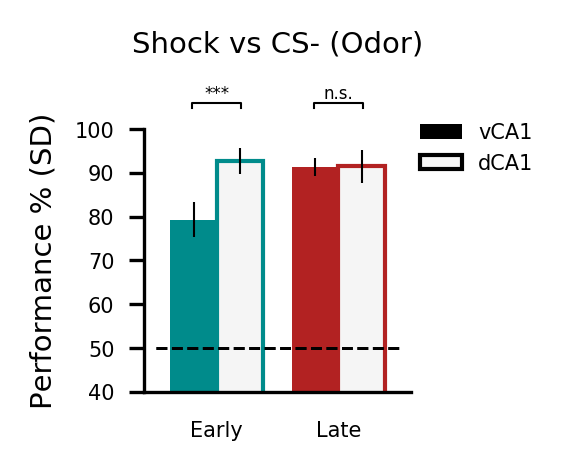

In [804]:
from matplotlib.patches import Patch
labels = session_labels[:-1]
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 15
v={}
d={}
pvs=[]

fig, ax = pl.subplots(1,1,figsize=(1.7,1.9),sharey=True)
for sess,c,i in zip(['pre','post'],dark_co,range(2)):
    v[sess] = np.array(np.std(mean_scores_gmin_tb_4_shVScsm_vhpc[sess][:loops])*100)
    ax.bar(i - width/2, np.mean(mean_scores_gmin_tb_4_shVScsm_vhpc[sess][:loops])*100, width, color=c,yerr=v[sess])
    d[sess] = np.array(np.std(mean_scores_gmin_tb_4_shVScsm_dhpc[sess][:loops])*100)
    ax.bar(i + width/2,  np.mean(mean_scores_gmin_tb_4_shVScsm_dhpc[sess][:loops])*100, width,color='whitesmoke', edgecolor=c,yerr=d[sess])
    ax.hlines(50,-.5,1.5, color='k', lw=.7, linestyles='dashed')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Performance % (SD)')
    #ax.set_title('Decoding During CS')
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
    ax.tick_params(axis='x',bottom=False)
    ax.set_ylim(40,100)
    ax.set_title('Shock vs CS- (Odor)',y=1.2)

    pvs.append(add_significance(ax,mean_scores_gmin_tb_4_shVScsm_vhpc[sess][:loops],mean_scores_gmin_tb_4_shVScsm_dhpc[sess][:loops],
        -.2+i,0.2+i,106))
    #pvs.append(sig_vs_chance(ax,eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab),.5,-.2+i,
    #           np.mean(eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab))*100+v[sess],loops=loops,sig_func=None,colors='k'))
    #pvs.append(sig_vs_chance(ax,eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab),.5, .2+i,
    #           np.mean(eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab))*100+d[sess],loops=loops,sig_func=None,colors='k'))
#pl.suptitle('Decoding During Delay',fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../figures/%s_gmin_bars_CS_shOnly.pdf'%NOTEBOOK_NAME)

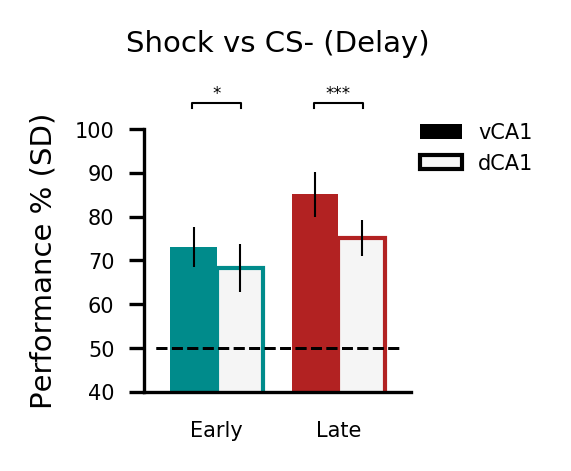

In [805]:
from matplotlib.patches import Patch
labels = session_labels[:-1]
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 15
v={}
d={}
pvs=[]

fig, ax = pl.subplots(1,1,figsize=(1.7,1.9),sharey=True)
for sess,c,i in zip(['pre','post'],dark_co,range(2)):
    v[sess] = np.array(np.std(mean_scores_gmin_tb_6_shVScsm_vhpc[sess][:loops])*100)
    ax.bar(i - width/2, np.mean(mean_scores_gmin_tb_6_shVScsm_vhpc[sess][:loops])*100, width, color=c,yerr=v[sess])
    d[sess] = np.array(np.std(mean_scores_gmin_tb_6_shVScsm_dhpc[sess][:loops])*100)
    ax.bar(i + width/2,  np.mean(mean_scores_gmin_tb_6_shVScsm_dhpc[sess][:loops])*100, width,color='whitesmoke', edgecolor=c,yerr=d[sess])
    ax.hlines(50,-.5,1.5, color='k', lw=.7, linestyles='dashed')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Performance % (SD)')
    #ax.set_title('Decoding During CS')
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
    ax.tick_params(axis='x',bottom=False)
    ax.set_ylim(40,100)
    ax.set_title('Shock vs CS- (Delay)',y=1.2)

    pvs.append(add_significance(ax,mean_scores_gmin_tb_6_shVScsm_vhpc[sess][:loops],mean_scores_gmin_tb_6_shVScsm_dhpc[sess][:loops],
        -.2+i,0.2+i,106))
    #pvs.append(sig_vs_chance(ax,eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab),.5,-.2+i,
    #           np.mean(eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab))*100+v[sess],loops=loops,sig_func=None,colors='k'))
    #pvs.append(sig_vs_chance(ax,eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab),.5, .2+i,
    #           np.mean(eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab))*100+d[sess],loops=loops,sig_func=None,colors='k'))
#pl.suptitle('Decoding During Delay',fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../figures/%s_gmin_bars_tr_shOnly.pdf'%NOTEBOOK_NAME)

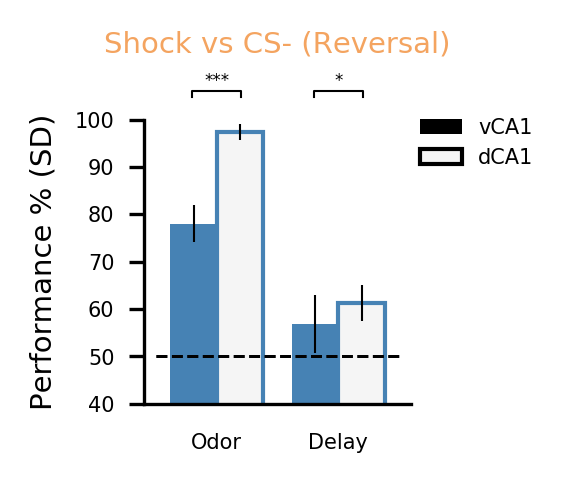

In [917]:
from matplotlib.patches import Patch
labels = session_labels[:-1]
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 15
v={}
d={}
pvs=[]

fig, ax = pl.subplots(1,1,figsize=(1.7,1.9),sharey=True)
for tb,i in zip([4,6],range(2)):
    v[sess] = np.array(np.std(eval("mean_scores_gmin_tb_%s_shVScsm_vhpc['post_rev'][:loops]"%(tb)))*100)
    ax.bar(i - width/2, np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_vhpc['post_rev'][:loops]"%(tb)))*100, width, color=dark_co[-1],yerr=v[sess])
    d[sess] = np.array(np.std(eval("mean_scores_gmin_tb_%s_shVScsm_dhpc['post_rev'][:loops]"%(tb)))*100)
    ax.bar(i + width/2,  np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_dhpc['post_rev'][:loops]"%(tb)))*100, width,color='whitesmoke', edgecolor=dark_co[-1],yerr=d[sess])
    ax.hlines(50,-.5,1.5, color='k', lw=.7, linestyles='dashed')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Performance % (SD)')
    #ax.set_title('Decoding During CS')
    ax.set_xticks(x)
    ax.set_xticklabels(['Odor','Delay'])
    ax.legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
    ax.tick_params(axis='x',bottom=False)
    ax.set_ylim(40,100)
    ax.set_title('Shock vs CS- (Reversal)',y=1.15,color='sandybrown')

    pvs.append(add_significance(ax,eval("mean_scores_gmin_tb_%s_shVScsm_vhpc['post_rev'][:loops]"%tb),
                eval("mean_scores_gmin_tb_%s_shVScsm_dhpc['post_rev'][:loops]"%tb),
                -.2+i,0.2+i,106))
    #pvs.append(sig_vs_chance(ax,eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab),.5,-.2+i,
    #           np.mean(eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab))*100+v[sess],loops=loops,sig_func=None,colors='k'))
    #pvs.append(sig_vs_chance(ax,eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab),.5, .2+i,
    #           np.mean(eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab))*100+d[sess],loops=loops,sig_func=None,colors='k'))
#pl.suptitle('Decoding During Delay',fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../figures/%s_gmin_bars_shOnly_RevOnly.pdf'%NOTEBOOK_NAME)

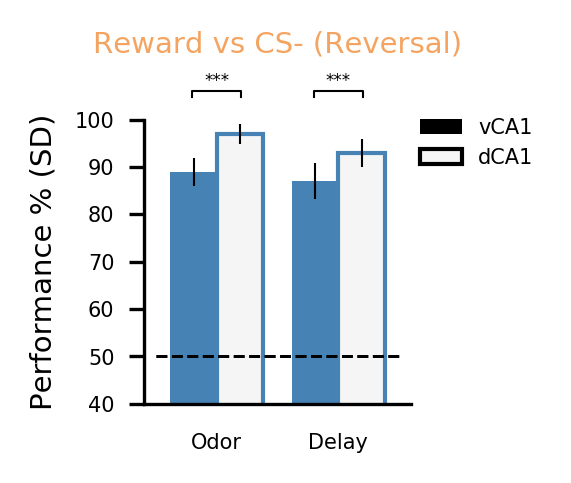

In [918]:
from matplotlib.patches import Patch
labels = session_labels[:-1]
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 15
v={}
d={}
pvs=[]

fig, ax = pl.subplots(1,1,figsize=(1.7,1.9),sharey=True)
for tb,i in zip([4,6],range(2)):
    v[sess] = np.array(np.std(eval("mean_scores_gmin_tb_%s_rwVScsm_vhpc['post_rev'][:loops]"%(tb)))*100)
    ax.bar(i - width/2, np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_vhpc['post_rev'][:loops]"%(tb)))*100, width, color=dark_co[-1],yerr=v[sess])
    d[sess] = np.array(np.std(eval("mean_scores_gmin_tb_%s_rwVScsm_dhpc['post_rev'][:loops]"%(tb)))*100)
    ax.bar(i + width/2,  np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_dhpc['post_rev'][:loops]"%(tb)))*100, width,color='whitesmoke', edgecolor=dark_co[-1],yerr=d[sess])
    ax.hlines(50,-.5,1.5, color='k', lw=.7, linestyles='dashed')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Performance % (SD)')
    #ax.set_title('Decoding During CS')
    ax.set_xticks(x)
    ax.set_xticklabels(['Odor','Delay'])
    ax.legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
    ax.tick_params(axis='x',bottom=False)
    ax.set_ylim(40,100)
    ax.set_title('Reward vs CS- (Reversal)',y=1.15,color='sandybrown')

    pvs.append(add_significance(ax,eval("mean_scores_gmin_tb_%s_rwVScsm_vhpc['post_rev'][:loops]"%tb),
                eval("mean_scores_gmin_tb_%s_rwVScsm_dhpc['post_rev'][:loops]"%tb),
                -.2+i,0.2+i,106))
    #pvs.append(sig_vs_chance(ax,eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab),.5,-.2+i,
    #           np.mean(eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab))*100+v[sess],loops=loops,sig_func=None,colors='k'))
    #pvs.append(sig_vs_chance(ax,eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab),.5, .2+i,
    #           np.mean(eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab))*100+d[sess],loops=loops,sig_func=None,colors='k'))
#pl.suptitle('Decoding During Delay',fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../figures/%s_gmin_bars_rwOnly_RevOnly.pdf'%NOTEBOOK_NAME)

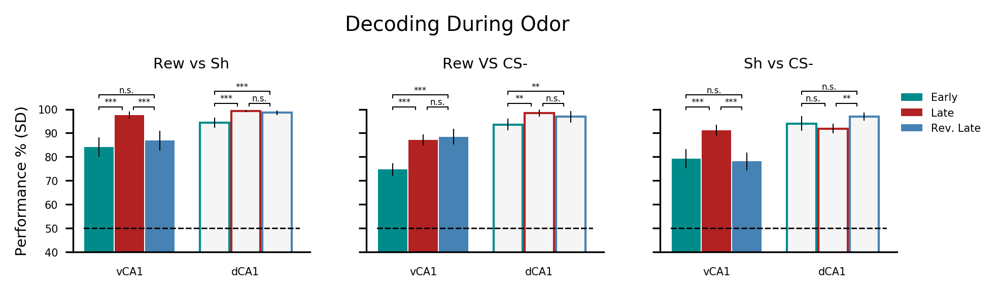

In [783]:
from matplotlib.patches import Patch
labels = session_labels
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 10
v={}
d={}

fig, ax = pl.subplots(1,3,figsize=(6.5,2.3),sharey=True)
for lab, l in zip(non_catch_labels,range(3)):
    for sess,c,i in zip(sessions_to_plot,dark_co,range(len(sessions_to_plot))):
        v[sess] = np.array(np.std(eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab))*100)
        ax[l].bar(-.3 + width*i*1.04, np.mean(eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab))*100, width, color=c,yerr=v[sess])
        d[sess] = np.array(np.std(eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab))*100)
        ax[l].bar(1.2 + width*i*1.07,  np.mean(eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab))*100, width,color='whitesmoke',
                  edgecolor=c,yerr=d[sess])
        ax[l].hlines(50,-.5,2.3, color='k', lw=.7, linestyles='dashed')
        # Add some text for labels, title and custom x-axis tick labels, etc.
        ax[0].set_ylabel('Performance % (SD)')
        #ax.set_title('Decoding During CS')
        ax[l].set_xticks([0.1,1.6])
        ax[l].set_xticklabels(['vCA1','dCA1'])
        #ax[l].legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
        ax[l].tick_params(axis='x',bottom=False)
        ax[l].set_ylim(40,100)
        ax[l].set_title(comp_labels[l],y=1.2)
ax[2].legend([Patch(facecolor=dark_co[0]),Patch(facecolor=dark_co[1]),Patch(facecolor=dark_co[2])],
             ['Early','Late','Rev. Late'],loc=(1,.8),frameon=False)
pvs=[]
#for lab, l in zip(non_catch_labels,range(3)):
#    for sess,i in zip(sessions_to_plot, range(len(sessions_to_plot))):
#        pvs.append(add_significance(ax[l], eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab), eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab),
#            -.2+i,0.2+i,115))
#        pvs.append(sig_vs_chance(ax[l],eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab),.5,-.2+i,
#                   np.mean(eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab))*100+v[sess]+1,loops=loops,sig_func=None,colors='k'))
#        pvs.append(sig_vs_chance(ax[l],eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab),.5, .2+i,
#                   np.mean(eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab))*100+d[sess]+1,loops=loops,sig_func=None,colors='k'))
for lab, l in zip(non_catch_labels,range(3)):
        for reg, r in zip(['vhpc','dhpc'],range(2)):
            pvs.append(add_significance(ax[l], eval("mean_scores_gmin_tb_4_%s_%s['pre'][:loops]"%(lab,reg)),
                   eval("mean_scores_gmin_tb_4_%s_%s['post'][:loops]"%(lab,reg)),
                   -.3+(r*1.5),(r*1.5),101+(r*1.5),mcc=2))
            pvs.append(add_significance(ax[l], eval("mean_scores_gmin_tb_4_%s_%s['post'][:loops]"%(lab,reg)),
                   eval("mean_scores_gmin_tb_4_%s_%s['post_rev'][:loops]"%(lab,reg)),
                   .15+(r*1.5),.42+(r*1.5),101+(r*1.5),mcc=2))
            pvs.append(add_significance(ax[l], eval("mean_scores_gmin_tb_4_%s_%s['pre'][:loops]"%(lab,reg)),
                   eval("mean_scores_gmin_tb_4_%s_%s['post_rev'][:loops]"%(lab,reg)),
                   -.3+(r*1.5),.42+(r*1.5),106+(r*1.5),mcc=2))
pl.suptitle('Decoding During Odor',y=.9,fontsize=9.5)
fig.tight_layout(pad=5)

fig.savefig('../figures/%s_gmin_bars_CS.pdf'%NOTEBOOK_NAME)

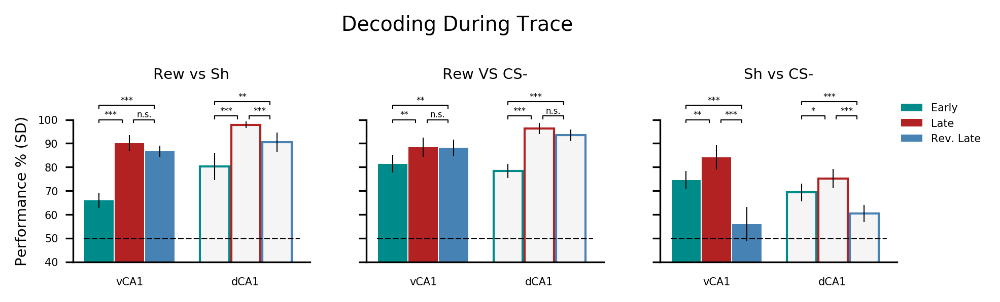

In [708]:
from matplotlib.patches import Patch
labels = session_labels
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 10
v={}
d={}

fig, ax = pl.subplots(1,3,figsize=(6.5,2.3),sharey=True)
for lab, l in zip(non_catch_labels,range(3)):
    for sess,c,i in zip(sessions_to_plot,dark_co,range(len(sessions_to_plot))):
        v[sess] = np.array(np.std(eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab))*100)
        ax[l].bar(-.3 + width*i*1.04, np.mean(eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab))*100, width, color=c,yerr=v[sess])
        d[sess] = np.array(np.std(eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab))*100)
        ax[l].bar(1.2 + width*i*1.07,  np.mean(eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab))*100, width,color='whitesmoke',
                  edgecolor=c,yerr=d[sess])
        ax[l].hlines(50,-.5,2.3, color='k', lw=.7, linestyles='dashed')
        # Add some text for labels, title and custom x-axis tick labels, etc.
        ax[0].set_ylabel('Performance % (SD)')
        #ax.set_title('Decoding During CS')
        ax[l].set_xticks([0.1,1.6])
        ax[l].set_xticklabels(['vCA1','dCA1'])
        #ax[l].legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
        ax[l].tick_params(axis='x',bottom=False)
        ax[l].set_ylim(40,100)
        ax[l].set_title(comp_labels[l],y=1.2)
ax[2].legend([Patch(facecolor=dark_co[0]),Patch(facecolor=dark_co[1]),Patch(facecolor=dark_co[2])],['Early','Late','Rev. Late'],loc=(1,.8),frameon=False)

pvs=[]
#for lab, l in zip(non_catch_labels,range(3)):
#    for sess,i in zip(sessions_to_plot, range(len(sessions_to_plot))):
#        pvs.append(add_significance(ax[l], eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab), eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab),
#            -.2+i,0.2+i,115))
#        pvs.append(sig_vs_chance(ax[l],eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab),.5,-.2+i,
#                   np.mean(eval("mean_scores_gmin_tb_6_%s_vhpc[sess][:loops]"%lab))*100+v[sess]+1,loops=loops,sig_func=None,colors='k'))
#        pvs.append(sig_vs_chance(ax[l],eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab),.5, .2+i,
#                   np.mean(eval("mean_scores_gmin_tb_6_%s_dhpc[sess][:loops]"%lab))*100+d[sess]+1,loops=loops,sig_func=None,colors='k'))
for lab, l in zip(non_catch_labels,range(3)):
        for reg, r in zip(['vhpc','dhpc'],range(2)):
            pvs.append(add_significance(ax[l], eval("mean_scores_gmin_tb_6_%s_%s['pre'][:loops]"%(lab,reg)),
                   eval("mean_scores_gmin_tb_6_%s_%s['post'][:loops]"%(lab,reg)),
                   -.3+(r*1.5),(r*1.5),100+(r*1.5),mcc=2))
            pvs.append(add_significance(ax[l], eval("mean_scores_gmin_tb_6_%s_%s['post'][:loops]"%(lab,reg)),
                   eval("mean_scores_gmin_tb_6_%s_%s['post_rev'][:loops]"%(lab,reg)),
                   .15+(r*1.5),.42+(r*1.5),100+(r*1.5),mcc=2))
            pvs.append(add_significance(ax[l], eval("mean_scores_gmin_tb_6_%s_%s['pre'][:loops]"%(lab,reg)),
                   eval("mean_scores_gmin_tb_6_%s_%s['post_rev'][:loops]"%(lab,reg)),
                   -.3+(r*1.5),.42+(r*1.5),106+(r*1.5),mcc=2))
pl.suptitle('Decoding During Trace',y=.93,fontsize=9.5)
fig.tight_layout(pad=5)

fig.savefig('../figures/%s_gmin_bars_Tr.pdf'%NOTEBOOK_NAME)

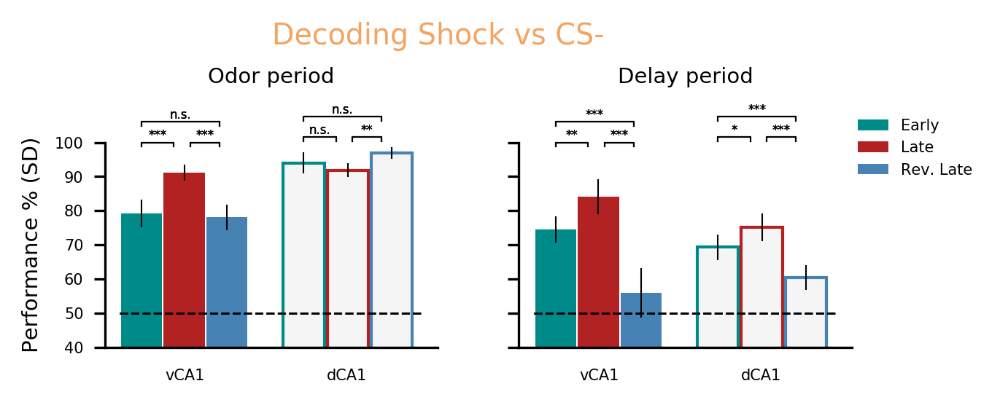

In [784]:
from matplotlib.patches import Patch
labels = session_labels
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 10
v={}
d={}
pvs=[]

fig, ax = pl.subplots(1,2,figsize=(4.5,2.3),sharey=True)
for tb,l,per in zip([4,6],range(2),['Odor period','Delay period']):
    for sess,c,i in zip(sessions_to_plot,dark_co,range(len(sessions_to_plot))):
        v[sess] = np.array(np.std(eval("mean_scores_gmin_tb_%s_shVScsm_vhpc[sess][:loops]"%tb))*100)
        ax[l].bar(-.3 + width*i*1.04, np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_vhpc[sess][:loops]"%tb))*100, width, color=c,yerr=v[sess])
        d[sess] = np.array(np.std(eval("mean_scores_gmin_tb_%s_shVScsm_dhpc[sess][:loops]"%tb))*100)
        ax[l].bar(1.2 + width*i*1.07,  np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_dhpc[sess][:loops]"%tb))*100, width,color='whitesmoke',
                  edgecolor=c,yerr=d[sess])
        ax[l].hlines(50,-.5,2.3, color='k', lw=.7, linestyles='dashed')
        # Add some text for labels, title and custom x-axis tick labels, etc.
        ax[0].set_ylabel('Performance % (SD)')
        #ax.set_title('Decoding During CS')
        ax[l].set_xticks([0.1,1.6])
        ax[l].set_xticklabels(['vCA1','dCA1'])
        #ax[l].legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
        ax[l].tick_params(axis='x',bottom=False)
        ax[l].set_ylim(40,100)
        ax[l].set_title(per,y=1.2)

        for reg, r in zip(['vhpc','dhpc'],range(2)):
            pvs.append(add_significance(ax[l], eval("mean_scores_gmin_tb_%s_shVScsm_%s['pre'][:loops]"%(tb,reg)),
                   eval("mean_scores_gmin_tb_%s_shVScsm_%s['post'][:loops]"%(tb,reg)),
                   -.3+(r*1.5),(r*1.5),100+(r*1.5),mcc=2))
            pvs.append(add_significance(ax[l], eval("mean_scores_gmin_tb_%s_shVScsm_%s['post'][:loops]"%(tb,reg)),
                   eval("mean_scores_gmin_tb_%s_shVScsm_%s['post_rev'][:loops]"%(tb,reg)),
                   .15+(r*1.5),.42+(r*1.5),100+(r*1.5),mcc=2))
            pvs.append(add_significance(ax[l], eval("mean_scores_gmin_tb_%s_shVScsm_%s['pre'][:loops]"%(tb,reg)),
                   eval("mean_scores_gmin_tb_%s_shVScsm_%s['post_rev'][:loops]"%(tb,reg)),
                   -.3+(r*1.5),.42+(r*1.5),106+(r*1.5),mcc=2))

ax[1].legend([Patch(facecolor=dark_co[0]),Patch(facecolor=dark_co[1]),Patch(facecolor=dark_co[2])],['Early','Late','Rev. Late'],loc=(1,.8),frameon=False)
pl.suptitle('Decoding Shock vs CS-',y=.87,fontsize=9.5,color='sandybrown')
fig.tight_layout(pad=5)

fig.savefig('../figures/%s_gmin_bars_shVSCSm.pdf'%NOTEBOOK_NAME)

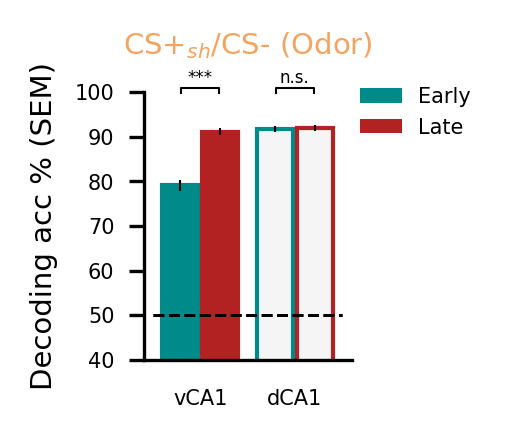

In [857]:
from matplotlib.patches import Patch
labels = session_labels[:-1]
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 10
v={}
d={}
pvs=[]

fig, ax = pl.subplots(1,1,figsize=(1.5,1.7),sharey=True)
for reg,i in zip(['vhpc','dhpc'],range(2)):
    if reg == 'vhpc':
        c=dark_co
    else:
        c=['whitesmoke','whitesmoke']
    v[sess] = np.array(np.std(eval("mean_scores_gmin_tb_4_shVScsm_%s['pre']"%(reg))[:loops])/np.sqrt(loops)*100)
    ax.bar(i-width/2-.02, np.mean(eval("mean_scores_gmin_tb_4_shVScsm_%s['pre']"%(reg))[:loops])*100, width, color=c[0],yerr=v[sess],
          edgecolor=dark_co[0])
    d[sess] = np.array(np.std(eval("mean_scores_gmin_tb_4_shVScsm_%s['post']"%(reg))[:loops])/np.sqrt(loops)*100)
    ax.bar(i+width/2+.02, np.mean(eval("mean_scores_gmin_tb_4_shVScsm_%s['post']"%(reg))[:loops])*100, width,color=c[1],
              edgecolor=dark_co[1],yerr=d[sess])
    ax.hlines(50,-.5,1.5, color='k', lw=.7, linestyles='dashed')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Decoding acc % (SEM)')
    #ax.set_title('Decoding During CS')
    ax.set_xticks(x)
    ax.set_xticklabels(['vCA1','dCA1'])
    #ax.legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
    ax.tick_params(axis='x',bottom=False)
    ax.set_ylim(40,100)
    ax.set_title('CS+$_{sh}$/CS- (Odor)',y=1.05,color='sandybrown')
    ax.legend([Patch(facecolor=dark_co[0]),Patch(facecolor=dark_co[1]),],['Early','Late'],loc=(1,.8),frameon=False)


    pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_4_shVScsm_%s"%reg)['pre'][:loops],
                   eval("mean_scores_gmin_tb_4_shVScsm_%s"%reg)['post'][:loops],
                   -.2+i,0.2+i,101,mcc=1))
            #pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_4_shVScsm_%s['post'][:loops]"%(reg)),
            #       eval("mean_scores_gmin_tb_4_shVScsm_%s['post_rev'][:loops]"%(reg)),
            #       .15+(r*1.5),.42+(r*1.5),101+(r*1.5),mcc=2))
            #pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_4_shVScsm_%s['pre'][:loops]"%(reg)),
            #       eval("mean_scores_gmin_tb_4_shVScsm_%s['post_rev'][:loops]"%(reg)),
            #       -.3+(r*1.5),.42+(r*1.5),106+(r*1.5),mcc=2))
#pl.suptitle('Decoding During Odor',y=1,fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../figures/%s_gmin_bars_CSshCSm_odor.pdf'%NOTEBOOK_NAME)

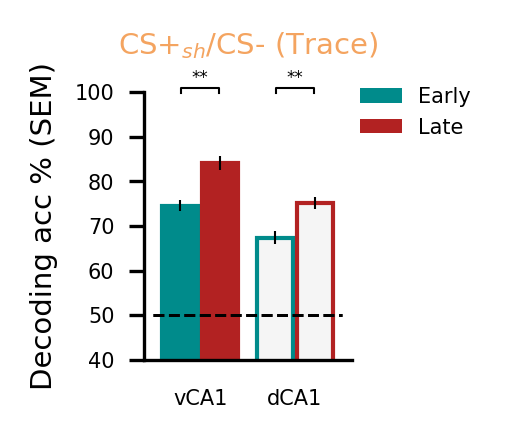

In [856]:
from matplotlib.patches import Patch
labels = session_labels[:-1]
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 10
v={}
d={}
pvs=[]

fig, ax = pl.subplots(1,1,figsize=(1.5,1.7),sharey=True)
for reg,i in zip(['vhpc','dhpc'],range(2)):
    if reg == 'vhpc':
        c=dark_co
    else:
        c=['whitesmoke','whitesmoke']
    v[sess] = np.array(np.std(eval("mean_scores_gmin_tb_6_shVScsm_%s['pre']"%(reg))[:loops])/np.sqrt(loops)*100)
    ax.bar(i-width/2-.02, np.mean(eval("mean_scores_gmin_tb_6_shVScsm_%s['pre']"%(reg))[:loops])*100, width, color=c[0],yerr=v[sess],
          edgecolor=dark_co[0])
    d[sess] = np.array(np.std(eval("mean_scores_gmin_tb_6_shVScsm_%s['post']"%(reg))[:loops])/np.sqrt(loops)*100)
    ax.bar(i+width/2+.02, np.mean(eval("mean_scores_gmin_tb_6_shVScsm_%s['post']"%(reg))[:loops])*100, width,color=c[1],
              edgecolor=dark_co[1],yerr=d[sess])
    ax.hlines(50,-.5,1.5, color='k', lw=.7, linestyles='dashed')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Decoding acc % (SEM)')
    #ax.set_title('Decoding During CS')
    ax.set_xticks(x)
    ax.set_xticklabels(['vCA1','dCA1'])
    #ax.legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
    ax.tick_params(axis='x',bottom=False)
    ax.set_ylim(40,100)
    ax.set_title('CS+$_{sh}$/CS- (Trace)',y=1.05,color='sandybrown')
    ax.legend([Patch(facecolor=dark_co[0]),Patch(facecolor=dark_co[1]),],['Early','Late'],loc=(1,.8),frameon=False)


    pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_6_shVScsm_%s"%reg)['pre'][:loops],
                   eval("mean_scores_gmin_tb_6_shVScsm_%s"%reg)['post'][:loops],
                   -.2+i,0.2+i,101,mcc=1))
            #pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_6_shVScsm_%s['post'][:loops]"%(reg)),
            #       eval("mean_scores_gmin_tb_6_shVScsm_%s['post_rev'][:loops]"%(reg)),
            #       .15+(r*1.5),.42+(r*1.5),101+(r*1.5),mcc=2))
            #pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_6_shVScsm_%s['pre'][:loops]"%(reg)),
            #       eval("mean_scores_gmin_tb_6_shVScsm_%s['post_rev'][:loops]"%(reg)),
            #       -.3+(r*1.5),.42+(r*1.5),106+(r*1.5),mcc=2))
#pl.suptitle('Decoding During Odor',y=1,fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../figures/%s_gmin_bars_CSshCSm_tr.pdf'%NOTEBOOK_NAME)

In [793]:
print scores_gmin_tb_6_shVScsm_dhpc['pre'][:10].mean()
print np.std(scores_gmin_tb_6_shVScsm_dhpc['pre'][:10])

0.69325
0.0492512690192


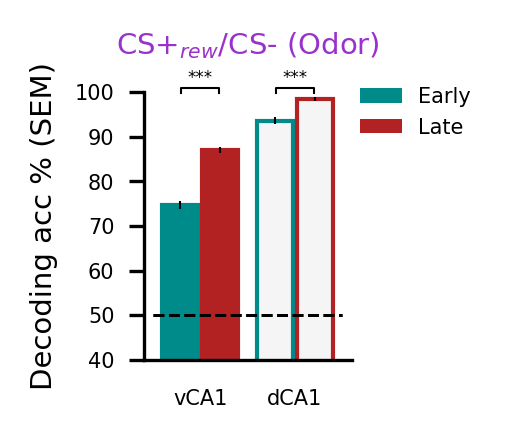

In [855]:
from matplotlib.patches import Patch
labels = session_labels[:-1]
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 10
v={}
d={}
pvs=[]

fig, ax = pl.subplots(1,1,figsize=(1.5,1.7),sharey=True)
for reg,i in zip(['vhpc','dhpc'],range(2)):
    if reg == 'vhpc':
        c=dark_co
    else:
        c=['whitesmoke','whitesmoke']
    v[sess] = np.array(np.std(eval("mean_scores_gmin_tb_4_rwVScsm_%s['pre']"%(reg))[:loops])/np.sqrt(loops)*100)
    ax.bar(i-width/2-.02, np.mean(eval("mean_scores_gmin_tb_4_rwVScsm_%s['pre']"%(reg))[:loops])*100, width, color=c[0],yerr=v[sess],
          edgecolor=dark_co[0])
    d[sess] = np.array(np.std(eval("mean_scores_gmin_tb_4_rwVScsm_%s['post']"%(reg))[:loops])/np.sqrt(loops)*100)
    ax.bar(i+width/2+.02, np.mean(eval("mean_scores_gmin_tb_4_rwVScsm_%s['post']"%(reg))[:loops])*100, width,color=c[1],
              edgecolor=dark_co[1],yerr=d[sess])
    ax.hlines(50,-.5,1.5, color='k', lw=.7, linestyles='dashed')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Decoding acc % (SEM)')
    #ax.set_title('Decoding During CS')
    ax.set_xticks(x)
    ax.set_xticklabels(['vCA1','dCA1'])
    #ax.legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
    ax.tick_params(axis='x',bottom=False)
    ax.set_ylim(40,100)
    ax.set_title('CS+$_{rew}$/CS- (Odor)',y=1.05,color='darkorchid')
    ax.legend([Patch(facecolor=dark_co[0]),Patch(facecolor=dark_co[1]),],['Early','Late'],loc=(1,.8),frameon=False)


    pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_4_rwVScsm_%s"%reg)['pre'][:loops],
                   eval("mean_scores_gmin_tb_4_rwVScsm_%s"%reg)['post'][:loops],
                   -.2+i,0.2+i,101,mcc=1))
            #pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_4_shVScsm_%s['post'][:loops]"%(reg)),
            #       eval("mean_scores_gmin_tb_4_shVScsm_%s['post_rev'][:loops]"%(reg)),
            #       .15+(r*1.5),.42+(r*1.5),101+(r*1.5),mcc=2))
            #pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_4_shVScsm_%s['pre'][:loops]"%(reg)),
            #       eval("mean_scores_gmin_tb_4_shVScsm_%s['post_rev'][:loops]"%(reg)),
            #       -.3+(r*1.5),.42+(r*1.5),106+(r*1.5),mcc=2))
#pl.suptitle('Decoding During Odor',y=1,fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../figures/%s_gmin_bars_CSrewCSm_odor.pdf'%NOTEBOOK_NAME)

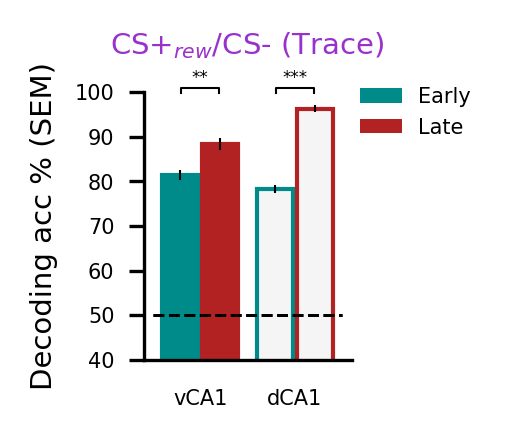

In [854]:
from matplotlib.patches import Patch
labels = session_labels[:-1]
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 10
v={}
d={}
pvs=[]

fig, ax = pl.subplots(1,1,figsize=(1.5,1.7),sharey=True)
for reg,i in zip(['vhpc','dhpc'],range(2)):
    if reg == 'vhpc':
        c=dark_co
    else:
        c=['whitesmoke','whitesmoke']
    v[sess] = np.array(np.std(eval("mean_scores_gmin_tb_6_rwVScsm_%s['pre']"%(reg))[:loops])/np.sqrt(loops)*100)
    ax.bar(i-width/2-.02, np.mean(eval("mean_scores_gmin_tb_6_rwVScsm_%s['pre']"%(reg))[:loops])*100, width, color=c[0],yerr=v[sess],
          edgecolor=dark_co[0])
    d[sess] = np.array(np.std(eval("mean_scores_gmin_tb_6_rwVScsm_%s['post']"%(reg))[:loops])/np.sqrt(loops)*100)
    ax.bar(i+width/2+.02, np.mean(eval("mean_scores_gmin_tb_6_rwVScsm_%s['post']"%(reg))[:loops])*100, width,color=c[1],
              edgecolor=dark_co[1],yerr=d[sess])
    ax.hlines(50,-.5,1.5, color='k', lw=.7, linestyles='dashed')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Decoding acc % (SEM)',fontsize=7)
    ax.set_xticks(x)
    ax.set_xticklabels(['vCA1','dCA1'])
    #ax.legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
    ax.tick_params(axis='x',bottom=False)
    ax.set_ylim(40,100)
    ax.set_title('CS+$_{rew}$/CS- (Trace)',y=1.05,color='darkorchid')
    ax.legend([Patch(facecolor=dark_co[0]),Patch(facecolor=dark_co[1]),],['Early','Late'],loc=(1,.8),frameon=False)


    pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_6_rwVScsm_%s"%reg)['pre'][:loops],
                   eval("mean_scores_gmin_tb_6_rwVScsm_%s"%reg)['post'][:loops],
                   -.2+i,0.2+i,101,mcc=1))
            #pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_6_shVScsm_%s['post'][:loops]"%(reg)),
            #       eval("mean_scores_gmin_tb_6_shVScsm_%s['post_rev'][:loops]"%(reg)),
            #       .15+(r*1.5),.42+(r*1.5),101+(r*1.5),mcc=2))
            #pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_6_shVScsm_%s['pre'][:loops]"%(reg)),
            #       eval("mean_scores_gmin_tb_6_shVScsm_%s['post_rev'][:loops]"%(reg)),
            #       -.3+(r*1.5),.42+(r*1.5),106+(r*1.5),mcc=2))
#pl.suptitle('Decoding During Odor',y=1,fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../figures/%s_gmin_bars_CSrewCSm_tr.pdf'%NOTEBOOK_NAME)

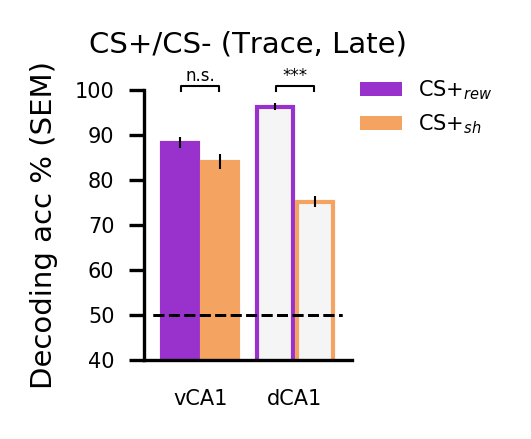

In [922]:
from matplotlib.patches import Patch
labels = session_labels[:-1]
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 10
v={}
d={}
pvs=[]

fig, ax = pl.subplots(1,1,figsize=(1.5,1.7),sharey=True)
for reg,i,cc in zip(['vhpc','dhpc'],range(2),['darkorchid','sandybrown']):
    if reg == 'vhpc':
        c=['darkorchid','sandybrown']
    else:
        c=['whitesmoke','whitesmoke']
    v[sess] = np.array(np.std(eval("mean_scores_gmin_tb_6_rwVScsm_%s['post']"%(reg))[:loops])/np.sqrt(loops)*100)
    ax.bar(i-width/2-.02, np.mean(eval("mean_scores_gmin_tb_6_rwVScsm_%s['post']"%(reg))[:loops])*100, width, color=c[0],
           yerr=v[sess],edgecolor='darkorchid')
    d[sess] = np.array(np.std(eval("mean_scores_gmin_tb_6_shVScsm_%s['post']"%(reg))[:loops])/np.sqrt(loops)*100)
    ax.bar(i+width/2+.02, np.mean(eval("mean_scores_gmin_tb_6_shVScsm_%s['post']"%(reg))[:loops])*100, width,color=c[1],
              edgecolor='sandybrown',yerr=d[sess])
    ax.hlines(50,-.5,1.5, color='k', lw=.7, linestyles='dashed')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Decoding acc % (SEM)',fontsize=7)
    ax.set_xticks(x)
    ax.set_xticklabels(['vCA1','dCA1'])
    #ax.legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
    ax.tick_params(axis='x',bottom=False)
    ax.set_ylim(40,100)
    ax.set_title('CS+/CS- (Trace, Late)',y=1.05,color='k')
    ax.legend([Patch(facecolor='darkorchid'),Patch(facecolor='sandybrown'),],['CS+$_{rew}$','CS+$_{sh}$'],loc=(1,.8),frameon=False)


    pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_6_rwVScsm_%s"%reg)['post'][:loops],
                   eval("mean_scores_gmin_tb_6_shVScsm_%s"%reg)['post'][:loops],
                   -.2+i,0.2+i,101,mcc=1))
            #pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_6_shVScsm_%s['post'][:loops]"%(reg)),
            #       eval("mean_scores_gmin_tb_6_shVScsm_%s['post_rev'][:loops]"%(reg)),
            #       .15+(r*1.5),.42+(r*1.5),101+(r*1.5),mcc=2))
            #pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_6_shVScsm_%s['pre'][:loops]"%(reg)),
            #       eval("mean_scores_gmin_tb_6_shVScsm_%s['post_rev'][:loops]"%(reg)),
            #       -.3+(r*1.5),.42+(r*1.5),106+(r*1.5),mcc=2))
#pl.suptitle('Decoding During Odor',y=1,fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../figures/%s_gmin_bars_CSrewCSsh_tr.pdf'%NOTEBOOK_NAME)

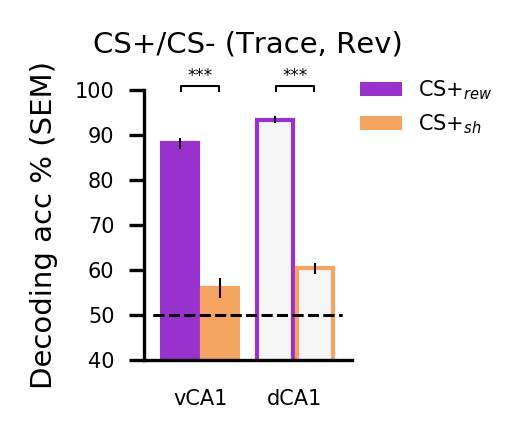

In [920]:
from matplotlib.patches import Patch
labels = session_labels[:-1]
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 10
v={}
d={}
pvs=[]

fig, ax = pl.subplots(1,1,figsize=(1.5,1.7),sharey=True)
for reg,i,cc in zip(['vhpc','dhpc'],range(2),['darkorchid','sandybrown']):
    if reg == 'vhpc':
        c=['darkorchid','sandybrown']
    else:
        c=['whitesmoke','whitesmoke']
    v[sess] = np.array(np.std(eval("mean_scores_gmin_tb_6_rwVScsm_%s['post_rev']"%(reg))[:loops])/np.sqrt(loops)*100)
    ax.bar(i-width/2-.02, np.mean(eval("mean_scores_gmin_tb_6_rwVScsm_%s['post_rev']"%(reg))[:loops])*100, width, color=c[0],
           yerr=v[sess],edgecolor='darkorchid')
    d[sess] = np.array(np.std(eval("mean_scores_gmin_tb_6_shVScsm_%s['post_rev']"%(reg))[:loops])/np.sqrt(loops)*100)
    ax.bar(i+width/2+.02, np.mean(eval("mean_scores_gmin_tb_6_shVScsm_%s['post_rev']"%(reg))[:loops])*100, width,color=c[1],
              edgecolor='sandybrown',yerr=d[sess])
    ax.hlines(50,-.5,1.5, color='k', lw=.7, linestyles='dashed')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Decoding acc % (SEM)',fontsize=7)
    ax.set_xticks(x)
    ax.set_xticklabels(['vCA1','dCA1'])
    #ax.legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
    ax.tick_params(axis='x',bottom=False)
    ax.set_ylim(40,100)
    ax.set_title('CS+/CS- (Trace, Rev)',y=1.05,color='k')
    ax.legend([Patch(facecolor='darkorchid'),Patch(facecolor='sandybrown'),],['CS+$_{rew}$','CS+$_{sh}$'],loc=(1,.8),frameon=False)


    pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_6_rwVScsm_%s"%reg)['post_rev'][:loops],
                   eval("mean_scores_gmin_tb_6_shVScsm_%s"%reg)['post_rev'][:loops],
                   -.2+i,0.2+i,101,mcc=1))
            #pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_6_shVScsm_%s['post'][:loops]"%(reg)),
            #       eval("mean_scores_gmin_tb_6_shVScsm_%s['post_rev'][:loops]"%(reg)),
            #       .15+(r*1.5),.42+(r*1.5),101+(r*1.5),mcc=2))
            #pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_6_shVScsm_%s['pre'][:loops]"%(reg)),
            #       eval("mean_scores_gmin_tb_6_shVScsm_%s['post_rev'][:loops]"%(reg)),
            #       -.3+(r*1.5),.42+(r*1.5),106+(r*1.5),mcc=2))
#pl.suptitle('Decoding During Odor',y=1,fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../figures/%s_gmin_bars_CSrewCSsh_tr_Rev.pdf'%NOTEBOOK_NAME)

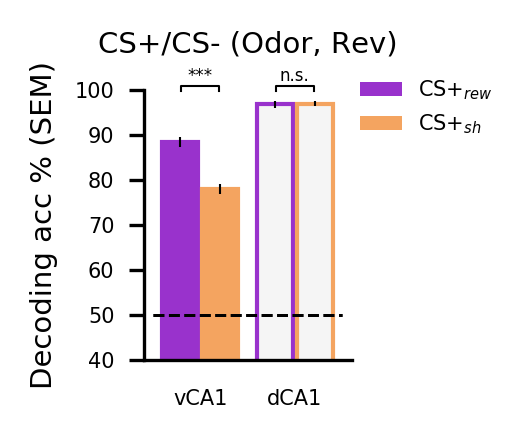

In [921]:
from matplotlib.patches import Patch
labels = session_labels[:-1]
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 10
v={}
d={}
pvs=[]

fig, ax = pl.subplots(1,1,figsize=(1.5,1.7),sharey=True)
for reg,i,cc in zip(['vhpc','dhpc'],range(2),['darkorchid','sandybrown']):
    if reg == 'vhpc':
        c=['darkorchid','sandybrown']
    else:
        c=['whitesmoke','whitesmoke']
    v[sess] = np.array(np.std(eval("mean_scores_gmin_tb_4_rwVScsm_%s['post_rev']"%(reg))[:loops])/np.sqrt(loops)*100)
    ax.bar(i-width/2-.02, np.mean(eval("mean_scores_gmin_tb_4_rwVScsm_%s['post_rev']"%(reg))[:loops])*100, width, color=c[0],
           yerr=v[sess],edgecolor='darkorchid')
    d[sess] = np.array(np.std(eval("mean_scores_gmin_tb_4_shVScsm_%s['post_rev']"%(reg))[:loops])/np.sqrt(loops)*100)
    ax.bar(i+width/2+.02, np.mean(eval("mean_scores_gmin_tb_4_shVScsm_%s['post_rev']"%(reg))[:loops])*100, width,color=c[1],
              edgecolor='sandybrown',yerr=d[sess])
    ax.hlines(50,-.5,1.5, color='k', lw=.7, linestyles='dashed')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Decoding acc % (SEM)',fontsize=7)
    ax.set_xticks(x)
    ax.set_xticklabels(['vCA1','dCA1'])
    #ax.legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
    ax.tick_params(axis='x',bottom=False)
    ax.set_ylim(40,100)
    ax.set_title('CS+/CS- (Odor, Rev)',y=1.05,color='k')
    ax.legend([Patch(facecolor='darkorchid'),Patch(facecolor='sandybrown'),],['CS+$_{rew}$','CS+$_{sh}$'],loc=(1,.8),frameon=False)


    pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_4_rwVScsm_%s"%reg)['post_rev'][:loops],
                   eval("mean_scores_gmin_tb_4_shVScsm_%s"%reg)['post_rev'][:loops],
                   -.2+i,0.2+i,101,mcc=1))
            #pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_6_shVScsm_%s['post'][:loops]"%(reg)),
            #       eval("mean_scores_gmin_tb_6_shVScsm_%s['post_rev'][:loops]"%(reg)),
            #       .15+(r*1.5),.42+(r*1.5),101+(r*1.5),mcc=2))
            #pvs.append(add_significance(ax, eval("mean_scores_gmin_tb_6_shVScsm_%s['pre'][:loops]"%(reg)),
            #       eval("mean_scores_gmin_tb_6_shVScsm_%s['post_rev'][:loops]"%(reg)),
            #       -.3+(r*1.5),.42+(r*1.5),106+(r*1.5),mcc=2))
#pl.suptitle('Decoding During Odor',y=1,fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../figures/%s_gmin_bars_CSrewCSsh_CS_Rev.pdf'%NOTEBOOK_NAME)

4 v U = 0.0 p = 0.000180634720808 r = -0.845154254729
None
4 d U = 4.5 p = 0.000660373923292 r = -0.769090371803
None
6 v U = 11.0 p = 0.00356016036847 r = -0.659220318688
None
6 d U = 0.0 p = 0.000179622504991 r = -0.845154254729
None


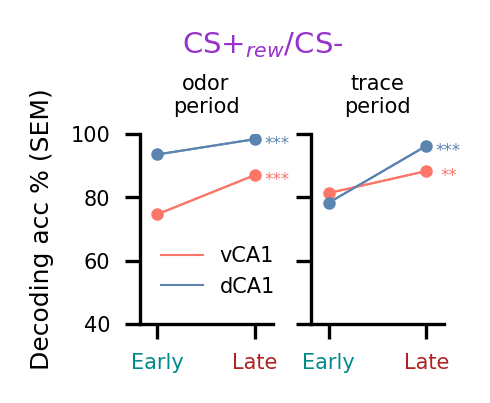

In [1110]:
fig,ax = pl.subplots(1,2,figsize=(1.6,1.2),sharex=True,sharey=True)
v={}
d={}
loops=10
expectations = 'pre','post'

# Add connecting lines            
for ex,c,z in zip(expectations,(('powderblue','midnightblue')),(.2,1.3)):
    for tb,tb_la,x in zip((4,6),('odor','trace'),(range(2))):
            ax[x].plot([p for p in (.2,1.3)],
                       [np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_vhpc[ex][:loops]"%(tb)))*100 for ex in expectations],color='#FC766AFF',label='vCA1')
            ax[x].plot([p for p in (.2,1.3)],
                       [np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_dhpc[ex][:loops]"%(tb)))*100 for ex in expectations],color='#5B84B1FF',label='dCA1')
            
for ex,c,z in zip(expectations,(('powderblue','midnightblue')),(.2,1.3)):
    for tb,tb_la,x in zip((4,6),('odor','trace'),(range(2))):
            v[ex+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_rwVScsm_vhpc[ex][:loops]"%(tb)))*100/np.sqrt(loops-1))
            ax[x].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_vhpc[ex][:loops]"%(tb)))*100), 'o', color='#FC766AFF',markersize=2)
            ax[x].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_vhpc[ex][:loops]"%(tb)))*100),yerr=v[ex+tb_la],color='#FC766AFF')  
            d[ex+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_rwVScsm_dhpc[ex][:loops]"%(tb)))*100/np.sqrt(loops-1))
            ax[x].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_dhpc[ex][:loops]"%(tb)))*100), 'o', color='#5B84B1FF',markersize=2)
            ax[x].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_dhpc[ex][:loops]"%(tb)))*100),yerr=d[ex+tb_la],color='#5B84B1FF')  
            

           #ax[x].tick_params(axis='x',bottom=False,labelbottom=False) # labels along the bottom edge are off
            ax[0].set_ylabel('Decoding acc % (SEM)',fontsize=6)
            ax[x].set_ylim(40,100)
            #ax[x].hlines(50, -.5,2.5, color='k', lw=1, linestyles='dotted')
            ax[x].set_title(tb_la+"\nperiod",y=.98,fontsize=5)
            ax[x].set_xlim(0,1.5)
            ax[x].set_xticks((.2,1.3))
            ax[x].set_xticklabels(['Early','Late'])
            [t.set_color(i) for (i,t) in zip([dark_co[0],dark_co[1]],ax[x].xaxis.get_ticklabels())]
ax[0].legend(labels=['vCA1','dCA1'],frameon=False, loc=(.1,.1))
pl.suptitle('CS+$_{rew}$/CS-',fontsize=7,x=.55,y=1.04,color='darkorchid')

pvs=[]
for x,t in zip([0,1],[4,6]):
    #for c,i in zip (['Rew','Shock','CSm'],['m','sandybrown','c'],[.5,0,0]):
        pvs.append(add_significance_point(ax[x],eval("mean_scores_gmin_tb_%s_rwVScsm_vhpc['pre'][:loops]"%(t)),
           eval("mean_scores_gmin_tb_%s_rwVScsm_vhpc['post'][:loops]"%(t)),
           1.55,np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_vhpc['post'][:loops]"%(t)))*100-3,color='#FC766AFF'))
        pvs.append(add_significance_point(ax[x],eval("mean_scores_gmin_tb_%s_rwVScsm_dhpc['pre'][:loops]"%(t)),
           eval("mean_scores_gmin_tb_%s_rwVScsm_dhpc['post'][:loops]"%(t)),
           1.55,np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_dhpc['post'][:loops]"%(t)))*100-3,color='#5B84B1FF'))#,symbol='$\dag$'))
        print t,'v',report_stats(eval("mean_scores_gmin_tb_%s_rwVScsm_vhpc['pre'][:loops]"%(t)),
           eval("mean_scores_gmin_tb_%s_rwVScsm_vhpc['post'][:loops]"%(t)))
        print t,'d',report_stats(eval("mean_scores_gmin_tb_%s_rwVScsm_dhpc['pre'][:loops]"%(t)),
           eval("mean_scores_gmin_tb_%s_rwVScsm_dhpc['post'][:loops]"%(t)))
fig.tight_layout(pad=1.5)

fig.savefig('../figures/%s_gmin_PrPo_rew_dots.pdf'%NOTEBOOK_NAME)

4 v U = 0.0 p = 0.000179622504991 r = -0.845154254729
None
4 d U = 49.5 p = 1.0 r = -0.00845154254729
None
6 v U = 9.0 p = 0.00219376357412 r = -0.693026488877
None
6 d U = 12.0 p = 0.00452543138918 r = -0.642317233594
None


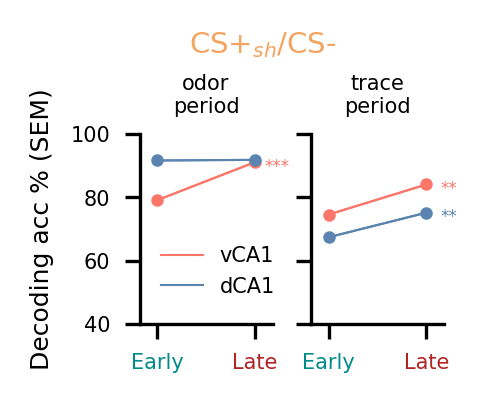

In [1109]:
fig,ax = pl.subplots(1,2,figsize=(1.6,1.2),sharex=True,sharey=True)
v={}
d={}
loops=10
expectations = 'pre','post'

# Add connecting lines            
for ex,c,z in zip(expectations,(('powderblue','midnightblue')),(.2,1.3)):
    for tb,tb_la,x in zip((4,6),('odor','trace'),(range(2))):
            ax[x].plot([p for p in (.2,1.3)],
                       [np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_vhpc[ex][:loops]"%(tb)))*100 for ex in expectations],color='#FC766AFF',label='vCA1')
            ax[x].plot([p for p in (.2,1.3)],
                       [np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_dhpc[ex][:loops]"%(tb)))*100 for ex in expectations],color='#5B84B1FF',label='dCA1')
            
for ex,c,z in zip(expectations,(('powderblue','midnightblue')),(.2,1.3)):
    for tb,tb_la,x in zip((4,6),('odor','trace'),(range(2))):
            v[ex+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_shVScsm_vhpc[ex][:loops]"%(tb)))*100/np.sqrt(loops-1))
            ax[x].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_vhpc[ex][:loops]"%(tb)))*100), 'o', color='#FC766AFF',markersize=2)
            ax[x].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_vhpc[ex][:loops]"%(tb)))*100),yerr=v[ex+tb_la],color='#FC766AFF')  
            d[ex+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_shVScsm_dhpc[ex][:loops]"%(tb)))*100/np.sqrt(loops-1))
            ax[x].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_dhpc[ex][:loops]"%(tb)))*100), 'o', color='#5B84B1FF',markersize=2)
            ax[x].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_dhpc[ex][:loops]"%(tb)))*100),yerr=d[ex+tb_la],color='#5B84B1FF')  
            

           #ax[x].tick_params(axis='x',bottom=False,labelbottom=False) # labels along the bottom edge are off
            ax[0].set_ylabel('Decoding acc % (SEM)',fontsize=6)
            ax[x].set_ylim(40,100)
            #ax[x].hlines(50, -.5,2.5, color='k', lw=1, linestyles='dotted')
            ax[x].set_title(tb_la+"\nperiod",y=.98,fontsize=5)
            ax[x].set_xlim(0,1.5)
            ax[x].set_xticks((.2,1.3))
            ax[x].set_xticklabels(['Early','Late'])
            [t.set_color(i) for (i,t) in zip([dark_co[0],dark_co[1]],ax[x].xaxis.get_ticklabels())]
ax[0].legend(labels=['vCA1','dCA1'],frameon=False, loc=(.1,.1))
pl.suptitle('CS+$_{sh}$/CS-',fontsize=7,x=.55,y=1.04,color='sandybrown')

pvs=[]
for x,t in zip([0,1],[4,6]):
    #for c,i in zip (['Rew','Shock','CSm'],['m','sandybrown','c'],[.5,0,0]):
        pvs.append(add_significance_point(ax[x],eval("mean_scores_gmin_tb_%s_shVScsm_vhpc['pre'][:loops]"%(t)),
           eval("mean_scores_gmin_tb_%s_shVScsm_vhpc['post'][:loops]"%(t)),
           1.55,np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_vhpc['post'][:loops]"%(t)))*100-3,color='#FC766AFF'))
        pvs.append(add_significance_point(ax[x],eval("mean_scores_gmin_tb_%s_shVScsm_dhpc['pre'][:loops]"%(t)),
           eval("mean_scores_gmin_tb_%s_shVScsm_dhpc['post'][:loops]"%(t)),
           1.55,np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_dhpc['post'][:loops]"%(t)))*100-3,color='#5B84B1FF'))#,symbol='$\dag$'))
        print t,'v',report_stats(eval("mean_scores_gmin_tb_%s_shVScsm_vhpc['pre'][:loops]"%(t)),
           eval("mean_scores_gmin_tb_%s_shVScsm_vhpc['post'][:loops]"%(t)))
        print t,'d',report_stats(eval("mean_scores_gmin_tb_%s_shVScsm_dhpc['pre'][:loops]"%(t)),
           eval("mean_scores_gmin_tb_%s_shVScsm_dhpc['post'][:loops]"%(t)))
fig.tight_layout(pad=1.5)

fig.savefig('../figures/%s_gmin_PrPo_sh_dots.pdf'%NOTEBOOK_NAME)

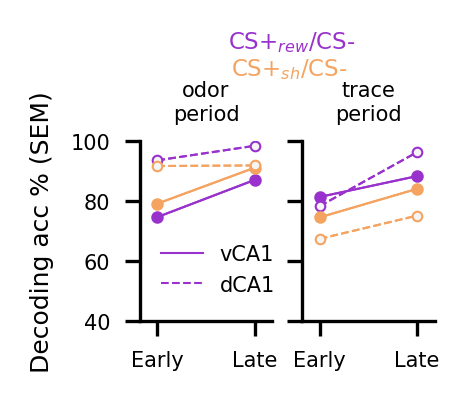

In [957]:
fig,ax = pl.subplots(1,2,figsize=(1.5,1.1),sharex=True,sharey=True)
v={}
d={}
loops=10
expectations = 'pre','post'

# Add connecting lines            
for ex,c,z in zip(expectations,(('powderblue','midnightblue')),(.2,1.3)):
    for tb,tb_la,x in zip((4,6),('odor','trace'),(range(2))):
            ax[x].plot([p for p in (.2,1.3)],
                       [np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_vhpc[ex][:loops]"%(tb)))*100 for ex in expectations],
                       color='darkorchid',label='vCA1')
            ax[x].plot([p for p in (.2,1.3)],
                       [np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_dhpc[ex][:loops]"%(tb)))*100 for ex in expectations],
                       color='darkorchid',linestyle="--",label='dCA1')
            ax[x].plot([p for p in (.2,1.3)],
                       [np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_vhpc[ex][:loops]"%(tb)))*100 for ex in expectations],
                       color='sandybrown',label='vCA1')
            ax[x].plot([p for p in (.2,1.3)],
                       [np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_dhpc[ex][:loops]"%(tb)))*100 for ex in expectations],
                       color='sandybrown',linestyle="--",label='dCA1')
            
for ex,c,z in zip(expectations,(('powderblue','midnightblue')),(.2,1.3)):
    for tb,tb_la,x in zip((4,6),('odor','trace'),(range(2))):
            v[ex+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_rwVScsm_vhpc[ex][:loops]"%(tb)))*100/np.sqrt(loops-1))
            ax[x].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_vhpc[ex][:loops]"%(tb)))*100), 'o', color='darkorchid',markersize=2)
            ax[x].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_vhpc[ex][:loops]"%(tb)))*100),yerr=v[ex+tb_la],color='darkorchid')  
            d[ex+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_rwVScsm_dhpc[ex][:loops]"%(tb)))*100/np.sqrt(loops-1))
            ax[x].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_dhpc[ex][:loops]"%(tb)))*100), 'o', color='whitesmoke',
                       markersize=2.3,mec='darkorchid',mew=.5)
            ax[x].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_dhpc[ex][:loops]"%(tb)))*100),yerr=d[ex+tb_la],color='darkorchid')  
            v[ex+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_shVScsm_vhpc[ex][:loops]"%(tb)))*100/np.sqrt(loops-1))
            ax[x].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_vhpc[ex][:loops]"%(tb)))*100), 'o', color='sandybrown',markersize=2)
            ax[x].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_vhpc[ex][:loops]"%(tb)))*100),yerr=v[ex+tb_la],color='sandybrown')  
            d[ex+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_shVScsm_dhpc[ex][:loops]"%(tb)))*100/np.sqrt(loops-1))
            ax[x].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_dhpc[ex][:loops]"%(tb)))*100), 'o', color='whitesmoke',
                       markersize=2.3,mec='sandybrown',mew=.5)
            ax[x].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_dhpc[ex][:loops]"%(tb)))*100),yerr=d[ex+tb_la],color='sandybrown')  
            

           #ax[x].tick_params(axis='x',bottom=False,labelbottom=False) # labels along the bottom edge are off
            ax[0].set_ylabel('Decoding acc % (SEM)',fontsize=6)
            ax[x].set_ylim(40,100)
            #ax[x].hlines(50, -.5,2.5, color='k', lw=1, linestyles='dotted')
            ax[x].set_title(tb_la+"\nperiod",y=.98,fontsize=5)
            ax[x].set_xlim(0,1.5)
            ax[x].set_xticks((.2,1.3))
            ax[x].set_xticklabels(['Early','Late'])
            #[t.set_color(i) for (i,t) in zip([dark_co[0],dark_co[1]],ax[x].xaxis.get_ticklabels())]
ax[0].legend(labels=['vCA1','dCA1'],frameon=False, loc=(.1,.1))
ax[0].text(1,131,'CS+$_{rew}$/CS-',fontsize=5.5,color='darkorchid')
ax[0].text(1.035,122,'CS+$_{sh}$/CS-',fontsize=5.5,color='sandybrown')


##I think something is wrong below
#pvs=[]
#for tb,tb_la,x in zip((6,8,10),('CS','Trace','US'),(range(3))):
#    for ex,z in zip(expectations,(.2,1.3,)):
#        pvs.append(add_significance(ax[x], eval("mean_scores_gmin_tb_%s_vhpc[ex[0]][:loops]+\
#                    mean_scores_gmin_tb_%s_vhpc[ex[1]][:loops]"%(tb,tb)),
#                    eval("mean_scores_gmin_tb_%s_dhpc[ex[0]][:loops]+\
#                        mean_scores_gmin_tb_%s_dhpc[ex[1]][:loops]"%(tb,tb)),z,z,
#                    max((np.mean(eval("mean_scores_gmin_tb_%s_vhpc[ex[0]][:loops]+\
#                        mean_scores_gmin_tb_%s_vhpc[ex[1]][:loops]"%(tb,tb)))*100)+v[ex[0]+tb_la],
#                    (np.mean(eval("mean_scores_gmin_tb_%s_dhpc[ex[0]][:loops]+\
#                        mean_scores_gmin_tb_%s_dhpc[ex[1]][:loops]"%(tb,tb)))*100)+d[ex[0]+tb_la])+2,
#                    ticksize=0))
##        for d in range(3):
##            pvs.append(sig_vs_chance(ax[x],eval("mean_scores_gmin_tb_%s_%s_%s['renew'][:loops]"%(tb,phases[d],r)),.5,d,
##                   eval("np.mean(mean_scores_gmin_tb_%s_%s_%s['renew'][:loops])"%(tb,phases[d],r))*100+s[phases[d]+r]+1,loops=loops,colors='k'))
##        #       eval("mean_scores_gmin_tb_%s_%s_%s['pre'][:loops]"%(tb,phases[i],r))*100+s+1,loops=loops,sig_func=None,colors='k'))
#    #pvs.append(sig_vs_chance(ax,mean_scores_gmin_tb_10_dhpc[sess][:loops],.5, .2+i,
#    #           np.mean(mean_scores_gmin_tb_10_dhpc[sess][:loops])*100+d[sess]+1,loops=loops,sig_func=None,colors='k'))
#
fig.tight_layout(pad=1)

fig.savefig('../figures/%s_gmin_PrPo_rwsh_dots.pdf'%NOTEBOOK_NAME)

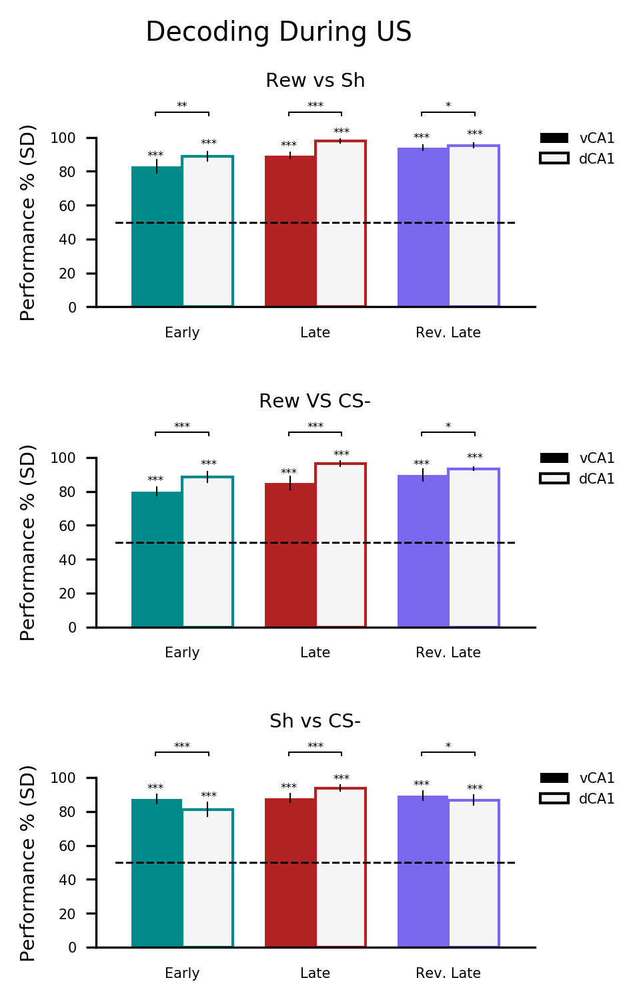

In [23]:
from matplotlib.patches import Patch
labels = session_labels
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 15
v={}
d={}

fig, ax = pl.subplots(3,1,figsize=(3,5),sharey=True)
for lab, l in zip(non_catch_labels,range(3)):
    for sess,c,i in zip(sessions_to_plot,dark_co,range(len(sessions_to_plot))):
        v[sess] = np.array(np.std(eval("mean_scores_gmin_tb_8_%s_vhpc[sess][:loops]"%lab))*100)
        ax[l].bar(i - width/2, np.mean(eval("mean_scores_gmin_tb_8_%s_vhpc[sess][:loops]"%lab))*100, width, color=c,yerr=v[sess])
        d[sess] = np.array(np.std(eval("mean_scores_gmin_tb_8_%s_dhpc[sess][:loops]"%lab))*100)
        ax[l].bar(i + width/2,  np.mean(eval("mean_scores_gmin_tb_8_%s_dhpc[sess][:loops]"%lab))*100, width,color='whitesmoke', edgecolor=c,yerr=d[sess])
        ax[l].hlines(50,-.5,2.5, color='k', lw=.7, linestyles='dashed')
        # Add some text for labels, title and custom x-axis tick labels, etc.
        ax[l].set_ylabel('Performance % (SD)')
        #ax.set_title('Decoding During CS')
        ax[l].set_xticks(x)
        ax[l].set_xticklabels(labels)
        ax[l].legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
        ax[l].tick_params(axis='x',bottom=False)
        ax[l].set_ylim(0,100)
        ax[l].set_title(comp_labels[l],y=1.2)
pvs=[]
for lab, l in zip(non_catch_labels,range(3)):
    for sess,i in zip(sessions_to_plot, range(len(sessions_to_plot))):
        pvs.append(add_significance(ax[l], eval("mean_scores_gmin_tb_8_%s_vhpc[sess][:loops]"%lab), eval("mean_scores_gmin_tb_8_%s_dhpc[sess][:loops]"%lab),
            -.2+i,0.2+i,115))
        pvs.append(sig_vs_chance(ax[l],eval("mean_scores_gmin_tb_8_%s_vhpc[sess][:loops]"%lab),.5,-.2+i,
                   np.mean(eval("mean_scores_gmin_tb_8_%s_vhpc[sess][:loops]"%lab))*100+v[sess]+1,loops=loops,sig_func=None,colors='k'))
        pvs.append(sig_vs_chance(ax[l],eval("mean_scores_gmin_tb_8_%s_dhpc[sess][:loops]"%lab),.5, .2+i,
                   np.mean(eval("mean_scores_gmin_tb_8_%s_dhpc[sess][:loops]"%lab))*100+d[sess]+1,loops=loops,sig_func=None,colors='k'))
pl.suptitle('Decoding During US',y=1,fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../img/%s_gmin_bars_US.jpg'%NOTEBOOK_NAME)

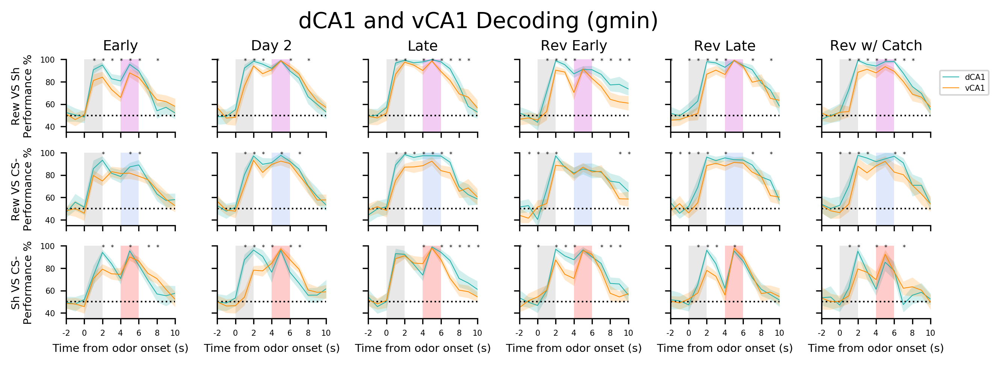

In [30]:
fig, ax = pl.subplots(3,6, figsize=(8.5, 3), sharex=True, sharey=True)
loops=10

for r,sess in zip(range(6),sessions):
    for c,label,col in zip(range(3),non_catch_labels,('darkorchid','tab:blue','tab:red')):
        for re,co,la in zip(('dhpc','vhpc'),('lightseagreen','darkorange'),('dCA1','vCA1')):
            ax[c][r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,re)))*100) for t in range(13)],
                          color=co, label=la)
            m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,re)))*100) for t in range(13)])
            s = np.array([np.std(eval("scores_gmin_tb_%s_%s_%s[sess][:loops]"%(t,label,re)))*100 for t in range(13)])
            ax[c][r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=co,linewidth=0)
        #plot significance
        for t in range(13):
            if eval("mannwhitU_tb_%s_%s[sess][-1].mean()"%(t,label)) < 0.01:
                ax[c][r].text(t-2.1,97,'*',fontsize=4)

for r in range(6):       
    for lab,c,US_co in zip(['Rew VS Sh','Rew VS CS-','Sh VS CS-'],range(3),['m','cornflowerblue','r']):
        ax[c][r].set_ylim(35, 100)
        ax[c][r].set_xlim(-2, 10)
        ax[c][r].set_xticks(np.arange(-2,11, 2))
        ax[c][r].set_xticklabels(np.arange(-2,11, 2))
        ax[c][r].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
        ax[2][r].set_xlabel('Time from odor onset (s)')
        ax[c][0].set_ylabel(lab+'\nPerformance %')
        pt.plot_period_bar(ax[c][r], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.09)
        pt.plot_period_bar(ax[c][r], 0, start_end=(4, 6), color=US_co, delta_y=100, alpha=.2)
        #ax[c][r].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')
ax[0][0].set_title('Early', fontsize=9, color = 'k')
ax[0][1].set_title('Day 2', fontsize=9, color = 'k')
ax[0][2].set_title('Late', fontsize=9, color = 'k')
ax[0][3].set_title('Rev Early', fontsize=9, color = 'k')
ax[0][4].set_title('Rev Late', fontsize=9, color = 'k')
ax[0][5].set_title('Rev w/ Catch', fontsize=9, color='k')
ax[0][5].legend(bbox_to_anchor=(1.05,.9),labelspacing=0.4,fontsize=5)

pl.suptitle('dCA1 and vCA1 Decoding (gmin)',fontsize=14,y=1.05)
fig.tight_layout(pad=1.5)


fig.savefig('../img/%s_gmin_dCA1VSvCA1.pdf'%NOTEBOOK_NAME)

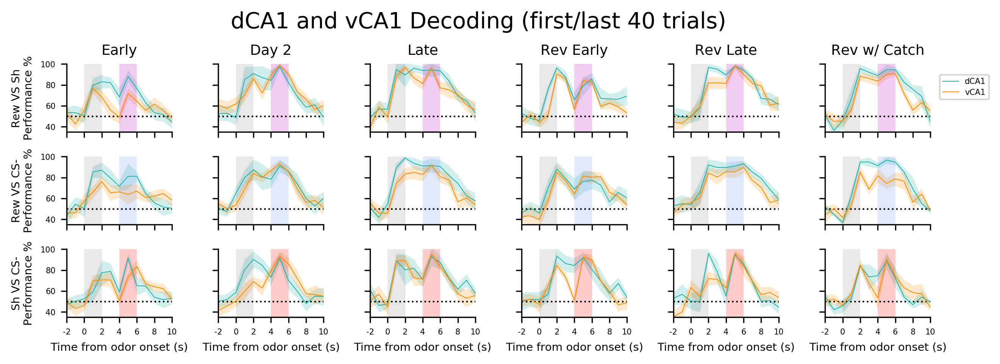

In [31]:
fig, ax = pl.subplots(3,6, figsize=(8.5, 3), sharex=True, sharey=True)
loops=10

for r,sess in zip(range(6),sessions):
    for c,label,col in zip(range(3),non_catch_labels,('darkorchid','tab:blue','tab:red')):
        for re,co,la in zip(('dhpc','vhpc'),('lightseagreen','darkorange'),('dCA1','vCA1')):
            ax[c][r].plot([(t-2) for t in range(13)], [(np.mean(eval("subsets_within_scores_%s_VS_%s_%s_%s[sess][:loops]"%(t,t,label,re)))*100) for t in range(13)],
                          color=co, label=la)
            m = np.array([(np.mean(eval("subsets_within_scores_%s_VS_%s_%s_%s[sess][:loops]"%(t,t,label,re)))*100) for t in range(13)])
            s = np.array([np.std(eval("subsets_within_scores_%s_VS_%s_%s_%s[sess][:loops]"%(t,t,label,re)))*100 for t in range(13)])
            ax[c][r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=co,linewidth=0)
        #plot significance
        #for t in range(13):
        #    if eval("mannwhitU_tb_%s_%s[sess][-1].mean()"%(t,label)) < 0.01:
        #        ax[c][r].text(t-2.1,97,'*',fontsize=4)

for r in range(6):       
    for lab,c,US_co in zip(['Rew VS Sh','Rew VS CS-','Sh VS CS-'],range(3),['m','cornflowerblue','r']):
        ax[c][r].set_ylim(35, 100)
        ax[c][r].set_xlim(-2, 10)
        ax[c][r].set_xticks(np.arange(-2,11, 2))
        ax[c][r].set_xticklabels(np.arange(-2,11, 2))
        ax[c][r].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
        ax[2][r].set_xlabel('Time from odor onset (s)')
        ax[c][0].set_ylabel(lab+'\nPerformance %')
        pt.plot_period_bar(ax[c][r], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.09)
        pt.plot_period_bar(ax[c][r], 0, start_end=(4, 6), color=US_co, delta_y=100, alpha=.2)
        #ax[c][r].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')
ax[0][0].set_title('Early', fontsize=9, color = 'k')
ax[0][1].set_title('Day 2', fontsize=9, color = 'k')
ax[0][2].set_title('Late', fontsize=9, color = 'k')
ax[0][3].set_title('Rev Early', fontsize=9, color = 'k')
ax[0][4].set_title('Rev Late', fontsize=9, color = 'k')
ax[0][5].set_title('Rev w/ Catch', fontsize=9, color='k')
ax[0][5].legend(bbox_to_anchor=(1.05,.9),labelspacing=0.4,fontsize=5)

pl.suptitle('dCA1 and vCA1 Decoding (first/last 40 trials)',fontsize=14,y=1.05)
fig.tight_layout(pad=2)


fig.savefig('../figures/%s_subset_dCA1VSvCA1.pdf'%NOTEBOOK_NAME)

# confusion matrix

In [37]:
import matplotlib

def heatmap(data, row_labels, col_labels, ax=None, cmap='viridis',
            cbar_kw={}, cbarlabel="", **kwargs):
    """
    Create a heatmap from a numpy array and two lists of labels.

    Parameters
    ----------
    data
        A 2D numpy array of shape (N, M).
    row_labels
        A list or array of length N with the labels for the rows.
    col_labels
        A list or array of length M with the labels for the columns.
    ax
        A `matplotlib.axes.Axes` instance to which the heatmap is plotted.  If
        not provided, use current axes or create a new one.  Optional.
    cbar_kw
        A dictionary with arguments to `matplotlib.Figure.colorbar`.  Optional.
    cbarlabel
        The label for the colorbar.  Optional.
    **kwargs
        All other arguments are forwarded to `imshow`.
    """

    if not ax:
        ax = pl.gca()

    # Plot the heatmap
    im = ax.imshow(data, cmap, origin="lower", **kwargs)

    # Create colorbar
    #cbar = ax.figure.colorbar(im, ax=ax, **cbar_kw)
    #cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")

    # We want to show all ticks...
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_yticks(np.arange(data.shape[0]))
    # ... and label them with the respective list entries.
    ax.set_xticklabels(col_labels, fontsize=7)
    ax.set_yticklabels(row_labels, fontsize=7)

    # Let the horizontal axes labeling appear on top.
    #ax.tick_params(top=True, bottom=False,
    #               labeltop=True, labelbottom=False)

    # Rotate the tick labels and set their alignment.
    pl.setp(ax.get_xticklabels(), rotation=0, ha="center",
         rotation_mode="anchor")

    # Turn spines off and create white grid.
    for edge, spine in ax.spines.items():
        spine.set_visible(False)

    ax.set_xticks(np.arange(data.shape[1])-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0])-.5, minor=True)
    ax.grid(which="minor", color="w", linestyle='-', linewidth=.5)
    ax.tick_params(axis='both', which='both', bottom=False, left=False,pad=-1)

    return im#, cbar


def annotate_heatmap(im, data=None, valfmt="{x:.2f}",
                     textcolors=["white", "black"],
                     threshold=None, **textkw):
    """
    A function to annotate a heatmap.

    Parameters
    ----------
    im
        The AxesImage to be labeled.
    data
        Data used to annotate.  If None, the image's data is used.  Optional.
    valfmt
        The format of the annotations inside the heatmap.  This should either
        use the string format method, e.g. "$ {x:.2f}", or be a
        `matplotlib.ticker.Formatter`.  Optional.
    textcolors
        A list or array of two color specifications.  The first is used for
        values below a threshold, the second for those above.  Optional.
    threshold
        Value in data units according to which the colors from textcolors are
        applied.  If None (the default) uses the middle of the colormap as
        separation.  Optional.
    **kwargs
        All other arguments are forwarded to each call to `text` used to create
        the text labels.
    """

    if not isinstance(data, (list, np.ndarray)):
        data = im.get_array()

    # Normalize the threshold to the images color range.
    if threshold is not None:
        threshold = im.norm(threshold)
    else:
        threshold = im.norm(data.max())/2.

    # Set default alignment to center, but allow it to be
    # overwritten by textkw.
    kw = dict(horizontalalignment="center",
              verticalalignment="center")
    kw.update(textkw)

    # Get the formatter in case a string is supplied
    if isinstance(valfmt, str):
        valfmt = matplotlib.ticker.StrMethodFormatter(valfmt)

    # Loop over the data and create a `Text` for each "pixel".
    # Change the text's color depending on the data.
    texts = []
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            kw.update(color=textcolors[int(im.norm(data[i, j]) > threshold)])
            text = im.axes.text(j, i, valfmt(data[i, j], None), **kw)
            texts.append(text)

    return texts

In [36]:
v_name=[]
for r in 'dhpc','vhpc':
        for sess in sessions:
            exec("heatmaps_%s_%s = {}"%(sess,r))
            exec("v_name = 'heatmaps_%s'"%(sess))
            exec("path='../notebooks/autorestore/decoding_around_onset_combined_1sec_%s/'"%(r))
            #exec("scores_tb_%s_outcome_%s_%s_t = {}"%(t,label,r))
            exec("heatmaps_%s_%s = ut.load_variable(v_name,path)"%(sess,r))

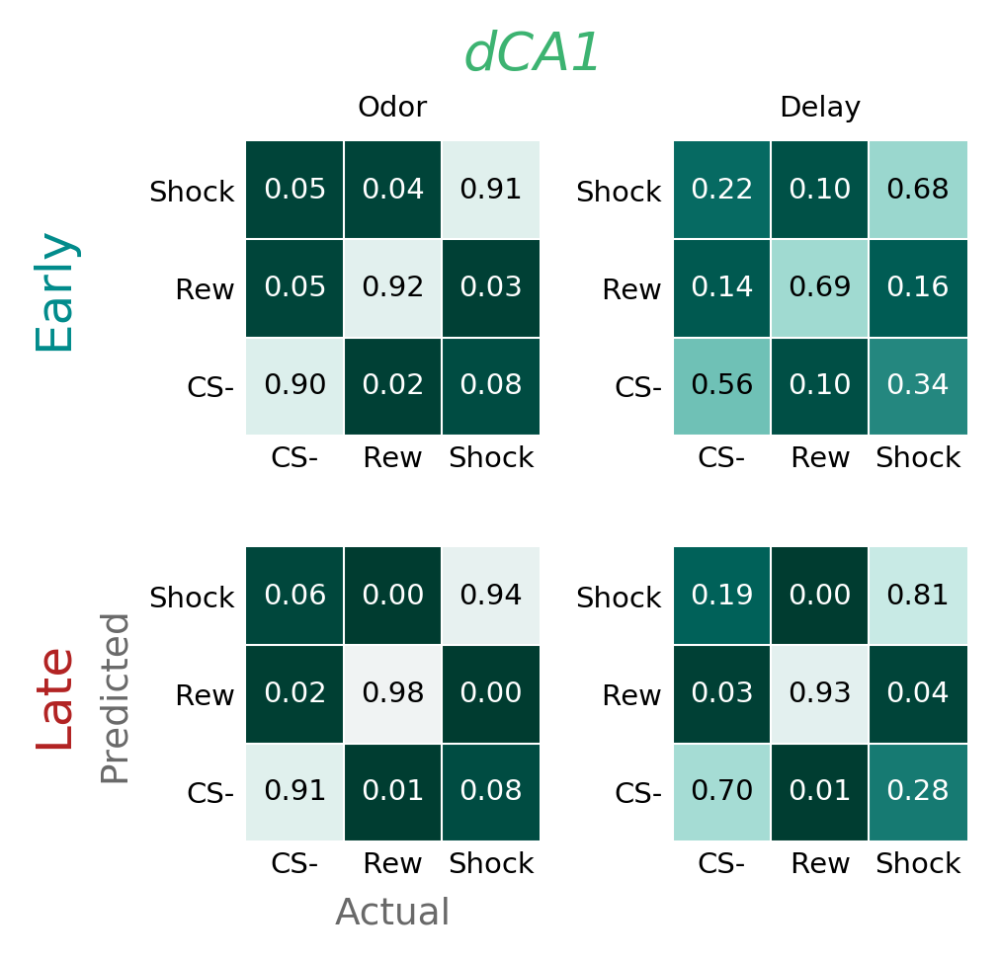

In [41]:
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
cmap=cm.get_cmap('BrBG')
newcolors=cmap(np.linspace(1, .5, 128))
new_cmap = ListedColormap(newcolors)

fig, ((ax0,ax1),(ax2,ax3)) = pl.subplots(2, 2, figsize=(3.2, 3.2))

for sess,x,c in zip(['pre','post'],range(2),[0,2]):
    for i,tb,la in zip(range(2),[4,6],['Odor','Delay']):
        y = 2*x+i
        im = heatmap(3.*eval("heatmaps_%s_dhpc[tb]"%sess)/np.sum(eval("heatmaps_%s_dhpc[tb]"%sess)),(['CS-','Rew', 'Shock']),
                     (['CS-','Rew', 'Shock']), ax=eval('ax%s'%y),vmin=0,vmax=1,cmap=new_cmap)
        annotate_heatmap(im, valfmt="{x:.2f}", size=7)
        eval('ax%s'%i).set_title(la)
        eval("ax%s.set_xlabel"%2)('Actual',fontsize=9,color='dimgrey')
        eval("ax%s.set_ylabel"%2)('Predicted',fontsize=9,color='dimgrey')
ax0.text(-2.7,1,'Early',ha='left',va='center',fontsize=12,color=dark_co[0],rotation=90)
ax2.text(-2.7,1,'Late',ha='left',va='center',fontsize=12,color=dark_co[1],rotation=90)
pl.suptitle('dCA1',fontsize=13,y=1.01,color='lightseagreen', fontstyle='italic')
pl.tight_layout(pad=2)
pl.show()
fig.savefig('../figures/%s_confusion_PrPo_d.pdf'%NOTEBOOK_NAME)

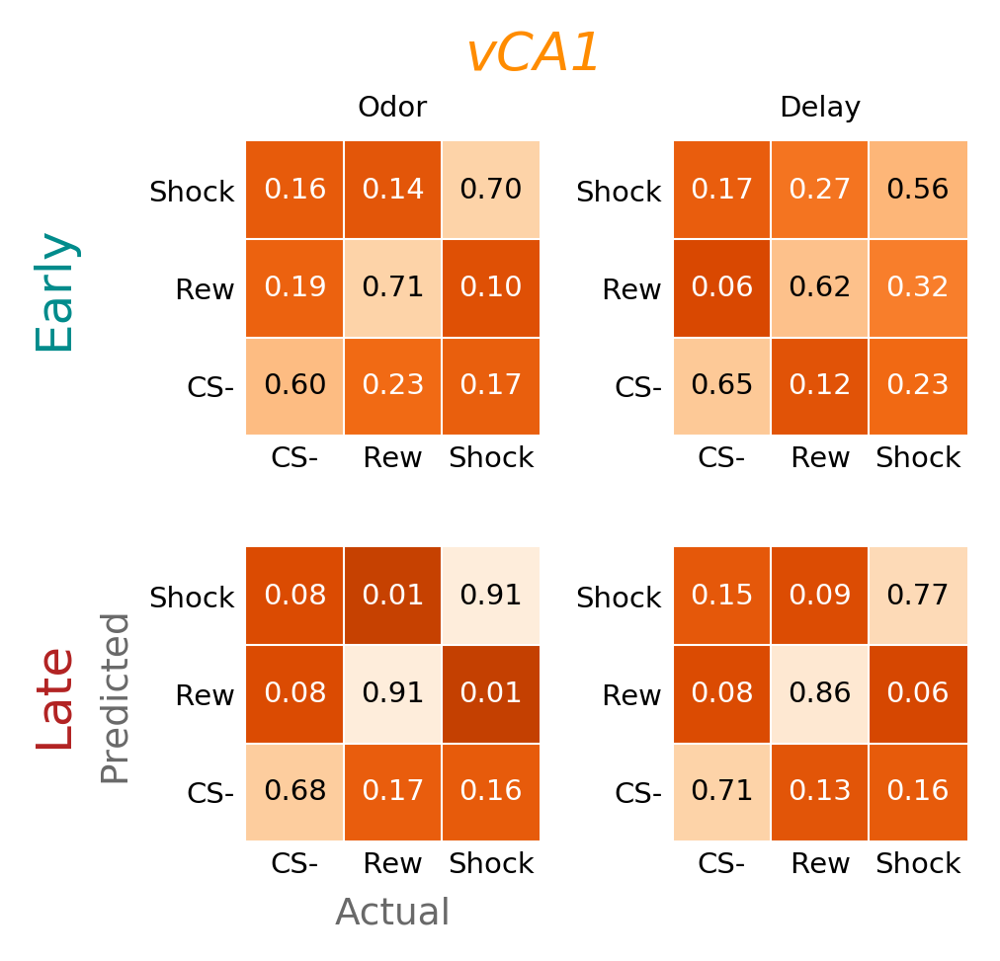

In [44]:
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
cmap=cm.get_cmap('Oranges')
newcolors=cmap(np.linspace(.8, 0, 128))
new_cmap = ListedColormap(newcolors)

fig, ((ax0,ax1),(ax2,ax3)) = pl.subplots(2, 2, figsize=(3.2, 3.2))

for sess,x,c in zip(['pre','post'],range(2),[0,2]):
    for i,tb,la in zip(range(2),[4,6],['Odor','Delay']):
        y = 2*x+i
        im = heatmap(3.*eval("heatmaps_%s_vhpc[tb]"%sess)/np.sum(eval("heatmaps_%s_vhpc[tb]"%sess)),(['CS-','Rew', 'Shock']),
                     (['CS-','Rew', 'Shock']), ax=eval('ax%s'%y),vmin=0,vmax=1,cmap=new_cmap)
        annotate_heatmap(im, valfmt="{x:.2f}", size=7)
        eval('ax%s'%i).set_title(la)
        eval("ax%s.set_xlabel"%2)('Actual',fontsize=9,color='dimgrey')
        eval("ax%s.set_ylabel"%2)('Predicted',fontsize=9,color='dimgrey')
ax0.text(-2.7,1,'Early',ha='left',va='center',fontsize=12,color=dark_co[0],rotation=90)
ax2.text(-2.7,1,'Late',ha='left',va='center',fontsize=12,color=dark_co[1],rotation=90)
pl.suptitle('vCA1',fontsize=13,y=1.01,color='darkorange', fontstyle='italic')
pl.tight_layout(pad=2)
pl.show()
fig.savefig('../figures/%s_confusion_PrPo_v.pdf'%NOTEBOOK_NAME)

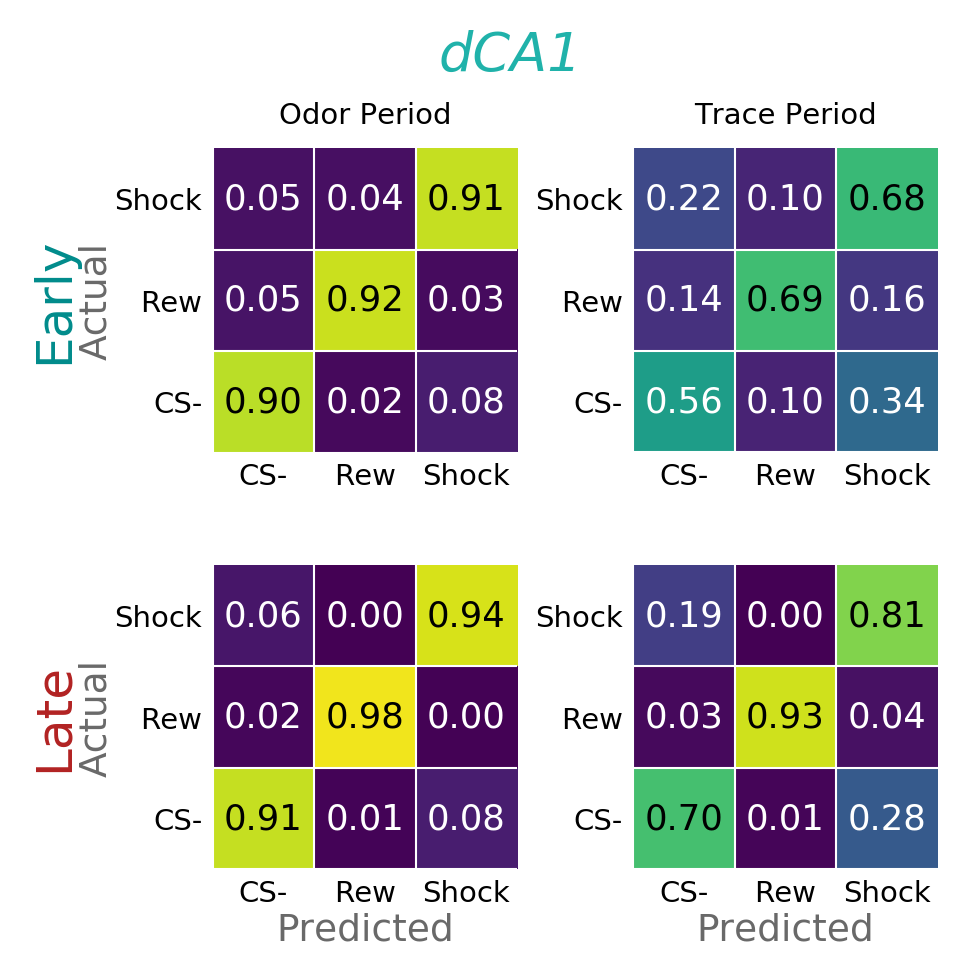

In [993]:
fig, ((ax0,ax1),(ax2,ax3)) = pl.subplots(2, 2, figsize=(3, 3))

for sess,x,c in zip(['pre','post'],range(2),[0,2]):
    for i,tb,la in zip(range(2),[4,6],['Odor Period','Trace Period']):
        y = 2*x+i
        im = heatmap(3.*eval("heatmaps_%s_dhpc[tb]"%sess)/np.sum(eval("heatmaps_%s_dhpc[tb]"%sess)),(['CS-','Rew', 'Shock']),
                     (['CS-','Rew', 'Shock']), ax=eval('ax%s'%y),vmin=0,vmax=1,cmap='viridis')
        annotate_heatmap(im, valfmt="{x:.2f}", size=8.5,textcolors=['white','black'],threshold=.6)
        eval('ax%s'%i).set_title(la)
        for y in 2,3:
            eval("ax%s.set_xlabel"%y)('Predicted',fontsize=9,color='dimgrey',labelpad=1)
        for y in 0,2:
            eval("ax%s.set_ylabel"%y)('Actual',fontsize=9,color='dimgrey',labelpad=0)
ax0.text(-2.3,1,'Early',ha='left',va='center',fontsize=12,color=dark_co[0],rotation=90)
ax2.text(-2.3,1,'Late',ha='left',va='center',fontsize=12,color=dark_co[1],rotation=90)
pl.suptitle('dCA1',fontsize=13,y=1.05,color='lightseagreen', fontstyle='italic')
pl.tight_layout(h_pad=3)
pl.show()
fig.savefig('../figures/%s_confusion_PrPo_d.pdf'%NOTEBOOK_NAME)

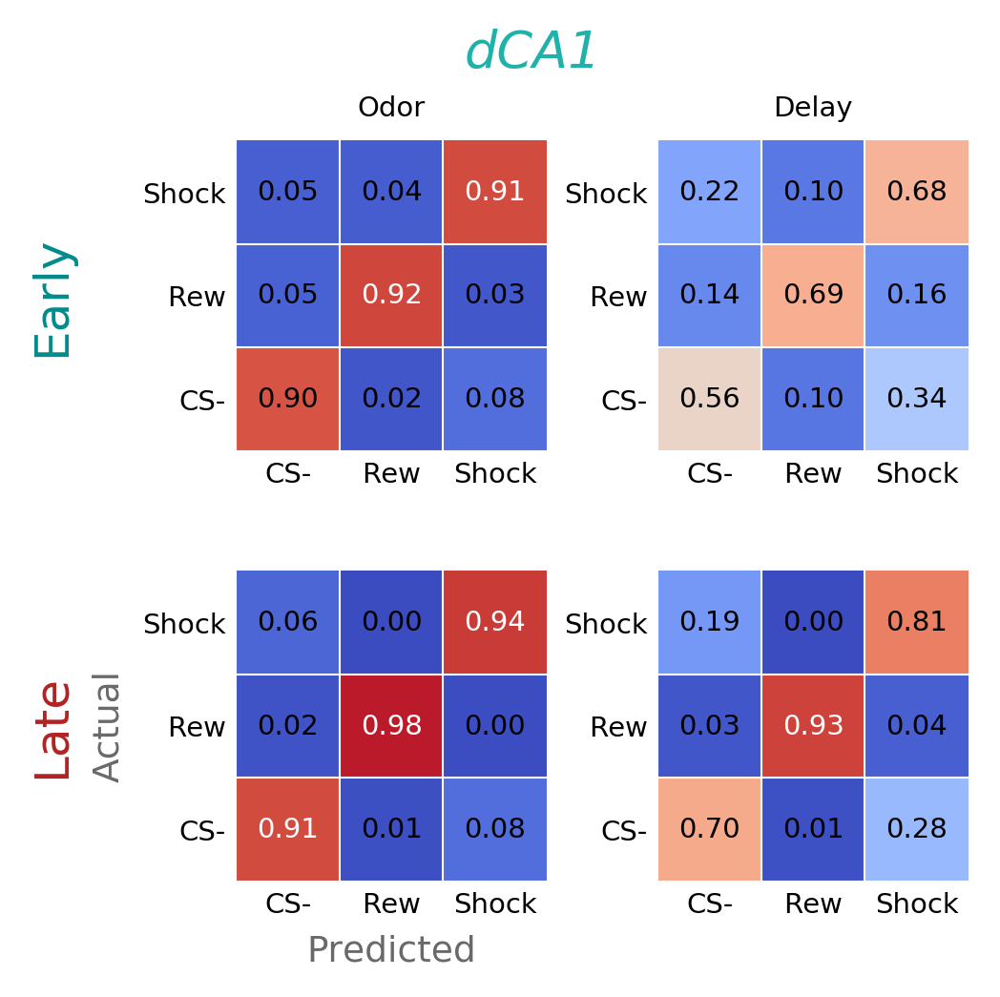

In [895]:
fig, ((ax0,ax1),(ax2,ax3)) = pl.subplots(2, 2, figsize=(3.2, 3.2))

for sess,x,c in zip(['pre','post'],range(2),[0,2]):
    for i,tb,la in zip(range(2),[4,6],['Odor','Delay']):
        y = 2*x+i
        im = heatmap(3.*eval("heatmaps_%s_dhpc[tb]"%sess)/np.sum(eval("heatmaps_%s_dhpc[tb]"%sess)),(['CS-','Rew', 'Shock']),
                     (['CS-','Rew', 'Shock']), ax=eval('ax%s'%y),vmin=0,vmax=1,cmap='coolwarm')
        annotate_heatmap(im, valfmt="{x:.2f}", size=7,textcolors=['black','white'],threshold=.9)
        eval('ax%s'%i).set_title(la)
        eval("ax%s.set_xlabel"%2)('Predicted',fontsize=9,color='dimgrey')
        eval("ax%s.set_ylabel"%2)('Actual',fontsize=9,color='dimgrey')
ax0.text(-2.5,1,'Early',ha='left',va='center',fontsize=12,color=dark_co[0],rotation=90)
ax2.text(-2.5,1,'Late',ha='left',va='center',fontsize=12,color=dark_co[1],rotation=90)
pl.suptitle('dCA1',fontsize=13,y=1.05,color='lightseagreen', fontstyle='italic')
pl.tight_layout(h_pad=4)
pl.show()
#fig.savefig('../figures/%s_confusion_PrPo_d.pdf'%NOTEBOOK_NAME)

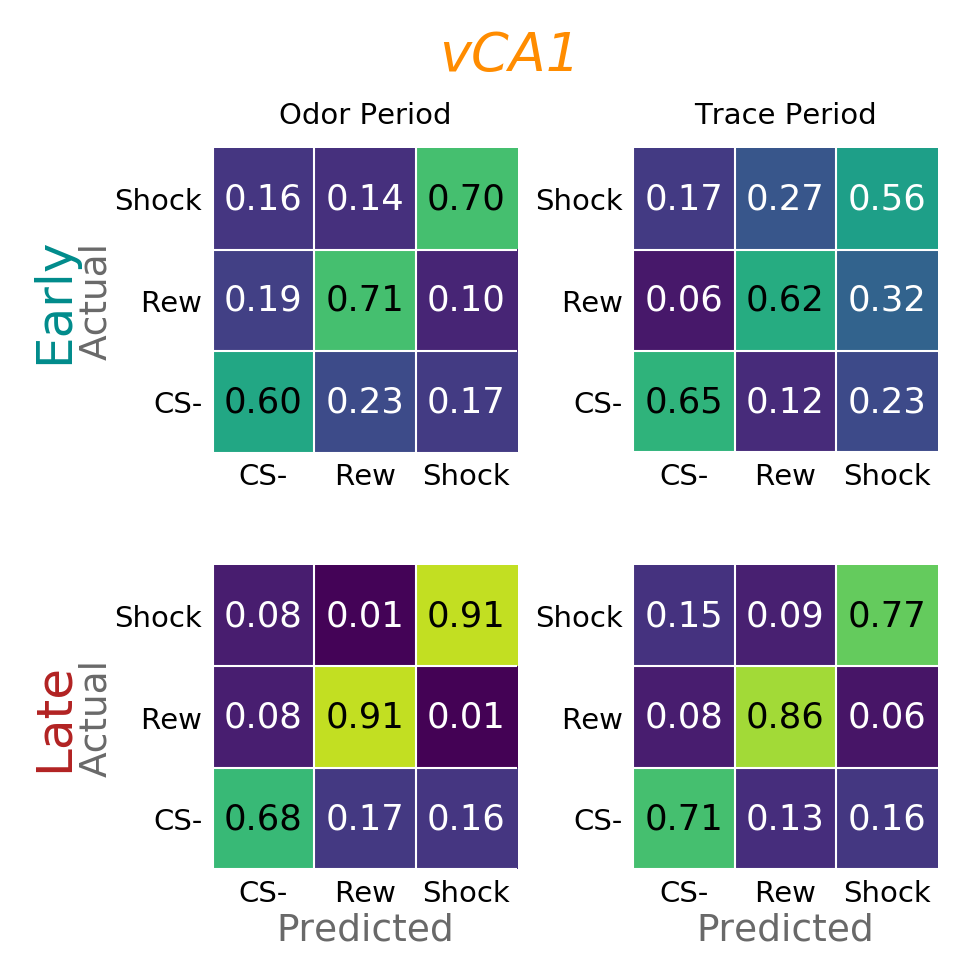

In [994]:
fig, ((ax0,ax1),(ax2,ax3)) = pl.subplots(2, 2, figsize=(3, 3))

for sess,x,c in zip(['pre','post'],range(2),[0,2]):
    for i,tb,la in zip(range(2),[4,6],['Odor Period','Trace Period']):
        y = 2*x+i
        im = heatmap(3.*eval("heatmaps_%s_vhpc[tb]"%sess)/np.sum(eval("heatmaps_%s_vhpc[tb]"%sess)),(['CS-','Rew', 'Shock']),
                     (['CS-','Rew', 'Shock']), ax=eval('ax%s'%y),vmin=0,vmax=1,cmap='viridis')
        annotate_heatmap(im, valfmt="{x:.2f}", size=8.5,textcolors=['white','black'],threshold=.6)
        eval('ax%s'%i).set_title(la)
        for y in 2,3:
            eval("ax%s.set_xlabel"%y)('Predicted',fontsize=9,color='dimgrey',labelpad=1)
        for y in 0,2:
            eval("ax%s.set_ylabel"%y)('Actual',fontsize=9,color='dimgrey',labelpad=0)
ax0.text(-2.3,1,'Early',ha='left',va='center',fontsize=12,color=dark_co[0],rotation=90)
ax2.text(-2.3,1,'Late',ha='left',va='center',fontsize=12,color=dark_co[1],rotation=90)
pl.suptitle('vCA1',fontsize=13,y=1.05,color='darkorange', fontstyle='italic')
pl.tight_layout(h_pad=3)
pl.show()
fig.savefig('../figures/%s_confusion_PrPo_v.pdf'%NOTEBOOK_NAME)

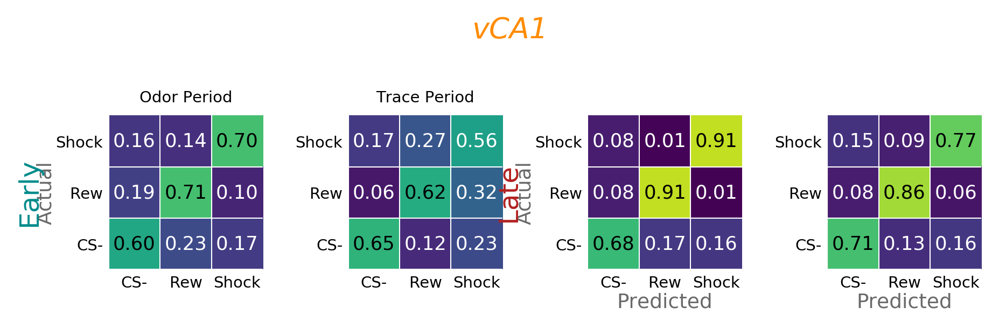

In [1002]:
fig, ((ax0,ax1,ax2,ax3)) = pl.subplots(1, 4, figsize=(6, 2))

for sess,x,c in zip(['pre','post'],range(2),[0,2]):
    for i,tb,la in zip(range(2),[4,6],['Odor Period','Trace Period']):
        y = 2*x+i
        im = heatmap(3.*eval("heatmaps_%s_vhpc[tb]"%sess)/np.sum(eval("heatmaps_%s_vhpc[tb]"%sess)),(['CS-','Rew', 'Shock']),
                     (['CS-','Rew', 'Shock']), ax=eval('ax%s'%y),vmin=0,vmax=1,cmap='viridis')
        annotate_heatmap(im, valfmt="{x:.2f}", size=8.5,textcolors=['white','black'],threshold=.6)
        eval('ax%s'%i).set_title(la)
        for y in 2,3:
            eval("ax%s.set_xlabel"%y)('Predicted',fontsize=9,color='dimgrey',labelpad=1)
        for y in 0,2:
            eval("ax%s.set_ylabel"%y)('Actual',fontsize=9,color='dimgrey',labelpad=0)
ax0.text(-2.3,1,'Early',ha='left',va='center',fontsize=12,color=dark_co[0],rotation=90)
ax2.text(-2.3,1,'Late',ha='left',va='center',fontsize=12,color=dark_co[1],rotation=90)
pl.suptitle('vCA1',fontsize=13,y=1.05,color='darkorange', fontstyle='italic')
pl.tight_layout(pad=1)
pl.show()
fig.savefig('../figures/%s_confusion_PrPo_v_hor.pdf'%NOTEBOOK_NAME)

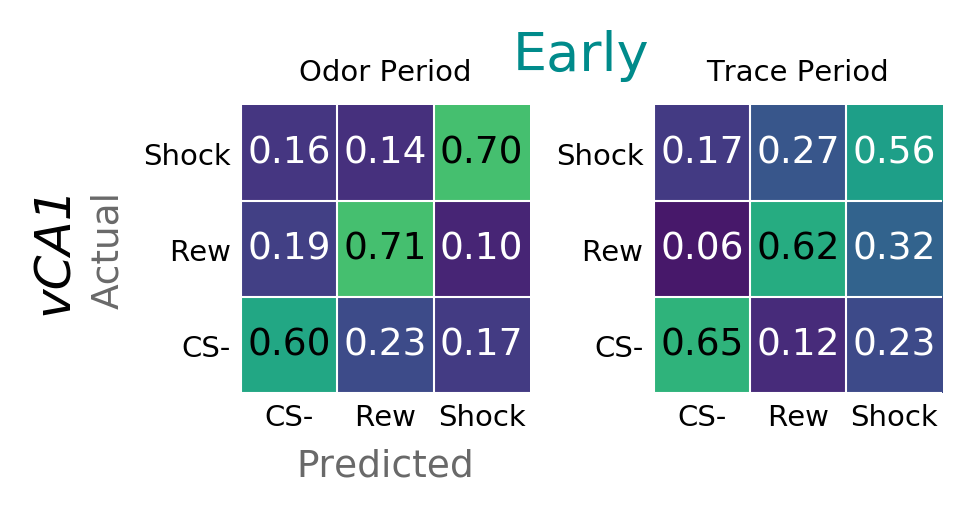

In [1035]:
fig, ((ax0,ax1)) = pl.subplots(1, 2, figsize=(3, 1.55))

for sess,x,c in zip(['pre'],range(1),[0,2]):
    for i,tb,la in zip(range(2),[4,6],['Odor Period','Trace Period']):
        y = 2*x+i
        im = heatmap(3.*eval("heatmaps_%s_vhpc[tb]"%sess)/np.sum(eval("heatmaps_%s_vhpc[tb]"%sess)),(['CS-','Rew', 'Shock']),
                     (['CS-','Rew', 'Shock']), ax=eval('ax%s'%y),vmin=0,vmax=1,cmap='viridis')
        annotate_heatmap(im, valfmt="{x:.2f}", size=9,textcolors=['white','black'],threshold=.6)
        eval('ax%s'%i).set_title(la)
        eval("ax%s.set_xlabel"%0)('Predicted',fontsize=9,color='dimgrey')
        eval("ax%s.set_ylabel"%0)('Actual',fontsize=9,color='dimgrey')
ax0.text(-2.7,1,'vCA1',ha='left',va='center',fontsize=12,color='k',rotation=90,fontstyle='italic',)
pl.suptitle('Early',fontsize=13,y=1.02,x=.57,color=dark_co[0])
pl.tight_layout(h_pad=4)
pl.show()
fig.savefig('../figures/%s_confusion_Pre_v.pdf'%NOTEBOOK_NAME)

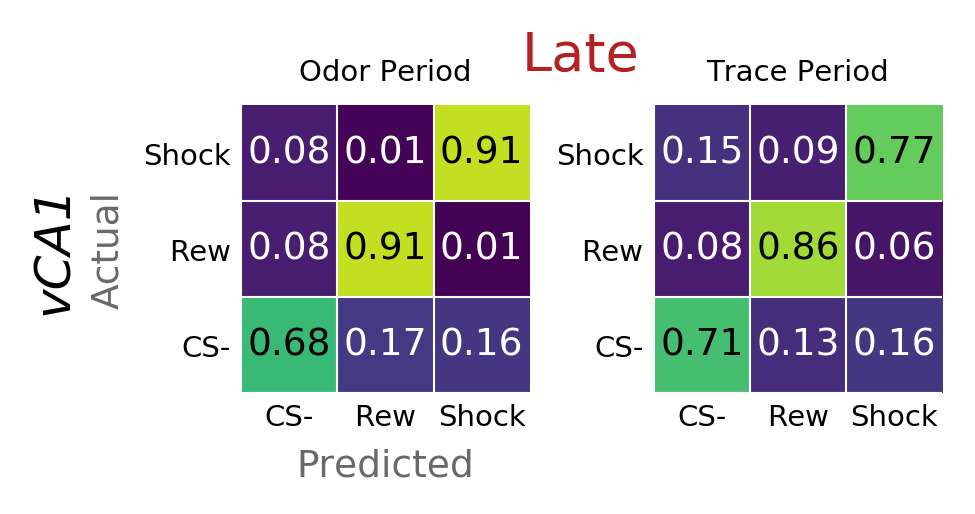

In [1034]:
fig, ((ax0,ax1)) = pl.subplots(1, 2, figsize=(3, 1.55))

for sess,x,c in zip(['post'],range(1),[0,2]):
    for i,tb,la in zip(range(2),[4,6],['Odor Period','Trace Period']):
        y = 2*x+i
        im = heatmap(3.*eval("heatmaps_%s_vhpc[tb]"%sess)/np.sum(eval("heatmaps_%s_vhpc[tb]"%sess)),(['CS-','Rew', 'Shock']),
                     (['CS-','Rew', 'Shock']), ax=eval('ax%s'%y),vmin=0,vmax=1,cmap='viridis')
        annotate_heatmap(im, valfmt="{x:.2f}", size=9,textcolors=['white','black'],threshold=.6)
        eval('ax%s'%i).set_title(la)
        eval("ax%s.set_xlabel"%0)('Predicted',fontsize=9,color='dimgrey')
        eval("ax%s.set_ylabel"%0)('Actual',fontsize=9,color='dimgrey')
ax0.text(-2.7,1,'vCA1',ha='left',va='center',fontsize=12,color='k',rotation=90,fontstyle='italic',)
pl.suptitle('Late',fontsize=13,y=1.02,x=.57,color=dark_co[1])
pl.tight_layout(h_pad=4)
pl.show()
fig.savefig('../figures/%s_confusion_Po_v.pdf'%NOTEBOOK_NAME)

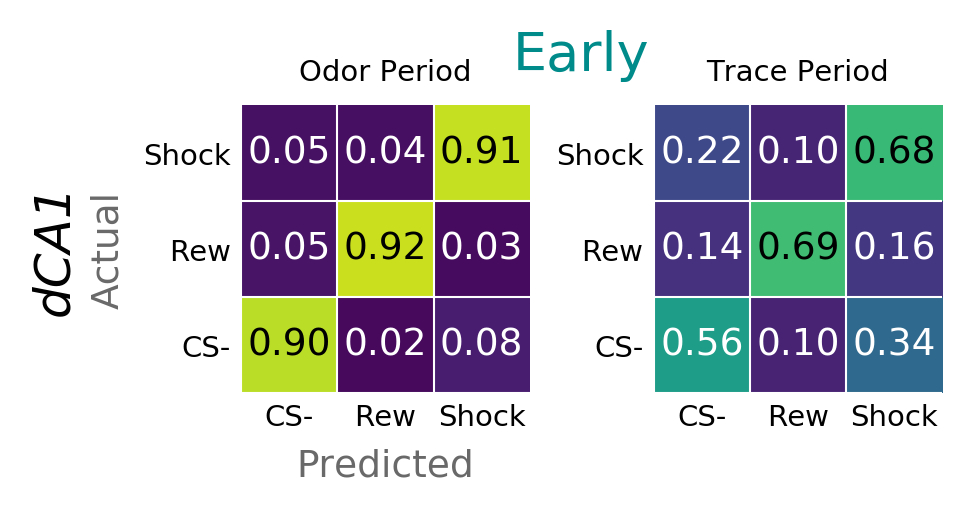

In [1032]:
fig, ((ax0,ax1)) = pl.subplots(1, 2, figsize=(3, 1.55))

for sess,x,c in zip(['pre'],range(1),[0,2]):
    for i,tb,la in zip(range(2),[4,6],['Odor Period','Trace Period']):
        y = 2*x+i
        im = heatmap(3.*eval("heatmaps_%s_dhpc[tb]"%sess)/np.sum(eval("heatmaps_%s_dhpc[tb]"%sess)),(['CS-','Rew', 'Shock']),
                     (['CS-','Rew', 'Shock']), ax=eval('ax%s'%y),vmin=0,vmax=1,cmap='viridis')
        annotate_heatmap(im, valfmt="{x:.2f}", size=9,textcolors=['white','black'],threshold=.6)
        eval('ax%s'%i).set_title(la)
        eval("ax%s.set_xlabel"%0)('Predicted',fontsize=9,color='dimgrey')
        eval("ax%s.set_ylabel"%0)('Actual',fontsize=9,color='dimgrey')
ax0.text(-2.7,1,'dCA1',ha='left',va='center',fontsize=12,color='k',rotation=90,fontstyle='italic',)
pl.suptitle('Early',fontsize=13,y=1.02,x=.57,color=dark_co[0])
pl.tight_layout(h_pad=4)
pl.show()
fig.savefig('../figures/%s_confusion_Pre_d.pdf'%NOTEBOOK_NAME)

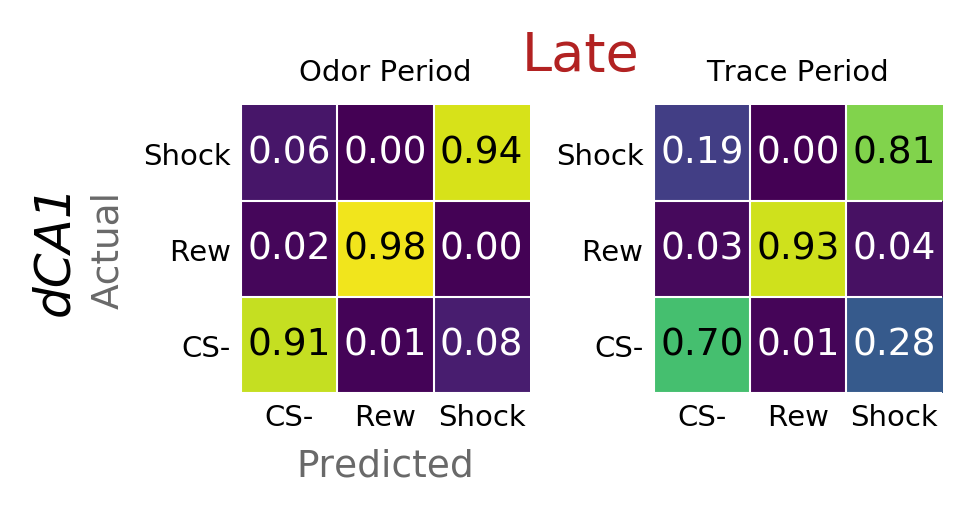

In [1033]:
fig, ((ax0,ax1)) = pl.subplots(1, 2, figsize=(3, 1.55))

for sess,x,c in zip(['post'],range(1),[0,2]):
    for i,tb,la in zip(range(2),[4,6],['Odor Period','Trace Period']):
        y = 2*x+i
        im = heatmap(3.*eval("heatmaps_%s_dhpc[tb]"%sess)/np.sum(eval("heatmaps_%s_dhpc[tb]"%sess)),(['CS-','Rew', 'Shock']),
                     (['CS-','Rew', 'Shock']), ax=eval('ax%s'%y),vmin=0,vmax=1,cmap='viridis')
        annotate_heatmap(im, valfmt="{x:.2f}", size=9,textcolors=['white','black'],threshold=.6)
        eval('ax%s'%i).set_title(la)
        eval("ax%s.set_xlabel"%0)('Predicted',fontsize=9,color='dimgrey')
        eval("ax%s.set_ylabel"%0)('Actual',fontsize=9,color='dimgrey')
ax0.text(-2.7,1,'dCA1',ha='left',va='center',fontsize=12,color='k',rotation=90,fontstyle='italic',)
pl.suptitle('Late',fontsize=13,y=1.02,x=.57,color=dark_co[1])
pl.tight_layout(h_pad=4)
pl.show()
fig.savefig('../figures/%s_confusion_Po_d.pdf'%NOTEBOOK_NAME)

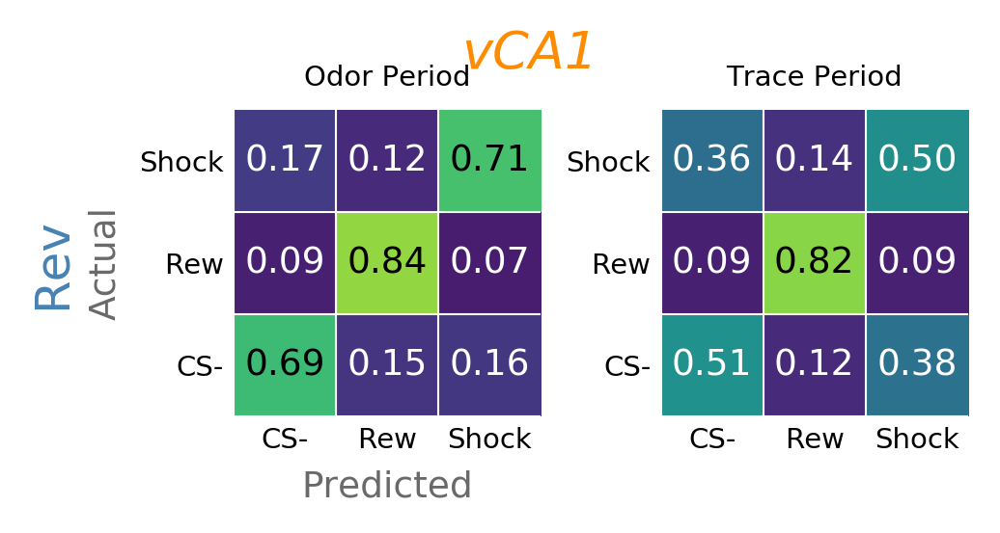

In [38]:
fig, ((ax0,ax1)) = pl.subplots(1, 2, figsize=(3.2, 1.7))

for sess,x,c in zip(['post_rev'],range(1),[0,2]):
    for i,tb,la in zip(range(2),[4,6],['Odor Period','Trace Period']):
        y = 2*x+i
        im = heatmap(3.*eval("heatmaps_%s_vhpc[tb]"%sess)/np.sum(eval("heatmaps_%s_vhpc[tb]"%sess)),(['CS-','Rew', 'Shock']),
                     (['CS-','Rew', 'Shock']), ax=eval('ax%s'%y),vmin=0,vmax=1,cmap='viridis')
        annotate_heatmap(im, valfmt="{x:.2f}", size=9,textcolors=['white','black'],threshold=.6)
        eval('ax%s'%i).set_title(la)
        eval("ax%s.set_xlabel"%0)('Predicted',fontsize=9,color='dimgrey')
        eval("ax%s.set_ylabel"%0)('Actual',fontsize=9,color='dimgrey')
ax0.text(-2.5,1,'Rev',ha='left',va='center',fontsize=12,color=dark_co[-1],rotation=90)
pl.suptitle('vCA1',fontsize=13,y=1.02,color='darkorange', fontstyle='italic')
pl.tight_layout(h_pad=4)
pl.show()
fig.savefig('../figures/%s_confusion_Rev_v.pdf'%NOTEBOOK_NAME)

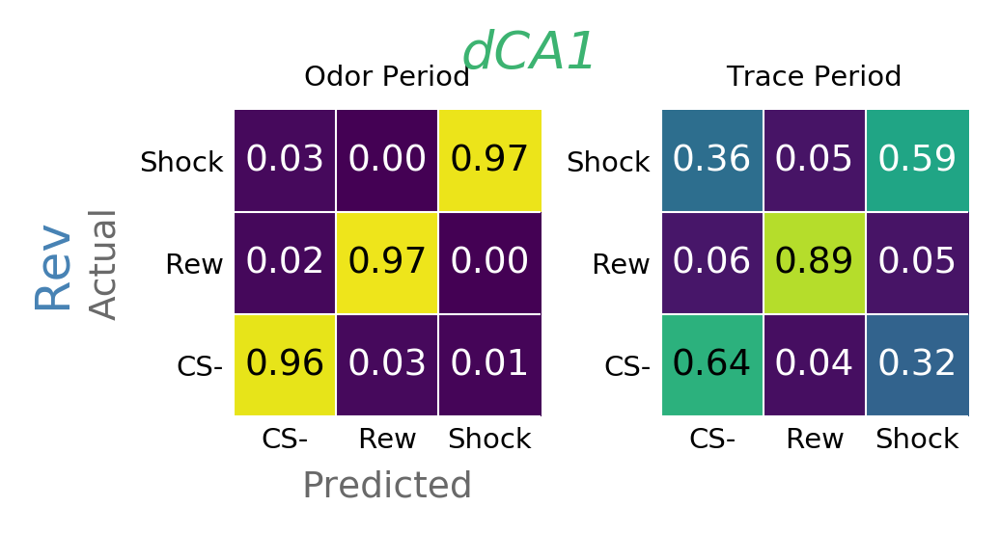

In [39]:
fig, ((ax0,ax1)) = pl.subplots(1, 2, figsize=(3.2, 1.7))

for sess,x,c in zip(['post_rev'],range(1),[0,2]):
    for i,tb,la in zip(range(2),[4,6],['Odor Period','Trace Period']):
        y = 2*x+i
        im = heatmap(3.*eval("heatmaps_%s_dhpc[tb]"%sess)/np.sum(eval("heatmaps_%s_dhpc[tb]"%sess)),(['CS-','Rew', 'Shock']),
                     (['CS-','Rew', 'Shock']), ax=eval('ax%s'%y),vmin=0,vmax=1,cmap='viridis')
        annotate_heatmap(im, valfmt="{x:.2f}", size=9,textcolors=['white','black'],threshold=.6)
        eval('ax%s'%i).set_title(la)
        eval("ax%s.set_xlabel"%0)('Predicted',fontsize=9,color='dimgrey')
        eval("ax%s.set_ylabel"%0)('Actual',fontsize=9,color='dimgrey')
ax0.text(-2.5,1,'Rev',ha='left',va='center',fontsize=12,color=dark_co[-1],rotation=90)
pl.suptitle('dCA1',fontsize=13,y=1.02,color='mediumseagreen', fontstyle='italic')
pl.tight_layout(h_pad=4)
pl.show()
fig.savefig('../figures/%s_confusion_Rev_d.pdf'%NOTEBOOK_NAME)

In [312]:
print heatmaps_pre_vhpc[6]/10
print np.sum(heatmaps_pre_vhpc[6])

[[65 12 22]
 [ 6 62 31]
 [16 26 56]]
3000


In [352]:
#make 2x2 contingency table
for per,tb in zip (['CS','tr','US'],[4,6,8]):
    for x,y in zip (range(3),['CSm','Rew','Shock']):
        for sess in 'pre','post':
            for reg in 'vhpc','dhpc':
                exec("table_%s_%s_%s_%s = []"%(per,y,sess,reg))
                exec("table_%s_%s_%s_%s.append(heatmaps_%s_%s[tb][x][x]/5)"%(per,y,sess,reg,sess,reg))
                exec("table_%s_%s_%s_%s.append(np.sum(heatmaps_%s_%s[tb][x]/5)-heatmaps_%s_%s[tb][x][x]/5)"%(per,y,sess,reg,sess,reg,sess,reg))
                #print eval("table_%s_%s_%s_%s"%(per,y,sess,reg))
for per in ['CS','tr','US']:
    for reg in 'vhpc','dhpc':
        for y in ['CSm','Rew','Shock']:
            exec("table_%s_%s_PrPo_%s = table_%s_%s_pre_%s,table_%s_%s_post_%s"%(per,y,reg,per,y,reg,per,y,reg))
print table_CS_CSm_PrPo_dhpc

([179, 19], [182, 17])


In [986]:
sstats.fisher_exact(table_CS_Rew_PrPo_dhpc, alternative='two-sided')

(0.17506377551020408, 0.0035828127102992234)

In [623]:
#mmc = multiple-comparisons correction (using bonferroni), where mcc = number of comparisons))

from matplotlib.lines import Line2D
def add_significance_fishers(ax, array1, array2, x1, x2, y, ticksize=0.02, sig_func=None, thresholds=(0.05, 0.01, 0.001),mcc=1,color='k'):
    table = array1,array2
    if sig_func is None:
        sig_func = lambda x: sstats.fisher_exact(x, alternative='two-sided')
    p = sig_func(table)[-1]
    sig_value = sig_func(table)[0]
    deltay = np.diff(ax.axis()[-2:])*ticksize
    line = Line2D([x1, x1, x2, x2], [y-deltay, y, y, y-deltay], lw=.5, color='k', clip_on=False)
    ax.add_line(line)
    ax.text(np.mean([x1, x2]), y+1,
            'n.s.' if p > thresholds[0]/mcc else
            '*' if p > thresholds[1]/mcc else
            '**' if p > thresholds[2]/mcc else
            '***',
            ha='center', fontsize=4,color=color)
    return sig_value, p

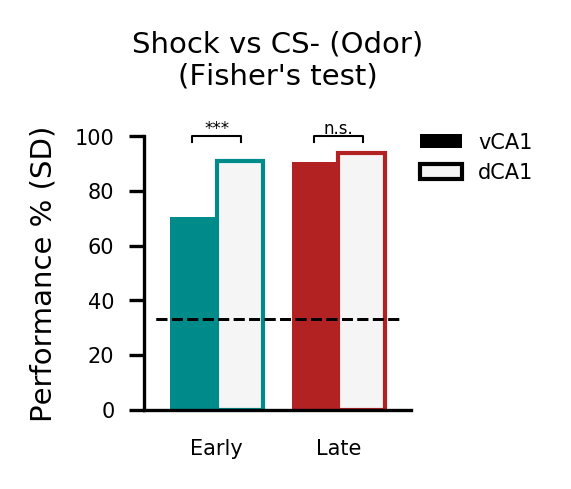

In [624]:
from matplotlib.patches import Patch
labels = session_labels[:-1]
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 15
v={}
d={}
pvs=[]

fig, ax = pl.subplots(1,1,figsize=(1.7,1.9),sharey=True)
for sess,c,i in zip(['pre','post'],dark_co,range(2)):
    ax.bar(i - width/2, (eval("table_CS_Shock_%s_vhpc[0]"%sess)/200.)*100, width, color=c)
    ax.bar(i + width/2,  (eval("table_CS_Shock_%s_dhpc[0]"%sess)/200.)*100, width,color='whitesmoke', edgecolor=c)
    ax.hlines(33.3,-.5,1.5, color='k', lw=.7, linestyles='dashed')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Performance % (SD)')
    #ax.set_title('Decoding During CS')
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
    ax.tick_params(axis='x',bottom=False)
    ax.set_ylim(0,100)
    ax.set_title("Shock vs CS- (Odor)\n(Fisher's test)",y=1.1)

    pvs.append(add_significance_fishers(ax,eval("table_CS_Shock_%s_vhpc"%sess),eval("table_CS_Shock_%s_dhpc"%sess),
        -.2+i,0.2+i,100))
    #pvs.append(sig_vs_chance(ax,eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab),.5,-.2+i,
    #           np.mean(eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab))*100+v[sess],loops=loops,sig_func=None,colors='k'))
    #pvs.append(sig_vs_chance(ax,eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab),.5, .2+i,
    #           np.mean(eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab))*100+d[sess],loops=loops,sig_func=None,colors='k'))
#pl.suptitle('Decoding During Delay',fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../figures/%s_confusion_bars_CS_shOnly.pdf'%NOTEBOOK_NAME)

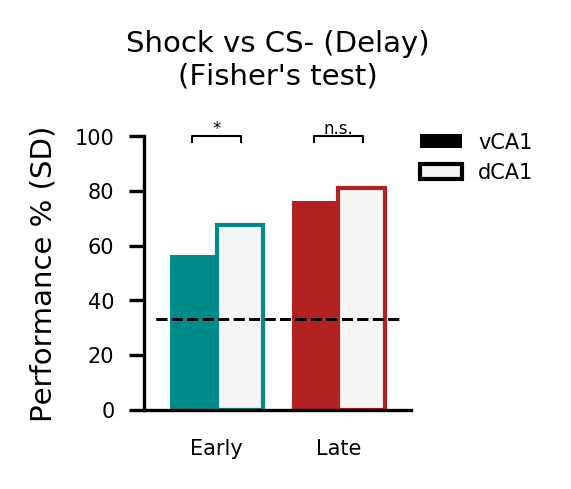

In [625]:
from matplotlib.patches import Patch
labels = session_labels[:-1]
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 15
v={}
d={}
pvs=[]

fig, ax = pl.subplots(1,1,figsize=(1.7,1.9),sharey=True)
for sess,c,i in zip(['pre','post'],dark_co,range(2)):
    ax.bar(i - width/2, (eval("table_tr_Shock_%s_vhpc[0]"%sess)/200.)*100, width, color=c)
    ax.bar(i + width/2,  (eval("table_tr_Shock_%s_dhpc[0]"%sess)/200.)*100, width,color='whitesmoke', edgecolor=c)
    ax.hlines(33.3,-.5,1.5, color='k', lw=.7, linestyles='dashed')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Performance % (SD)')
    #ax.set_title('Decoding During CS')
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
    ax.tick_params(axis='x',bottom=False)
    ax.set_ylim(0,100)
    ax.set_title("Shock vs CS- (Delay)\n(Fisher's test)",y=1.1)

    pvs.append(add_significance_fishers(ax,eval("table_tr_Shock_%s_vhpc"%sess),eval("table_tr_Shock_%s_dhpc"%sess),
        -.2+i,0.2+i,100))
    #pvs.append(sig_vs_chance(ax,eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab),.5,-.2+i,
    #           np.mean(eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab))*100+v[sess],loops=loops,sig_func=None,colors='k'))
    #pvs.append(sig_vs_chance(ax,eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab),.5, .2+i,
    #           np.mean(eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab))*100+d[sess],loops=loops,sig_func=None,colors='k'))
#pl.suptitle('Decoding During Delay',fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../figures/%s_confusion_bars_tr_shOnly.pdf'%NOTEBOOK_NAME)

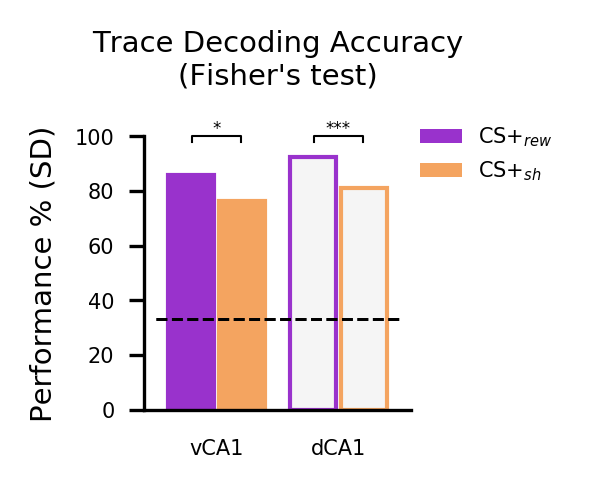

In [882]:
from matplotlib.patches import Patch
labels = ['vCA1','dCA1']
x = np.arange(len(labels))  # the label locations
width = 0.38  # the width of the bars
loops = 15
v={}
d={}
pvs=[]

fig, ax = pl.subplots(1,1,figsize=(1.7,1.9),sharey=True)
for reg,i in zip(['vhpc','dhpc'],range(2)):
    if reg == 'vhpc':
        c=['darkorchid','sandybrown']
    else:
        c=['whitesmoke','whitesmoke']
    ax.bar(i - width/2-.02, (eval("table_tr_Rew_post_%s[0]"%reg)/200.)*100, width, color=c[0], edgecolor='darkorchid')
    ax.bar(i + width/2+.02,  (eval("table_tr_Shock_post_%s[0]"%reg)/200.)*100, width,color=c[1], edgecolor='sandybrown')
    ax.hlines(33.3,-.5,1.5, color='k', lw=.7, linestyles='dashed')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Performance % (SD)')
    #ax.set_title('Decoding During CS')
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend([Patch(facecolor='darkorchid'),Patch(facecolor='sandybrown')],['CS+$_{rew}$','CS+$_{sh}$'],loc=(1,.8),frameon=False)
    ax.tick_params(axis='x',bottom=False)
    ax.set_ylim(0,100)
    ax.set_title("Trace Decoding Accuracy\n(Fisher's test)",y=1.1)

    pvs.append(add_significance_fishers(ax,eval("table_tr_Rew_post_%s"%reg),eval("table_tr_Shock_post_%s"%reg),
        -.2+i,0.2+i,100))
    #pvs.append(sig_vs_chance(ax,eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab),.5,-.2+i,
    #           np.mean(eval("mean_scores_gmin_tb_4_%s_vhpc[sess][:loops]"%lab))*100+v[sess],loops=loops,sig_func=None,colors='k'))
    #pvs.append(sig_vs_chance(ax,eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab),.5, .2+i,
    #           np.mean(eval("mean_scores_gmin_tb_4_%s_dhpc[sess][:loops]"%lab))*100+d[sess],loops=loops,sig_func=None,colors='k'))
#pl.suptitle('Decoding During Delay',fontsize=9.5)
fig.tight_layout(pad=3)

fig.savefig('../figures/%s_confusion_bars_tr_sRewSh.pdf'%NOTEBOOK_NAME)

In [1104]:
#mmc = multiple-comparisons correction (using bonferroni), where mcc = number of comparisons))

from matplotlib.lines import Line2D
def add_significance_fishers_point(ax, array1, array2, x1, y, ticksize=0.02, sig_func=None, thresholds=(0.05, 0.01, 0.001),
                                   mcc=1,color='k',symbol='*'):
    table = array1,array2
    if sig_func is None:
        sig_func = lambda x: sstats.fisher_exact(x, alternative='two-sided')
    p = sig_func(table)[-1]
    sig_value = sig_func(table)[0]
    deltay = np.diff(ax.axis()[-2:])*ticksize
    #line = Line2D([x1, x1, x2, x2], [y-deltay, y, y, y-deltay], lw=.5, color='k', clip_on=False)
    #ax.add_line(line)
    ax.text(x1, y,
            'n.s.' if p > thresholds[0]/mcc else
            symbol if p > thresholds[1]/mcc else
            symbol+symbol if p > thresholds[2]/mcc else
            symbol+symbol+symbol,
            #symbol if p < thresholds[1]/mcc else
            #"",
            ha='center', fontsize=4,color=color)
    return sig_value, p

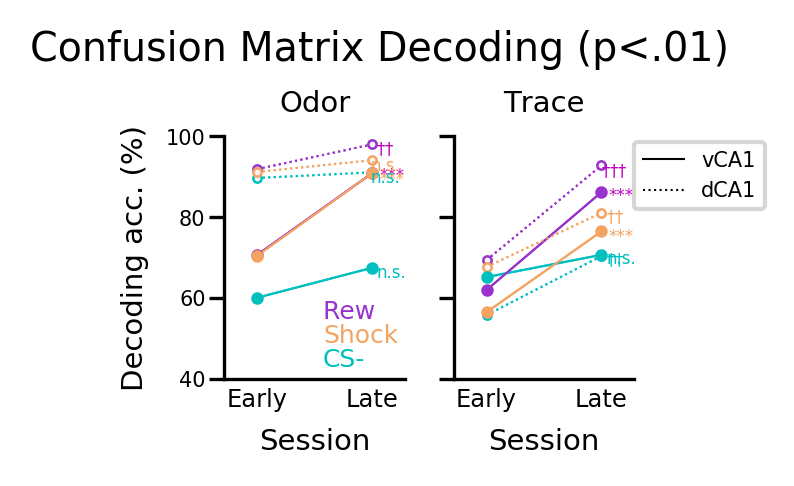

In [1105]:
fig,ax = pl.subplots(1,2,figsize=(2,1.5),sharey=True)
v={}
d={}
loops=10
expectations = 'pre','post'

# Add connecting lines            
for ex,z in zip(expectations,(.4,1.1)):
    for tb,tb_la,x in zip((4,6),('Odor','Trace'),(range(2))):
        ax[x].plot([p for p in (.4,1.1)],[3.*eval("heatmaps_%s_vhpc[tb][0][0]"%ex)/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex))*100 for ex in expectations],color='c')
        ax[x].plot([p for p in (.4,1.1)],[3.*eval("heatmaps_%s_vhpc[tb][1][1]"%ex)/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex))*100 for ex in expectations],color='darkorchid')
        ax[x].plot([p for p in (.4,1.1)],[3.*eval("heatmaps_%s_vhpc[tb][2][2]"%ex)/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex))*100 for ex in expectations],color='sandybrown')            
        ax[x].plot([p for p in (.4,1.1)],[3.*eval("heatmaps_%s_dhpc[tb][0][0]"%ex)/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex))*100 for ex in expectations],color='c',ls='dotted')
        ax[x].plot([p for p in (.4,1.1)],[3.*eval("heatmaps_%s_dhpc[tb][1][1]"%ex)/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex))*100 for ex in expectations],color='darkorchid',ls='dotted')
        ax[x].plot([p for p in (.4,1.1)],[3.*eval("heatmaps_%s_dhpc[tb][2][2]"%ex)/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex))*100 for ex in expectations],color='sandybrown',ls='dotted')            
            
for ex,z in zip(['pre','post'],(.4,1.1)):
    for tb,tb_la,x in zip((4,6),('Odor','Trace'),(range(2))):
            #v[ex] = np.array(np.std(3.*eval("heatmaps_%s_dhpc[tb][0][0]"%ex)/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100/(np.sqrt(loops-1)))
            ax[x].plot(z, np.mean(3.*eval("heatmaps_%s_dhpc[tb][0][0]"%ex)/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100, 'o', color='whitesmoke', mec='c',markersize=2,mew=.6)
            #ax[x].errorbar(z, (np.mean(3.*eval("heatmaps_%s_dhpc[tb][0][0]"%ex)/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100),yerr=v[ex],color='c')  
            #v[ex] = np.array(np.std(3.*eval("heatmaps_%s_dhpc[tb][1][1]"%(ex))/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100/(np.sqrt(loops-1)))
            ax[x].plot(z, np.mean(3.*eval("heatmaps_%s_dhpc[tb][1][1]"%(ex))/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100, 'o',color='whitesmoke', mec='darkorchid',markersize=2,mew=.6)
            #ax[x].errorbar(z, (np.mean(3.*eval("heatmaps_%s_dhpc[tb][1][1]"%(ex))/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100),yerr=v[ex],color='m')
            #v[ex] = np.array(np.std(3.*eval("heatmaps_%s_dhpc[tb][2][2]"%(ex))/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100/(np.sqrt(loops-1)))
            ax[x].plot(z, np.mean(3.*eval("heatmaps_%s_dhpc[tb][2][2]"%(ex))/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100, 'o',color='whitesmoke', mec='sandybrown',markersize=2,mew=.6,label='dCA1')
            #ax[x].errorbar(z, (np.mean(3.*eval("heatmaps_%s_dhpc[tb][2][2]"%(ex))/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100),yerr=v[ex],color='sandybrown')  
            #v[ex] = np.array(np.std(3.*eval("heatmaps_%s_vhpc[tb][0][0]"%ex)/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100/(np.sqrt(loops-1)))
            ax[x].plot(z, np.mean(3.*eval("heatmaps_%s_vhpc[tb][0][0]"%(ex))/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100, 'o', color='c',markersize=2)
            #ax[x].errorbar(z, (np.mean(3.*eval("heatmaps_%s_vhpc[tb][0][0]"%ex)/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100),yerr=v[ex],color='c')  
            #v[ex] = np.array(np.std(3.*eval("heatmaps_%s_vhpc[tb][1][1]"%(ex))/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100/(np.sqrt(loops-1)))
            ax[x].plot(z, np.mean(3.*eval("heatmaps_%s_vhpc[tb][1][1]"%(ex))/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100, 'o', color='darkorchid',markersize=2)
            #ax[x].errorbar(z, (np.mean(3.*eval("heatmaps_%s_vhpc[tb][1][1]"%(ex))/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100),yerr=v[ex],color='m')
            #v[ex] = np.array(np.std(3.*eval("heatmaps_%s_vhpc[tb][2][2]"%(ex))/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100/(np.sqrt(loops-1)))
            ax[x].plot(z, np.mean(3.*eval("heatmaps_%s_vhpc[tb][2][2]"%(ex))/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100, 'o', color='sandybrown',markersize=2,label='vCA1')
            #ax[x].errorbar(z, (np.mean(3.*eval("heatmaps_%s_vhpc[tb][2][2]"%(ex))/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100),yerr=v[ex],color='sandybrown')  

        
            ax[x].tick_params(axis='x',bottom=False,pad=-1.5) # labels along the bottom edge are off
            ax[x].tick_params(axis='y',pad=1) # labels along the bottom edge are off
            ax[0].set_ylabel('Decoding acc. (%)')
            ax[x].set_ylim(40,100)
            ax[x].hlines(33, 0.2,1.3, color='k', lw=.6, linestyles='dashed')
            ax[x].set_title(tb_la,y=1)
            ax[x].set_xlim(0.2,1.3)
            ax[x].set_xticks((.4,1.1))
            ax[x].set_xticklabels(['Early','Late'],fontsize=5.8)
            ax[x].set_xlabel("Session")
            
pvs=[]
for x,t in zip([0,1],['CS','tr']):
    for tr, c,i in zip (['Rew','Shock','CSm'],['m','sandybrown','c'],[.5,0,0]):
        pvs.append(add_significance_fishers_point(ax[x],eval("table_%s_%s_pre_vhpc"%(t,tr)),eval("table_%s_%s_post_vhpc"%(t,tr)),
           1.22,eval("1-(table_%s_%s_post_vhpc[1]*1.0)/200.0"%(t,tr))*100-3+i,color=c))
        pvs.append(add_significance_fishers_point(ax[x],eval("table_%s_%s_pre_dhpc"%(t,tr)),eval("table_%s_%s_post_dhpc"%(t,tr)),
           1.18,eval("1-(table_%s_%s_post_dhpc[1]*1.0)/200.0"%(t,tr))*100-3,color=c,symbol='$\dag$'))
            
from matplotlib.lines import Line2D

legend_elements = [Line2D([0], [0], label='vCA1',color='k'),
                   Line2D([0], [0], ls='dotted', label='dCA1',color='k')]

ax[1].legend(handles=legend_elements,loc=(1,.7))

ax[0].text(.8,55,'Rew',color='darkorchid',fontsize=6.)
ax[0].text(.8,49,'Shock',color='sandybrown',fontsize=6.)
ax[0].text(.8,43,'CS-',color='c',fontsize=6.)

fig.suptitle('Confusion Matrix Decoding (p<.01)',fontsize=9.5,y=1.04)
fig.tight_layout(pad=2)

fig.savefig('../figures/%s_confusion_lines_dv.pdf'%NOTEBOOK_NAME)

CS Rew (0.22832920556296438, 1.6518932485203888e-07) odd's ratio = 0.228329205563 corrected p = 1.65189324852e-07
None
CS Shock (0.24176033530196228, 4.0005079817698618e-07) odd's ratio = 0.241760335302 corrected p = 4.00050798177e-07
None
CS CSm (0.72011251758087202, 0.1434447524933794) odd's ratio = 0.720112517581 corrected p = 0.143444752493
None
tr Rew (0.25953488372093025, 4.4079120226921529e-08) odd's ratio = 0.259534883721 corrected p = 4.40791202269e-08
None
tr Shock (0.3950448396412829, 2.9906140892544784e-05) odd's ratio = 0.395044839641 corrected p = 2.99061408925e-05
None
tr CSm (0.76164045636756095, 0.23579820621914305) odd's ratio = 0.761640456368 corrected p = 0.235798206219
None


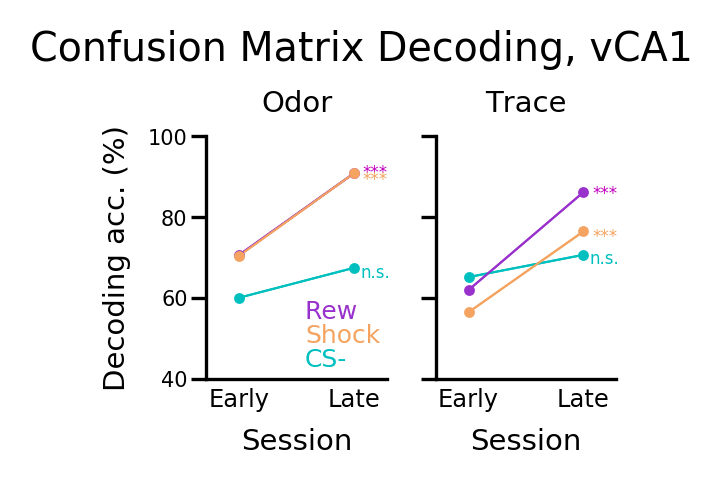

In [1106]:
fig,ax = pl.subplots(1,2,figsize=(2,1.5),sharey=True)
v={}
d={}
loops=10
expectations = 'pre','post'

# Add connecting lines            
for ex,z in zip(expectations,(.4,1.1)):
    for tb,tb_la,x in zip((4,6),('Odor','Trace'),(range(2))):
        ax[x].plot([p for p in (.4,1.1)],[3.*eval("heatmaps_%s_vhpc[tb][0][0]"%ex)/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex))*100 for ex in expectations],color='c')
        ax[x].plot([p for p in (.4,1.1)],[3.*eval("heatmaps_%s_vhpc[tb][1][1]"%ex)/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex))*100 for ex in expectations],color='darkorchid')
        ax[x].plot([p for p in (.4,1.1)],[3.*eval("heatmaps_%s_vhpc[tb][2][2]"%ex)/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex))*100 for ex in expectations],color='sandybrown')            
            
for ex,z in zip(['pre','post'],(.4,1.1)):
    for tb,tb_la,x in zip((4,6),('Odor','Trace'),(range(2))):
            #v[ex] = np.array(np.std(3.*eval("heatmaps_%s_vhpc[tb][0][0]"%ex)/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100/(np.sqrt(loops-1)))
            ax[x].plot(z, np.mean(3.*eval("heatmaps_%s_vhpc[tb][0][0]"%ex)/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100, 'o', color='c',markersize=2,mew=.6)
            #ax[x].errorbar(z, (np.mean(3.*eval("heatmaps_%s_vhpc[tb][0][0]"%ex)/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100),yerr=v[ex],color='c')  
            #v[ex] = np.array(np.std(3.*eval("heatmaps_%s_vhpc[tb][1][1]"%(ex))/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100/(np.sqrt(loops-1)))
            ax[x].plot(z, np.mean(3.*eval("heatmaps_%s_vhpc[tb][1][1]"%(ex))/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100, 'o',color='darkorchid',markersize=2,mew=.6)
            #ax[x].errorbar(z, (np.mean(3.*eval("heatmaps_%s_vhpc[tb][1][1]"%(ex))/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100),yerr=v[ex],color='m')
            #v[ex] = np.array(np.std(3.*eval("heatmaps_%s_vhpc[tb][2][2]"%(ex))/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100/(np.sqrt(loops-1)))
            ax[x].plot(z, np.mean(3.*eval("heatmaps_%s_vhpc[tb][2][2]"%(ex))/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100, 'o',color='sandybrown',markersize=2,mew=.6,label='dCA1')
            #ax[x].errorbar(z, (np.mean(3.*eval("heatmaps_%s_vhpc[tb][2][2]"%(ex))/np.sum(eval("heatmaps_%s_vhpc[tb]"%ex)))*100),yerr=v[ex],color='sandybrown')  

        
            ax[x].tick_params(axis='x',bottom=False,pad=-1.5) # labels along the bottom edge are off
            ax[x].tick_params(axis='y',pad=1) # labels along the bottom edge are off
            ax[0].set_ylabel('Decoding acc. (%)')
            ax[x].set_ylim(40,100)
            ax[x].hlines(33, 0.2,1.3, color='k', lw=.6, linestyles='dashed')
            ax[x].set_title(tb_la,y=1)
            ax[x].set_xlim(0.2,1.3)
            ax[x].set_xticks((.4,1.1))
            ax[x].set_xticklabels(['Early','Late'],fontsize=5.8)
            ax[x].set_xlabel("Session")
            
pvs=[]
for x,t in zip([0,1],['CS','tr']):
    for tr, c,i in zip (['Rew','Shock','CSm'],['m','sandybrown','c'],[1.2,0,0]):
        pvs.append(add_significance_fishers_point(ax[x],eval("table_%s_%s_pre_vhpc"%(t,tr)),eval("table_%s_%s_post_vhpc"%(t,tr)),
           1.23,eval("1-(table_%s_%s_post_vhpc[1]*1.0)/200.0"%(t,tr))*100-3+i,color=c))#,symbol='$\dag$'))
        print t,tr,report_stats(eval("table_%s_%s_pre_vhpc"%(t,tr)),eval("table_%s_%s_post_vhpc"%(t,tr)),sig_func='fishers')    

ax[0].text(.8,55,'Rew',color='darkorchid',fontsize=6.)
ax[0].text(.8,49,'Shock',color='sandybrown',fontsize=6.)
ax[0].text(.8,43,'CS-',color='c',fontsize=6.)

fig.suptitle('Confusion Matrix Decoding, vCA1',fontsize=9.5,y=1.04)
fig.tight_layout(pad=2)

fig.savefig('../figures/%s_confusion_lines_v.pdf'%NOTEBOOK_NAME)

CS Rew (0.17506377551020408, 0.0035828127102992234) odd's ratio = 0.17506377551 corrected p = 0.0035828127103
None
CS Shock (0.62640801001251567, 0.32719638539132734) odd's ratio = 0.626408010013 corrected p = 0.327196385391
None
CS CSm (0.87998843262001158, 0.7303617439428447) odd's ratio = 0.87998843262 corrected p = 0.730361743943
None
tr Rew (0.17405405405405405, 1.2883770389300718e-09) odd's ratio = 0.174054054054 corrected p = 1.28837703893e-09
None
tr Shock (0.48177083333333331, 0.0026426806722465107) odd's ratio = 0.481770833333 corrected p = 0.00264268067225
None
tr CSm (0.52256493506493507, 0.0025030810922922744) odd's ratio = 0.522564935065 corrected p = 0.00250308109229
None


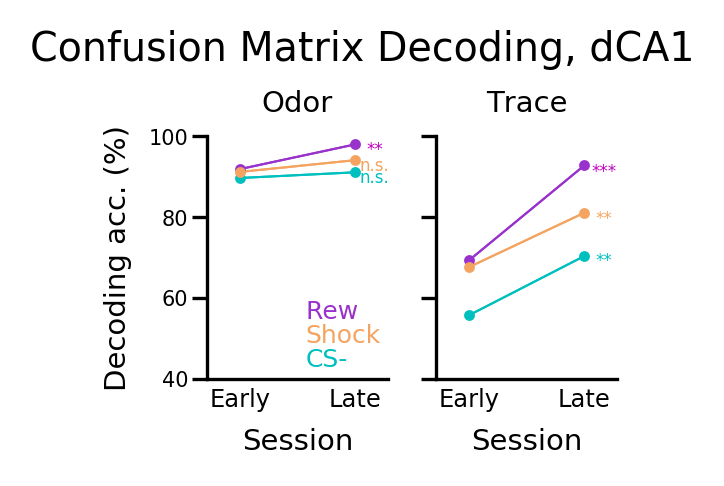

In [1108]:
fig,ax = pl.subplots(1,2,figsize=(2,1.5),sharey=True)
v={}
d={}
loops=10
expectations = 'pre','post'

# Add connecting lines            
for ex,z in zip(expectations,(.4,1.1)):
    for tb,tb_la,x in zip((4,6),('Odor','Trace'),(range(2))):
        ax[x].plot([p for p in (.4,1.1)],[3.*eval("heatmaps_%s_dhpc[tb][0][0]"%ex)/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex))*100 for ex in expectations],color='c')
        ax[x].plot([p for p in (.4,1.1)],[3.*eval("heatmaps_%s_dhpc[tb][1][1]"%ex)/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex))*100 for ex in expectations],color='darkorchid')
        ax[x].plot([p for p in (.4,1.1)],[3.*eval("heatmaps_%s_dhpc[tb][2][2]"%ex)/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex))*100 for ex in expectations],color='sandybrown')            
            
for ex,z in zip(['pre','post'],(.4,1.1)):
    for tb,tb_la,x in zip((4,6),('Odor','Trace'),(range(2))):
            #v[ex] = np.array(np.std(3.*eval("heatmaps_%s_dhpc[tb][0][0]"%ex)/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100/(np.sqrt(loops-1)))
            ax[x].plot(z, np.mean(3.*eval("heatmaps_%s_dhpc[tb][0][0]"%ex)/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100, 'o', color='c',markersize=2,mew=.6)
            #ax[x].errorbar(z, (np.mean(3.*eval("heatmaps_%s_dhpc[tb][0][0]"%ex)/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100),yerr=v[ex],color='c')  
            #v[ex] = np.array(np.std(3.*eval("heatmaps_%s_dhpc[tb][1][1]"%(ex))/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100/(np.sqrt(loops-1)))
            ax[x].plot(z, np.mean(3.*eval("heatmaps_%s_dhpc[tb][1][1]"%(ex))/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100, 'o',color='darkorchid',markersize=2,mew=.6)
            #ax[x].errorbar(z, (np.mean(3.*eval("heatmaps_%s_dhpc[tb][1][1]"%(ex))/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100),yerr=v[ex],color='m')
            #v[ex] = np.array(np.std(3.*eval("heatmaps_%s_dhpc[tb][2][2]"%(ex))/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100/(np.sqrt(loops-1)))
            ax[x].plot(z, np.mean(3.*eval("heatmaps_%s_dhpc[tb][2][2]"%(ex))/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100, 'o',color='sandybrown',markersize=2,mew=.6,label='dCA1')
            #ax[x].errorbar(z, (np.mean(3.*eval("heatmaps_%s_dhpc[tb][2][2]"%(ex))/np.sum(eval("heatmaps_%s_dhpc[tb]"%ex)))*100),yerr=v[ex],color='sandybrown')  

        
            ax[x].tick_params(axis='x',bottom=False,pad=-1.5) # labels along the bottom edge are off
            ax[x].tick_params(axis='y',pad=1) # labels along the bottom edge are off
            ax[0].set_ylabel('Decoding acc. (%)')
            ax[x].set_ylim(40,100)
            ax[x].hlines(33, 0.2,1.3, color='k', lw=.6, linestyles='dashed')
            ax[x].set_title(tb_la,y=1)
            ax[x].set_xlim(0.2,1.3)
            ax[x].set_xticks((.4,1.1))
            ax[x].set_xticklabels(['Early','Late'],fontsize=5.8)
            ax[x].set_xlabel("Session")
            
pvs=[]
for x,t in zip([0,1],['CS','tr']):
    for tr, c,i in zip (['Rew','Shock','CSm'],['m','sandybrown','c'],[.5,0,0]):
        pvs.append(add_significance_fishers_point(ax[x],eval("table_%s_%s_pre_dhpc"%(t,tr)),eval("table_%s_%s_post_dhpc"%(t,tr)),
           1.22,eval("1-(table_%s_%s_post_dhpc[1]*1.0)/200.0"%(t,tr))*100-3,color=c))#,symbol='$\dag$'))
        print t,tr,report_stats(eval("table_%s_%s_pre_dhpc"%(t,tr)),eval("table_%s_%s_post_dhpc"%(t,tr)),sig_func='fishers')    
    
ax[0].text(.8,55,'Rew',color='darkorchid',fontsize=6.)
ax[0].text(.8,49,'Shock',color='sandybrown',fontsize=6.)
ax[0].text(.8,43,'CS-',color='c',fontsize=6.)

fig.suptitle('Confusion Matrix Decoding, dCA1',fontsize=9.5,y=1.04)
fig.tight_layout(pad=2)

fig.savefig('../figures/%s_confusion_lines_d.pdf'%NOTEBOOK_NAME)

# across-session

In [ ]:
for c,label,col in zip(range(3),non_catch_labels,('darkorchid','tab:blue','tab:red')):
        ax[c].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_across_tb_%s_%s['postVSpost_rev']"%

In [104]:
v_name=[]
for t in range(13):
    for label in non_catch_labels:
        for r in 'dhpc','vhpc':
            #exec("scores_across_tb_%s_%s_%s = {}"%(t,label,r))
            for sess in sessions:
                exec("v_name = 'scores_across_tb_%s_%s'"%(t,label))
                exec("path='../notebooks/autorestore/decoding_around_onset_combined_1sec_%s/'"%(r))
                #exec("scores_tb_%s_outcome_%s_%s_t = {}"%(t,label,r))
                exec("scores_across_tb_%s_%s_%s = ut.load_variable(v_name,path)"%(t,label,r))

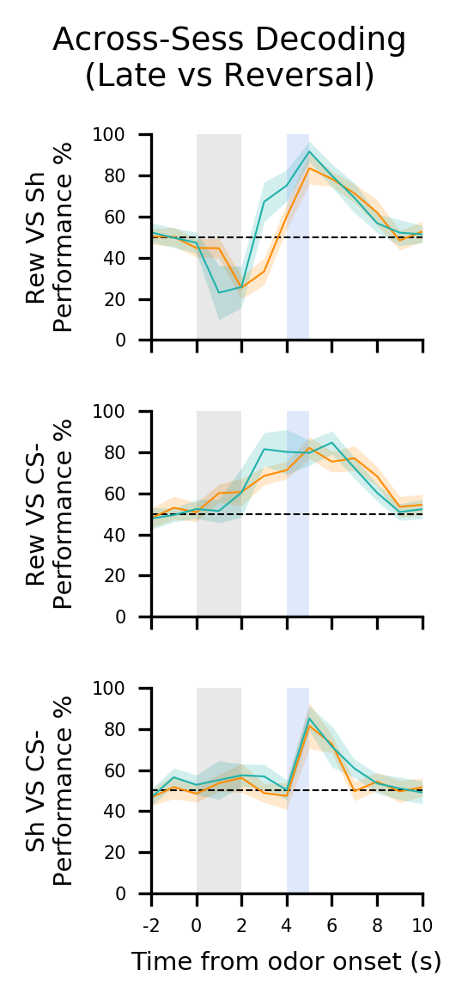

In [564]:
fig, ax = pl.subplots(3,1, figsize=(2,3.7), sharex=True, sharey=True)

for c,label,col in zip(range(3),non_catch_labels,('darkorchid','tab:blue','tab:red')):
        ax[c].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_across_tb_%s_%s_vhpc['postVSpost_rev']"%(t,label)))*100) for t in range(13)],
                   color='darkorange', ls='-',lw=.5 ,ms=1)
        m = np.array([(np.mean(eval("scores_across_tb_%s_%s_vhpc['postVSpost_rev']"%(t,label)))*100) for t in range(13)])
        s = np.array([np.std(eval("scores_across_tb_%s_%s_vhpc['postVSpost_rev']"%(t,label)))*100 for t in range(13)])
        ax[c].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color='darkorange',linewidth=0)
        ax[c].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_across_tb_%s_%s_dhpc['postVSpost_rev']"%(t,label)))*100) for t in range(13)],
                   color='lightseagreen', ls='-',lw=.5 ,ms=1)
        m = np.array([(np.mean(eval("scores_across_tb_%s_%s_dhpc['postVSpost_rev']"%(t,label)))*100) for t in range(13)])
        s = np.array([np.std(eval("scores_across_tb_%s_%s_dhpc['postVSpost_rev']"%(t,label)))*100 for t in range(13)])
        ax[c].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color='lightseagreen',linewidth=0)

for lab, c in zip(['Rew VS Sh','Rew VS CS-','Sh VS CS-'],range(3)):
        ax[c].set_ylim(0, 100)
        ax[c].set_xlim(-2, 10)
        ax[c].set_xticks(np.arange(-2,11, 2))
        ax[c].set_xticklabels(np.arange(-2,11, 2))
        ax[c].hlines(50, -2,10, color='k', lw=.5, linestyles='dashed')
        ax[2].set_xlabel('Time from odor onset (s)')
        ax[c].set_ylabel(lab+'\nPerformance %')
        pt.plot_period_bar(ax[c], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.09)
        pt.plot_period_bar(ax[c], 0, start_end=(4, 5), color='cornflowerblue', delta_y=100, alpha=.2)
        #ax[c][r].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')

pl.suptitle('Across-Sess Decoding\n(Late vs Reversal)',fontsize=9,y=1.05)
fig.tight_layout(pad=3)


fig.savefig('../figures/%s_Xsess_LateVSRev_dv.pdf'%NOTEBOOK_NAME)

U = 41.0 p = 0.520522883276 r = -0.152127765851


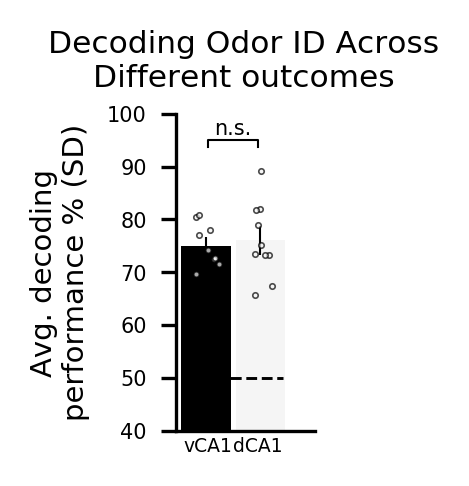

In [58]:
x = np.arange(len(labels))  # the label locations
width = 0.6  # the width of the bars
loops=10
#v={}
fig, ax = pl.subplots(figsize=(.6,1.4))
ax.bar(-.03 -width/2, 50+np.mean(scores_across_tb_4_rwVSsh_vhpc['postVSpost_rev'][:loops])*100, width,color='k',
       label='vCA1',yerr=np.array((np.std(scores_across_tb_4_rwVSsh_vhpc['postVSpost_rev'][:loops])/(np.sqrt(loops)))*100))
ax.scatter(-.03 -width/2+np.random.random(loops)*width/2-width/4.5,50+np.mean(scores_across_tb_4_rwVSsh_vhpc['postVSpost_rev'],1)[:loops]*100,
               color='whitesmoke',s=1.7,zorder=2,alpha=.7,linewidths=.4,edgecolor='k')
ax.bar(+.03+width/2, 50+np.mean(scores_across_tb_4_rwVSsh_dhpc['postVSpost_rev'][:loops])*100, width,color='whitesmoke',
       label='dCA1',yerr=np.array((np.std(scores_across_tb_4_rwVSsh_dhpc['postVSpost_rev'][:loops])/(np.sqrt(loops)))*100))
ax.scatter(.03+width/2+np.random.random(loops)*width/2-width/4.5,50+np.mean(scores_across_tb_4_rwVSsh_dhpc['postVSpost_rev'],1)[:loops]*100,
               color='whitesmoke',s=1.7,zorder=2,alpha=.7,linewidths=.4,edgecolor='k')
ax.hlines(50,-.6,.6, color='k', lw=.7, linestyles='dashed')
ax.set_ylabel('Avg. decoding\nperformance % (SD)')
ax.set_xticks(x)
ax.set_xticklabels('',fontsize=7)
ax.tick_params(axis='x',bottom=False)
ax.set_ylim(40,100)
ax.text(-width/2,36,'vCA1',ha='center',fontsize=4.5)
ax.text(width/2,36,'dCA1',ha='center',fontsize=4.5)

pvs=[]
pvs.append(add_significance(ax, np.mean(scores_across_tb_4_rwVSsh_vhpc['postVSpost_rev'],1)[:loops],
                                np.mean(scores_across_tb_4_rwVSsh_dhpc['postVSpost_rev'],1)[:loops],-.3,.3,95,mcc=1))
report_stats(np.mean(scores_across_tb_4_rwVSsh_vhpc['postVSpost_rev'],1)[:loops],
             np.mean(scores_across_tb_4_rwVSsh_dhpc['postVSpost_rev'],1)[:loops])

pl.suptitle('Decoding Odor ID Across\nDifferent outcomes',y=1.08,fontsize=7.5)

fig.savefig('../figures/%s_bars_Xsess_odor.pdf'%NOTEBOOK_NAME)

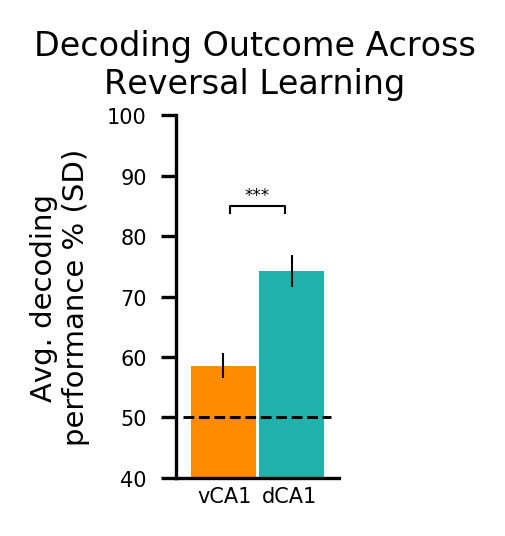

In [593]:
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
loops=10
#v={}
fig, ax = pl.subplots(figsize=(.7,1.6))
ax.bar(-.01 -width/2, np.mean(scores_across_tb_6_rwVSsh_vhpc['postVSpost_rev'][:loops])*100, width,color='darkorange',
       label='vCA1',yerr=np.array((np.std(scores_across_tb_6_rwVSsh_vhpc['postVSpost_rev'][:loops])/(np.sqrt(loops-1)))*100))
ax.bar(+.01+width/2, np.mean(scores_across_tb_6_rwVSsh_dhpc['postVSpost_rev'][:loops])*100, width,color='lightseagreen',
       label='dCA1',yerr=np.array((np.std(scores_across_tb_6_rwVSsh_dhpc['postVSpost_rev'][:loops])/(np.sqrt(loops-1)))*100))
ax.hlines(50,-.4,.4, color='k', lw=.7, linestyles='dashed')
ax.set_ylabel('Avg. decoding\nperformance % (SD)')
ax.set_xticks(x)
ax.set_xticklabels('',fontsize=7)
ax.tick_params(axis='x',bottom=False)
ax.set_ylim(40,100)
ax.text(-width/2,36,'vCA1',ha='center')
ax.text(width/2,36,'dCA1',ha='center')

pvs=[]
pvs.append(add_significance(ax, np.mean(scores_across_tb_6_rwVSsh_vhpc['postVSpost_rev'],1)[:loops],
                                np.mean(scores_across_tb_6_rwVSsh_dhpc['postVSpost_rev'],1)[:loops],-.15,.15,85,mcc=1))

pl.suptitle('Decoding Outcome Across\nReversal Learning',y=1.06,fontsize=8)

fig.savefig('../figures/%s_bars_Xsess_tr.pdf'%NOTEBOOK_NAME)

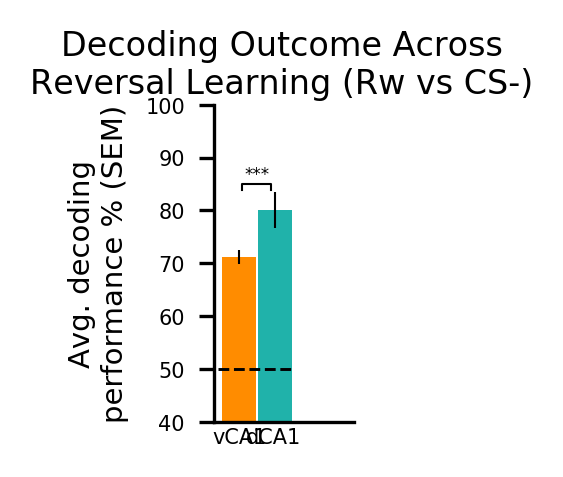

In [1073]:
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
loops=10
#v={}
fig, ax = pl.subplots(figsize=(.6,1.4))
ax.bar(-.01 -width/2, np.mean(scores_across_tb_6_rwVScsm_vhpc['postVSpost_rev'][:loops])*100, width,color='darkorange',
       label='vCA1',yerr=np.array((np.std(scores_across_tb_6_rwVScsm_vhpc['postVSpost_rev'][:loops])/(np.sqrt(loops)))*100))
ax.bar(+.01+width/2, np.mean(scores_across_tb_6_rwVScsm_dhpc['postVSpost_rev'][:loops])*100, width,color='lightseagreen',
       label='dCA1',yerr=np.array((np.std(scores_across_tb_6_rwVScsm_dhpc['postVSpost_rev'][:loops])/(np.sqrt(loops)))*100))
ax.hlines(50,-.4,.4, color='k', lw=.7, linestyles='dashed')
ax.set_ylabel('Avg. decoding\nperformance % (SEM)')
ax.set_xticks(x)
ax.set_xticklabels('',fontsize=7)
ax.tick_params(axis='x',bottom=False)
ax.set_ylim(40,100)
ax.text(-width/2,36,'vCA1',ha='center')
ax.text(width/2,36,'dCA1',ha='center')

pvs=[]
pvs.append(add_significance(ax, np.mean(scores_across_tb_6_rwVScsm_vhpc['postVSpost_rev'],1)[:loops],
                                np.mean(scores_across_tb_6_rwVScsm_dhpc['postVSpost_rev'],1)[:loops],-.15,.15,85,mcc=1))

pl.suptitle('Decoding Outcome Across\nReversal Learning (Rw vs CS-)',y=1.06,fontsize=8)

#fig.savefig('../figures/%s_bars_Xsess_tr.pdf'%NOTEBOOK_NAME)

In [22]:
np.mean(scores_across_tb_6_shVScsm_vhpc['postVSpost_rev'],1)

array([ 0.5325,  0.4725,  0.5275,  0.41  ,  0.47  ,  0.4075,  0.5525,
        0.4775,  0.515 ,  0.4825,  0.435 ,  0.45  ,  0.45  ,  0.5125,
        0.415 ])

U = 100.0 p = 0.000181651146091 r = 0.845154254729


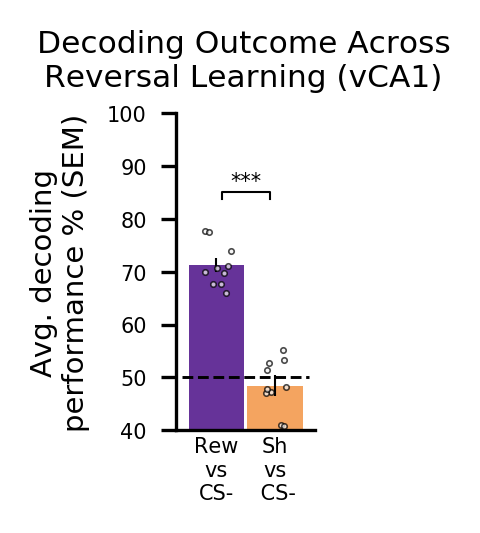

In [23]:
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
loops=10
#v={}
fig, ax = pl.subplots(figsize=(.6,1.4))
ax.bar(-.01 -width/2, np.mean(scores_across_tb_6_rwVScsm_vhpc['postVSpost_rev'][:loops])*100, width,color='rebeccapurple',
       label='vCA1',yerr=np.array((np.std(scores_across_tb_6_rwVScsm_vhpc['postVSpost_rev'][:loops])/(np.sqrt(loops)))*100))
ax.scatter(-.01 -width/2+np.random.random(loops)*width/2-width/4.5,np.mean(scores_across_tb_6_rwVScsm_vhpc['postVSpost_rev'],1)[:loops]*100,
               color='whitesmoke',s=1.7,zorder=2,alpha=.7,linewidths=.4,edgecolor='k')
ax.bar(+.01+width/2, np.mean(scores_across_tb_6_shVScsm_vhpc['postVSpost_rev'][:loops])*100, width,color='sandybrown',
       label='dCA1',yerr=np.array((np.std(scores_across_tb_6_shVScsm_vhpc['postVSpost_rev'][:loops])/(np.sqrt(loops)))*100))
ax.scatter(+.01+width/2+np.random.random(loops)*width/2-width/4.5,np.mean(scores_across_tb_6_shVScsm_vhpc['postVSpost_rev'],1)[:loops]*100,
               color='whitesmoke',s=1.7,zorder=2,alpha=.7,linewidths=.4,edgecolor='k')
ax.hlines(50,-.4,.4, color='k', lw=.7, linestyles='dashed')
ax.set_ylabel('Avg. decoding\nperformance % (SEM)')
#ax.set_xticks(x)
ax.set_xticklabels('',fontsize=7)
ax.tick_params(axis='x',bottom=False)
ax.set_ylim(40,100)
ax.text(-width/2-.01,27,'Rew\nvs\nCS-',ha='center')
ax.text(width/2+.01,27,'Sh\nvs\n CS-',ha='center')

pvs=[]
pvs.append(add_significance(ax, np.mean(scores_across_tb_6_rwVScsm_vhpc['postVSpost_rev'],1)[:loops],
                                np.mean(scores_across_tb_6_shVScsm_vhpc['postVSpost_rev'],1)[:loops],-.15,.15,85,mcc=1))
report_stats(np.mean(scores_across_tb_6_rwVScsm_vhpc['postVSpost_rev'],1)[:loops],
             np.mean(scores_across_tb_6_shVScsm_vhpc['postVSpost_rev'],1)[:loops])
pl.suptitle('Decoding Outcome Across\nReversal Learning (vCA1)',y=1.08,fontsize=7.5)

fig.savefig('../figures/%s_bars_Xsess_tr_vhpc.pdf'%NOTEBOOK_NAME)

U = 100.0 p = 0.000180634720808 r = 0.845154254729


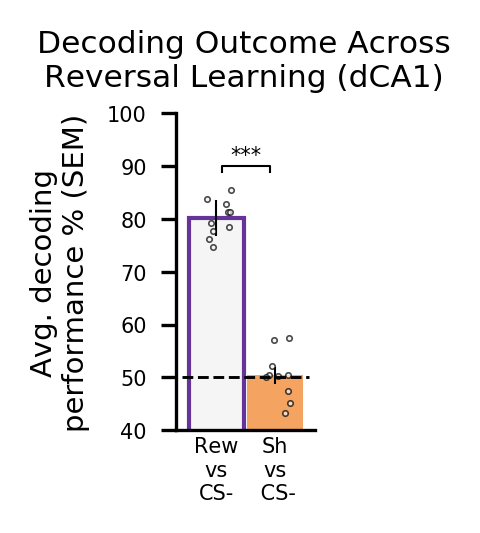

In [46]:
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
loops=10
#v={}
fig, ax = pl.subplots(figsize=(.6,1.4))
ax.bar(-.01 -width/2, np.mean(scores_across_tb_6_rwVScsm_dhpc['postVSpost_rev'][:loops])*100, width,color='whitesmoke',edgecolor='rebeccapurple',
       label='vCA1',yerr=np.array((np.std(scores_across_tb_6_rwVScsm_dhpc['postVSpost_rev'][:loops])/(np.sqrt(loops)))*100))
ax.scatter(-.01 -width/2+np.random.random(loops)*width/2-width/4.5,np.mean(scores_across_tb_6_rwVScsm_dhpc['postVSpost_rev'],1)[:loops]*100,
               color='whitesmoke',s=1.7,zorder=2,alpha=.7,linewidths=.4,edgecolor='k')
ax.bar(+.01+width/2, np.mean(scores_across_tb_6_shVScsm_dhpc['postVSpost_rev'][:loops])*100, width,color='sandybrown',
       label='dCA1',yerr=np.array((np.std(scores_across_tb_6_shVScsm_dhpc['postVSpost_rev'][:loops])/(np.sqrt(loops)))*100))
ax.scatter(+.01+width/2+np.random.random(loops)*width/2-width/4.5,np.mean(scores_across_tb_6_shVScsm_dhpc['postVSpost_rev'],1)[:loops]*100,
               color='whitesmoke',s=1.7,zorder=2,alpha=.7,linewidths=.4,edgecolor='k')
ax.hlines(50,-.4,.4, color='k', lw=.7, linestyles='dashed')
ax.set_ylabel('Avg. decoding\nperformance % (SEM)')
#ax.set_xticks(0)
ax.set_xticklabels('',fontsize=7)
ax.tick_params(axis='x',bottom=False)
ax.set_ylim(40,100)
ax.text(-width/2-.01,27,'Rew\nvs\nCS-',ha='center')
ax.text(width/2+.01,27,'Sh\nvs\n CS-',ha='center')

pvs=[]
pvs.append(add_significance(ax, np.mean(scores_across_tb_6_rwVScsm_dhpc['postVSpost_rev'],1)[:loops],
                                np.mean(scores_across_tb_6_shVScsm_dhpc['postVSpost_rev'],1)[:loops],-.15,.15,90,mcc=1))
report_stats(np.mean(scores_across_tb_6_rwVScsm_dhpc['postVSpost_rev'],1)[:loops],
             np.mean(scores_across_tb_6_shVScsm_dhpc['postVSpost_rev'],1)[:loops])
pl.suptitle('Decoding Outcome Across\nReversal Learning (dCA1)',y=1.08,fontsize=7.5)

fig.savefig('../figures/%s_bars_Xsess_tr_dhpc.pdf'%NOTEBOOK_NAME)

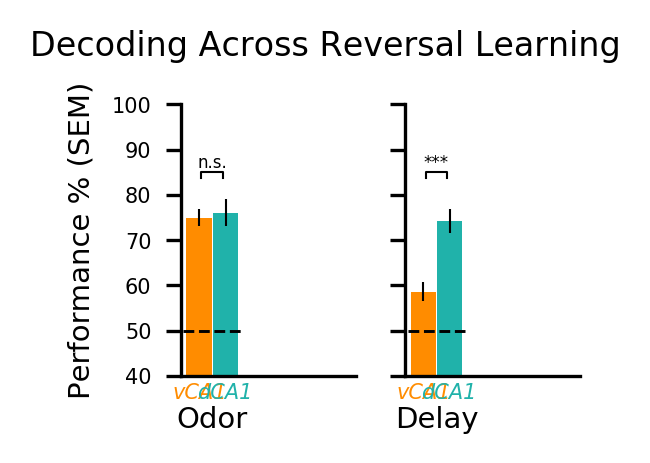

In [726]:
x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars
loops=10
pvs=[]
    
fig, ax = pl.subplots(1,2,figsize=(2,1.4),sharey=True)
for tb,i,add,period in zip([4,6],range(2),[50,0],[['Odor'],['Delay']]):
    ax[i].bar(-.01 -width/2, add+np.mean(eval("scores_across_tb_%s_rwVSsh_vhpc['postVSpost_rev'][:loops]"%tb))*100, width,color='darkorange',
       label='vCA1',yerr=np.array((np.std(eval("scores_across_tb_%s_rwVSsh_vhpc['postVSpost_rev'][:loops]"%tb))/(np.sqrt(loops-1)))*100))
    ax[i].bar(+.01+width/2, add+np.mean(eval("scores_across_tb_%s_rwVSsh_dhpc['postVSpost_rev'][:loops]"%tb))*100, width,color='lightseagreen',
       label='dCA1',yerr=np.array((np.std(eval("scores_across_tb_%s_rwVSsh_dhpc['postVSpost_rev'][:loops]"%tb))/(np.sqrt(loops-1)))*100))
    ax[i].hlines(50,-.4,.4, color='k', lw=.7, linestyles='dashed')
    ax[0].set_ylabel('Performance % (SEM)')
    ax[i].set_xticks(x)
    ax[i].set_xticklabels(period,fontsize=7)
    ax[i].tick_params(axis='x',bottom=False)
    ax[i].set_ylim(40,100)
    ax[i].text(-width/2,35,'vCA1',ha='center',fontstyle='italic',color='darkorange')
    ax[i].text(width/2,35,'dCA1',ha='center',fontstyle='italic',color='lightseagreen')
    
    pvs.append(add_significance(ax[i], np.mean(eval("scores_across_tb_%s_rwVSsh_vhpc['postVSpost_rev']"%tb),1)[:loops],
                                    np.mean(eval("scores_across_tb_%s_rwVSsh_dhpc['postVSpost_rev']"%tb),1)[:loops],-.15,.15,85,mcc=1))

pl.suptitle('Decoding Across Reversal Learning',y=1.06,fontsize=8)
fig.tight_layout(pad=2)

fig.savefig('../figures/%s_bars_Xsess.pdf'%NOTEBOOK_NAME)

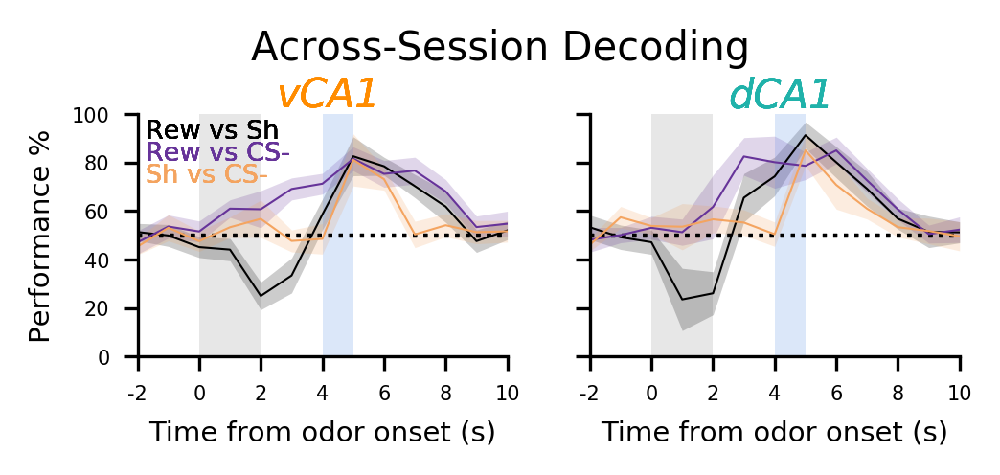

In [908]:
from matplotlib import cm
fig, ax = pl.subplots(1,2, figsize=(3.7, 1.6),sharey=True)
loops=10
sess='post_rev'

for label,c,linsty,compla in zip(non_catch_labels,['black','rebeccapurple','sandybrown'],linesty,comp_labels):
        for l,reg in zip(range(2),['vhpc','dhpc']):
            ax[l].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_across_tb_%s_%s_%s['postVSpost_rev'][:loops]"%(t,label,reg)))*100) for t in range(13)],
                    color=c,linestyle=linsty,label=compla)
            m = np.array([(np.mean(eval("scores_across_tb_%s_%s_%s['postVSpost_rev'][:loops]"%(t,label,reg)))*100) for t in range(13)])
            s = np.array([np.std(eval("scores_across_tb_%s_%s_%s['postVSpost_rev'][:loops]"%(t,label,reg)))*100 for t in range(13)])
            ax[l].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=c,linewidth=0)
            ax[l].set_ylim(0, 100)
            ax[l].set_xlim(-2, 10)
            ax[l].set_xticks(np.arange(-2,11, 2))
            ax[l].set_xticklabels(np.arange(-2,11, 2))
            ax[l].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
            ax[l].set_xlabel('Time from odor onset (s)')
            ax[0].set_ylabel('Performance %')
            pt.plot_period_bar(ax[l], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.03)
            pt.plot_period_bar(ax[l], 0, start_end=(4, 5), color='cornflowerblue', delta_y=100, alpha=.08)
            fig.tight_layout(pad=2)
            #ax[l].set_title('Reversal',color=dark_co[-1])
            ax[0].text(2.5,103,'vCA1',color='darkorange',fontsize=10,fontstyle='italic')
            ax[1].text(2.5,103,'dCA1',color='lightseagreen',fontsize=10,fontstyle='italic')
            ax[0].text(-1.75,90,'Rew vs Sh',color='k',fontsize=6.5)
            ax[0].text(-1.75,81,'Rew vs CS-',color='rebeccapurple',fontsize=6.5)
            ax[0].text(-1.75,72,'Sh vs CS-',color='sandybrown',fontsize=6.5)

pl.suptitle('Across-Session Decoding',fontsize=10, y=1.04)
fig.tight_layout(pad=3)

fig.savefig('../figures/%s_gmin_ALLcomp_Xsess_PoRev.pdf'%NOTEBOOK_NAME)

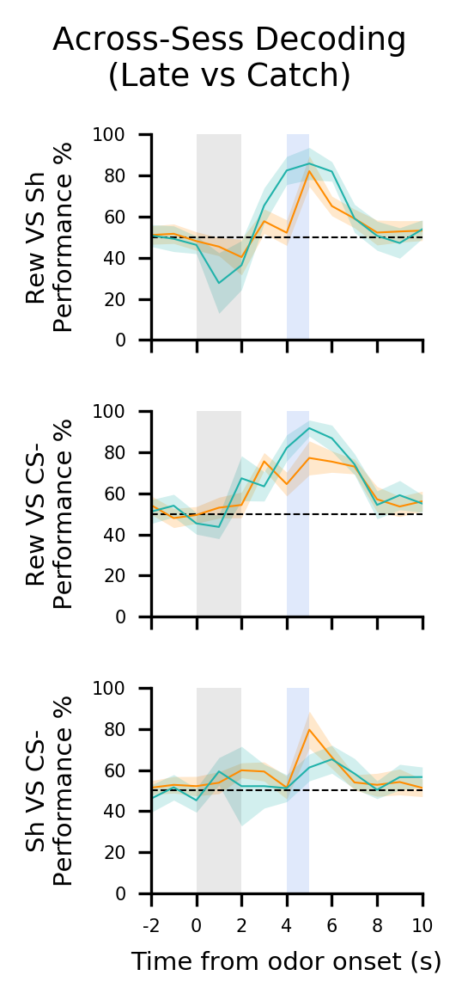

In [569]:
fig, ax = pl.subplots(3,1, figsize=(2,3.7), sharex=True, sharey=True)

for c,label,col in zip(range(3),non_catch_labels,('darkorchid','tab:blue','tab:red')):
        ax[c].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_across_tb_%s_%s_vhpc['postVScatch']"%(t,label)))*100) for t in range(13)],
                   color='darkorange', ls='-',lw=.5 ,ms=1)
        m = np.array([(np.mean(eval("scores_across_tb_%s_%s_vhpc['postVScatch']"%(t,label)))*100) for t in range(13)])
        s = np.array([np.std(eval("scores_across_tb_%s_%s_vhpc['postVScatch']"%(t,label)))*100 for t in range(13)])
        ax[c].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color='darkorange',linewidth=0)
        ax[c].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_across_tb_%s_%s_dhpc['postVScatch']"%(t,label)))*100) for t in range(13)],
                   color='lightseagreen', ls='-',lw=.5 ,ms=1)
        m = np.array([(np.mean(eval("scores_across_tb_%s_%s_dhpc['postVScatch']"%(t,label)))*100) for t in range(13)])
        s = np.array([np.std(eval("scores_across_tb_%s_%s_dhpc['postVScatch']"%(t,label)))*100 for t in range(13)])
        ax[c].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color='lightseagreen',linewidth=0)

for lab, c in zip(['Rew VS Sh','Rew VS CS-','Sh VS CS-'],range(3)):
        ax[c].set_ylim(0, 100)
        ax[c].set_xlim(-2, 10)
        ax[c].set_xticks(np.arange(-2,11, 2))
        ax[c].set_xticklabels(np.arange(-2,11, 2))
        ax[c].hlines(50, -2,10, color='k', lw=.5, linestyles='dashed')
        ax[2].set_xlabel('Time from odor onset (s)')
        ax[c].set_ylabel(lab+'\nPerformance %')
        pt.plot_period_bar(ax[c], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.09)
        pt.plot_period_bar(ax[c], 0, start_end=(4, 5), color='cornflowerblue', delta_y=100, alpha=.2)
        #ax[c][r].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')

pl.suptitle('Across-Sess Decoding\n(Late vs Catch)',fontsize=9,y=1.05)
fig.tight_layout(pad=3)


fig.savefig('../figures/%s_Xsess_LateVSCatch_dv.pdf'%NOTEBOOK_NAME)

In [ ]:
scores_across_tb_4_rewVSsh_vhpc['postVScatch']

## outcome decoding

In [32]:
tt_pairs = ['trRwCSm_tsShCSm','trShCSm_tsRwCSm']

In [33]:
v_name=[]
for t in range(13):
    for label in tt_pairs:
        for r in 'dhpc','vhpc':
            exec("scores_tb_%s_outcome_%s_%s = {}"%(t,label,r))
            for sess in sessions:
                exec("v_name = 'scores_tb_%s_outcome_%s'"%(t,label))
                exec("path='../notebooks/autorestore/decoding_around_onset_combined_1sec_%s/'"%(r))
                #exec("scores_tb_%s_outcome_%s_%s_t = {}"%(t,label,r))
                exec("scores_tb_%s_outcome_%s_%s_t = ut.load_variable(v_name,path)"%(t,label,r))
                exec("scores_tb_%s_outcome_%s_%s_t = scores_tb_%s_outcome_%s_%s_t['%s']"%(t,label,r,t,label,r,sess))
                exec("scores_tb_%s_outcome_%s_%s['%s'] = scores_tb_%s_outcome_%s_%s_t"%(t,label,r,sess,t,label,r))

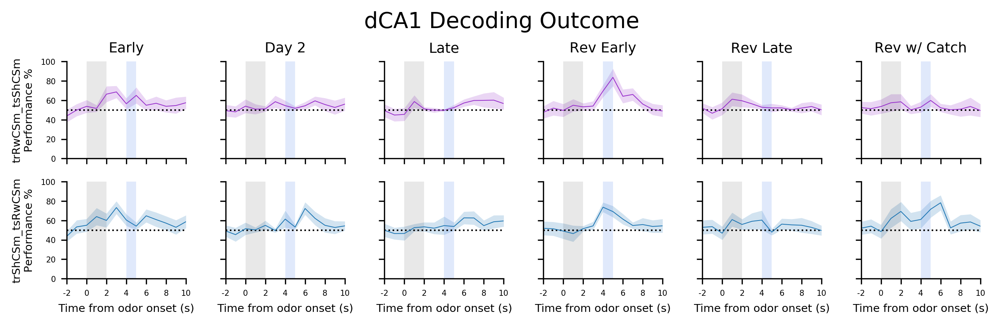

In [34]:
fig, ax = pl.subplots(2,6, figsize=(9, 2.7), sharex=True, sharey=True)

for r,sess in zip(range(6),sessions):
    for c,label,col in zip(range(2),['trRwCSm_tsShCSm','trShCSm_tsRwCSm'],('darkorchid','tab:blue','tab:red')):
        ax[c][r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_tb_%s_outcome_%s_dhpc[sess][:,0]"%(t,label)))*100) for t in range(13)], color=col, ls='-',lw=.5 ,ms=1)
        m = np.array([(np.mean(eval("scores_tb_%s_outcome_%s_dhpc[sess][:,0]"%(t,label)))*100) for t in range(13)])
        s = np.array([np.std(eval("scores_tb_%s_outcome_%s_dhpc[sess][:,0]"%(t,label)))*100 for t in range(13)])
        ax[c][r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=col,linewidth=0)

for r in range(6):       
    for lab, c in zip(['trRwCSm_tsShCSm','trShCSm_tsRwCSm'],range(2)):
        ax[c][r].set_ylim(0, 100)
        ax[c][r].set_xlim(-2, 10)
        ax[c][r].set_xticks(np.arange(-2,11, 2))
        ax[c][r].set_xticklabels(np.arange(-2,11, 2))
        ax[c][r].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
        ax[1][r].set_xlabel('Time from odor onset (s)')
        ax[c][0].set_ylabel(lab+'\nPerformance %')
        pt.plot_period_bar(ax[c][r], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.09)
        pt.plot_period_bar(ax[c][r], 0, start_end=(4, 5), color='cornflowerblue', delta_y=100, alpha=.2)
        #ax[c][r].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')
ax[0][0].set_title('Early', fontsize=9, color = 'k')
ax[0][1].set_title('Day 2', fontsize=9, color='k')
ax[0][2].set_title('Late', fontsize=9, color = 'k')
ax[0][3].set_title('Rev Early', fontsize=9, color = 'k')
ax[0][4].set_title('Rev Late', fontsize=9, color = 'k')
ax[0][5].set_title('Rev w/ Catch', fontsize=9, color='k')

pl.suptitle('dCA1 Decoding Outcome',fontsize=14,y=1.05)
fig.tight_layout(pad=2)


#fig.savefig('../img/%s_gmin_horizontal.pdf'%NOTEBOOK_NAME)

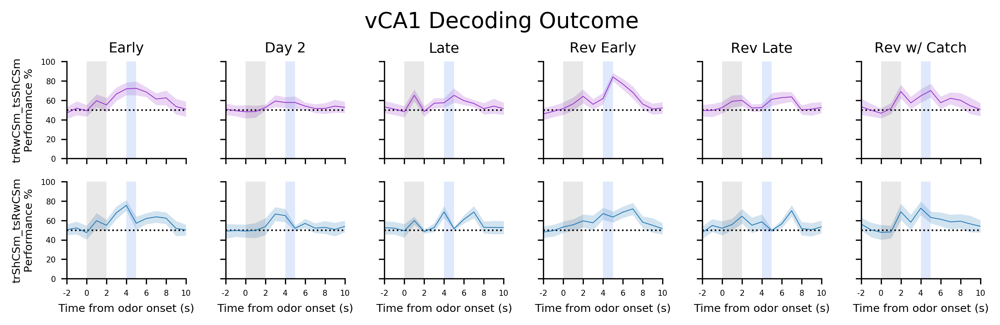

In [87]:
fig, ax = pl.subplots(2,6, figsize=(9, 2.7), sharex=True, sharey=True)

for r,sess in zip(range(6),sessions):
    for c,label,col in zip(range(2),['trRwCSm_tsShCSm','trShCSm_tsRwCSm'],('darkorchid','tab:blue','tab:red')):
        ax[c][r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_tb_%s_outcome_%s_vhpc[sess][:,0]"%(t,label)))*100) for t in range(13)], color=col, ls='-',lw=.5 ,ms=1)
        m = np.array([(np.mean(eval("scores_tb_%s_outcome_%s_vhpc[sess][:,0]"%(t,label)))*100) for t in range(13)])
        s = np.array([np.std(eval("scores_tb_%s_outcome_%s_vhpc[sess][:,0]"%(t,label)))*100 for t in range(13)])
        ax[c][r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=col,linewidth=0)

for r in range(6):       
    for lab, c in zip(['trRwCSm_tsShCSm','trShCSm_tsRwCSm'],range(2)):
        ax[c][r].set_ylim(0, 100)
        ax[c][r].set_xlim(-2, 10)
        ax[c][r].set_xticks(np.arange(-2,11, 2))
        ax[c][r].set_xticklabels(np.arange(-2,11, 2))
        ax[c][r].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
        ax[1][r].set_xlabel('Time from odor onset (s)')
        ax[c][0].set_ylabel(lab+'\nPerformance %')
        pt.plot_period_bar(ax[c][r], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.09)
        pt.plot_period_bar(ax[c][r], 0, start_end=(4, 5), color='cornflowerblue', delta_y=100, alpha=.2)
        #ax[c][r].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')
ax[0][0].set_title('Early', fontsize=9, color = 'k')
ax[0][1].set_title('Day 2', fontsize=9, color='k')
ax[0][2].set_title('Late', fontsize=9, color = 'k')
ax[0][3].set_title('Rev Early', fontsize=9, color = 'k')
ax[0][4].set_title('Rev Late', fontsize=9, color = 'k')
ax[0][5].set_title('Rev w/ Catch', fontsize=9, color='k')

pl.suptitle('vCA1 Decoding Outcome',fontsize=14,y=1.05)
fig.tight_layout(pad=2)


#fig.savefig('../img/%s_gmin_horizontal.pdf'%NOTEBOOK_NAME)

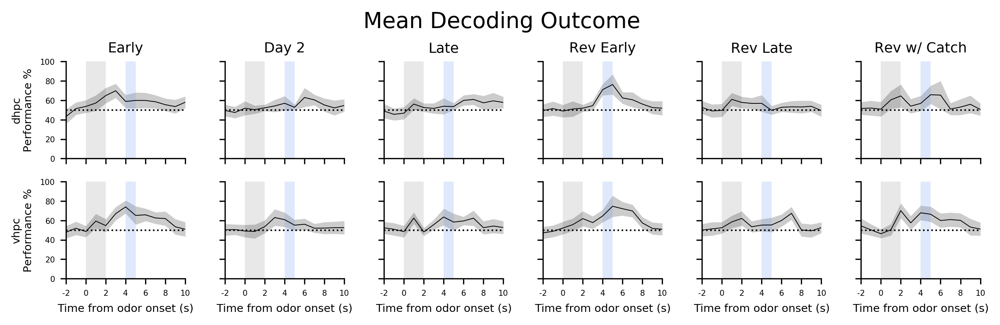

In [136]:
fig, ax = pl.subplots(2,6, figsize=(9, 2.7), sharex=True, sharey=True)

for r,sess in zip(range(6),sessions):
    for c,reg in zip(range(2),['dhpc','vhpc']):
        ax[c][r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_tb_%s_outcome_trRwCSm_tsShCSm_%s[sess]"%(t,reg)))*100) for t in range(13)],
                      color='k', ls='-',lw=.5 ,ms=1)
        m = np.array([(np.mean(eval("scores_tb_%s_outcome_trRwCSm_tsShCSm_%s[sess]"%(t,reg)))*100) for t in range(13)])
        s = np.array([np.std(eval("scores_tb_%s_outcome_trRwCSm_tsShCSm_%s[sess]"%(t,reg)))*100 for t in range(13)])
        ax[c][r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color='k',linewidth=0)

for r in range(6):       
    for lab, c in zip(['dhpc','vhpc'],range(2)):
        ax[c][r].set_ylim(0, 100)
        ax[c][r].set_xlim(-2, 10)
        ax[c][r].set_xticks(np.arange(-2,11, 2))
        ax[c][r].set_xticklabels(np.arange(-2,11, 2))
        ax[c][r].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
        ax[1][r].set_xlabel('Time from odor onset (s)')
        ax[c][0].set_ylabel(lab+'\nPerformance %')
        pt.plot_period_bar(ax[c][r], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.09)
        pt.plot_period_bar(ax[c][r], 0, start_end=(4, 5), color='cornflowerblue', delta_y=100, alpha=.2)
        #ax[c][r].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')
ax[0][0].set_title('Early', fontsize=9, color = 'k')
ax[0][1].set_title('Day 2', fontsize=9, color='k')
ax[0][2].set_title('Late', fontsize=9, color = 'k')
ax[0][3].set_title('Rev Early', fontsize=9, color = 'k')
ax[0][4].set_title('Rev Late', fontsize=9, color = 'k')
ax[0][5].set_title('Rev w/ Catch', fontsize=9, color='k')

pl.suptitle('Mean Decoding Outcome',fontsize=14,y=1.05)
fig.tight_layout(pad=2)


fig.savefig('../figures/%s_outcome_dv.pdf'%NOTEBOOK_NAME)

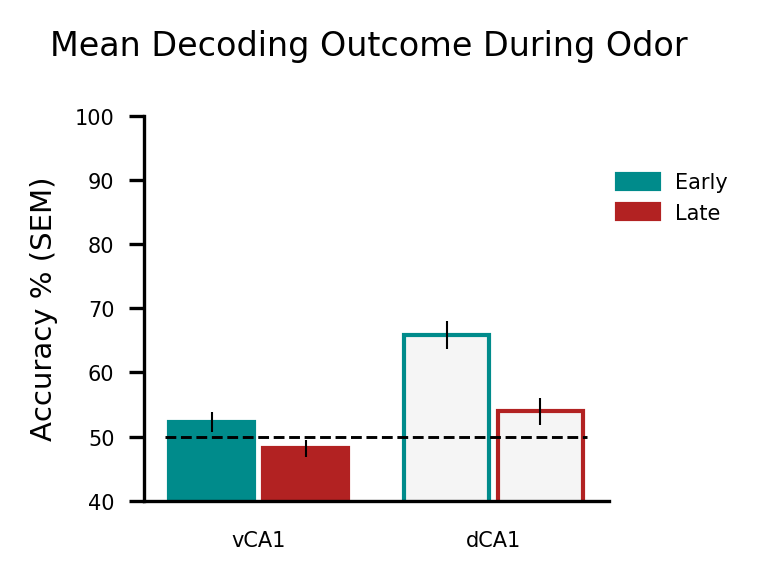

In [84]:
from matplotlib.patches import Patch
width = 0.9  # the width of the bars
loops=10
v={}
d={}
fig, ax = pl.subplots(figsize=(2,1.7))

for sess,i,lab in zip(['pre','post'],range(2),['Early','Late']):
        v[sess] = np.array(np.std(scores_tb_4_outcome_trRwCSm_tsShCSm_vhpc[sess][:loops])*100/np.sqrt(loops-1))
        ax.bar(i, np.mean(scores_tb_4_outcome_trRwCSm_tsShCSm_vhpc[sess][:loops])*100, width, color=dark_co[i],edgecolor=dark_co[i],yerr=v[sess],label=lab)
        d[sess] = np.array(np.std(scores_tb_4_outcome_trRwCSm_tsShCSm_dhpc[sess][:loops])*100/np.sqrt(loops-1))
        ax.bar(i + 2.5,  np.mean(scores_tb_4_outcome_trRwCSm_tsShCSm_dhpc[sess][:loops])*100, width,color='whitesmoke', edgecolor=dark_co[i],yerr=d[sess])
ax.hlines(50,-.5,4, color='k', lw=.7, linestyles='dashed')
# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Accuracy % (SEM)')
#ax.set_title('Decoding During CS')
ax.set_ylim(40,100)
ax.set_xticks([.5,3])
ax.set_xticklabels(['vCA1','dCA1'])
ax.legend(loc=(1,.7),frameon=False)
#ax.legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
ax.tick_params(axis='x',bottom=False)
pvs=[]
sessi = ['pre','post']
#for i in range(1):
#    pvs.append(add_significance(ax, mean_scores_gmin_tb_6_vhpc[sessi[i]][:loops], mean_scores_gmin_tb_6_vhpc[sessi[i+1]][:loops],
#        i+.05,i+.95,100,mcc=1))
#    pvs.append(add_significance(ax, mean_scores_gmin_tb_6_dhpc[sessi[i]][:loops], mean_scores_gmin_tb_6_dhpc[sessi[i+1]][:loops],
#        i+2.55,i+3.45,100,mcc=1))

        #max(np.mean(mean_scores_gmin_tb_6_vhpc[sess][:loops])*100+v[sess],
        #    np.mean(mean_scores_gmin_tb_6_dhpc[sess][:loops])*100+d[sess])+6))
    #pvs.append(sig_vs_chance(ax,mean_scores_gmin_tb_6_vhpc[sess][:loops],.5,-.2+i,
    #           np.mean(mean_scores_gmin_tb_6_vhpc[sess][:loops])*100+v[sess]+1,loops=loops,sig_func=None,colors='k'))
    #pvs.append(sig_vs_chance(ax,mean_scores_gmin_tb_6_dhpc[sess][:loops],.5, .2+i,
    #           np.mean(mean_scores_gmin_tb_6_dhpc[sess][:loops])*100+d[sess]+1,loops=loops,sig_func=None,colors='k'))
pl.suptitle('Mean Decoding Outcome During Odor',y=1.05,fontsize=8)

#fig.savefig('../final-ish figures/%s_gmin_bars_odor_PrPo.pdf'%NOTEBOOK_NAME)

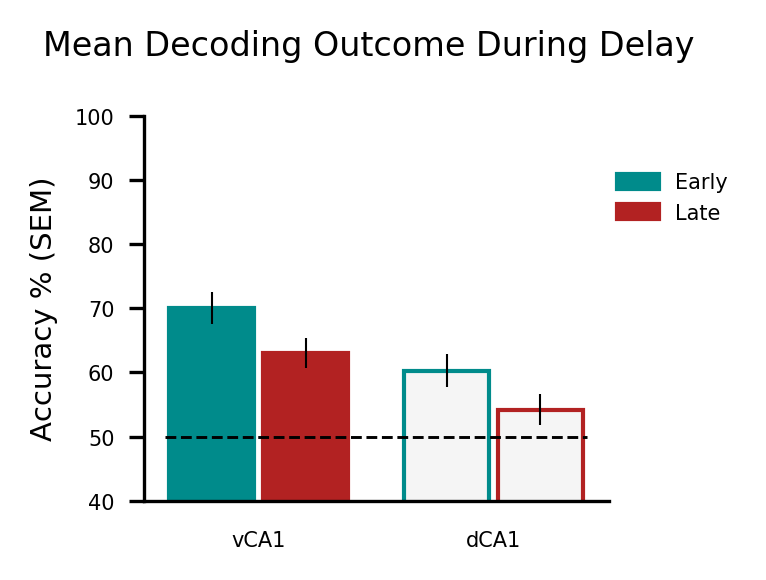

In [85]:
from matplotlib.patches import Patch
width = 0.9  # the width of the bars
loops=10
v={}
d={}
fig, ax = pl.subplots(figsize=(2,1.7))

for sess,i,lab in zip(['pre','post'],range(2),['Early','Late']):
        v[sess] = np.array(np.std(scores_tb_6_outcome_trRwCSm_tsShCSm_vhpc[sess][:loops])*100/np.sqrt(loops-1))
        ax.bar(i, np.mean(scores_tb_6_outcome_trRwCSm_tsShCSm_vhpc[sess][:loops])*100, width, color=dark_co[i],edgecolor=dark_co[i],yerr=v[sess],label=lab)
        d[sess] = np.array(np.std(scores_tb_6_outcome_trRwCSm_tsShCSm_dhpc[sess][:loops])*100/np.sqrt(loops-1))
        ax.bar(i + 2.5,  np.mean(scores_tb_6_outcome_trRwCSm_tsShCSm_dhpc[sess][:loops])*100, width,color='whitesmoke', edgecolor=dark_co[i],yerr=d[sess])
ax.hlines(50,-.5,4, color='k', lw=.7, linestyles='dashed')
# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Accuracy % (SEM)')
#ax.set_title('Decoding During CS')
ax.set_ylim(40,100)
ax.set_xticks([.5,3])
ax.set_xticklabels(['vCA1','dCA1'])
ax.legend(loc=(1,.7),frameon=False)
#ax.legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
ax.tick_params(axis='x',bottom=False)
pvs=[]
sessi = ['pre','post']
#for i in range(1):
#    pvs.append(add_significance(ax, mean_scores_gmin_tb_6_vhpc[sessi[i]][:loops], mean_scores_gmin_tb_6_vhpc[sessi[i+1]][:loops],
#        i+.05,i+.95,100,mcc=1))
#    pvs.append(add_significance(ax, mean_scores_gmin_tb_6_dhpc[sessi[i]][:loops], mean_scores_gmin_tb_6_dhpc[sessi[i+1]][:loops],
#        i+2.55,i+3.45,100,mcc=1))

        #max(np.mean(mean_scores_gmin_tb_6_vhpc[sess][:loops])*100+v[sess],
        #    np.mean(mean_scores_gmin_tb_6_dhpc[sess][:loops])*100+d[sess])+6))
    #pvs.append(sig_vs_chance(ax,mean_scores_gmin_tb_6_vhpc[sess][:loops],.5,-.2+i,
    #           np.mean(mean_scores_gmin_tb_6_vhpc[sess][:loops])*100+v[sess]+1,loops=loops,sig_func=None,colors='k'))
    #pvs.append(sig_vs_chance(ax,mean_scores_gmin_tb_6_dhpc[sess][:loops],.5, .2+i,
    #           np.mean(mean_scores_gmin_tb_6_dhpc[sess][:loops])*100+d[sess]+1,loops=loops,sig_func=None,colors='k'))
pl.suptitle('Mean Decoding Outcome During Delay',y=1.05,fontsize=8)

#fig.savefig('../final-ish figures/%s_gmin_bars_odor_PrPo.pdf'%NOTEBOOK_NAME)

In [98]:
np.mean(scores_tb_4_outcome_trRwCSm_tsShCSm_vhpc['post'],1)

array([ 0.5475,  0.4525,  0.4925,  0.4675,  0.455 ,  0.475 ,  0.485 ,
        0.465 ,  0.5125,  0.4675,  0.5025,  0.505 ,  0.4725,  0.4975,
        0.505 ,  0.57  ,  0.4775,  0.495 ,  0.47  ,  0.47  ,  0.46  ,
        0.5   ,  0.475 ,  0.565 ,  0.49  ,  0.495 ,  0.455 ,  0.4575,
        0.5025,  0.435 ,  0.4825,  0.43  ,  0.48  ,  0.4475,  0.47  ,
        0.44  ,  0.445 ,  0.425 ,  0.5225,  0.445 ,  0.5025,  0.48  ,
        0.495 ,  0.505 ,  0.51  ,  0.4725,  0.4425,  0.54  ,  0.4175,  0.49  ])

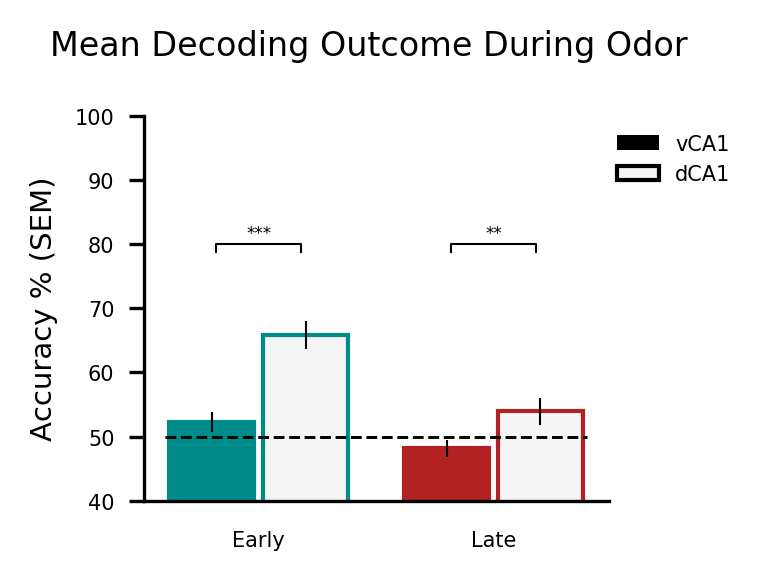

In [103]:
from matplotlib.patches import Patch
width = 0.9  # the width of the bars
loops=10
v={}
d={}
fig, ax = pl.subplots(figsize=(2,1.7))

for reg,i,lab in zip(['vhpc','dhpc'],range(2),['vCA1','dCA1']):
    if reg == 'vhpc':
        c=dark_co[0]
    if reg == 'dhpc':
        c='whitesmoke'
    co=dark_co[0]
    v[sess] = np.array(np.std(eval("scores_tb_4_outcome_trRwCSm_tsShCSm_%s['pre'][:loops]"%reg))*100/np.sqrt(loops-1))
    ax.bar(i, np.mean(eval("scores_tb_4_outcome_trRwCSm_tsShCSm_%s['pre'][:loops]"%reg))*100, width, color=c,edgecolor=co,yerr=v[sess],label=lab)
    if reg == 'vhpc':
        c=dark_co[1]
    if reg == 'dhpc':
        c='whitesmoke'
    co=dark_co[1]
    d[sess] = np.array(np.std(eval("scores_tb_4_outcome_trRwCSm_tsShCSm_%s['post'][:loops]"%reg))*100/np.sqrt(loops-1))
    ax.bar(i + 2.5,  np.mean(eval("scores_tb_4_outcome_trRwCSm_tsShCSm_%s['post'][:loops]"%reg))*100, width,color=c, edgecolor=co,yerr=d[sess])
ax.hlines(50,-.5,4, color='k', lw=.7, linestyles='dashed')
# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Accuracy % (SEM)')
#ax.set_title('Decoding During CS')
ax.set_ylim(40,100)
ax.set_xticks([.5,3])
ax.set_xticklabels(['Early','Late'])
#ax.legend(loc=(1,.7),frameon=False)
ax.legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
ax.tick_params(axis='x',bottom=False)
pvs=[]
sessi = ['pre','post']
for i in range(1):
    pvs.append(add_significance(ax, np.mean(scores_tb_4_outcome_trRwCSm_tsShCSm_vhpc['pre'],1)[:loops], np.mean(scores_tb_4_outcome_trRwCSm_tsShCSm_dhpc['pre'],1)[:loops],
        i+.05,i+.95,80,mcc=1))
    pvs.append(add_significance(ax, np.mean(scores_tb_4_outcome_trRwCSm_tsShCSm_vhpc['post'],1)[:loops], np.mean(scores_tb_4_outcome_trRwCSm_tsShCSm_dhpc['post'],1)[:loops],
        i+2.55,i+3.45,80,mcc=1))

        #max(np.mean(mean_scores_gmin_tb_4_vhpc[sess][:loops])*100+v[sess],
        #    np.mean(mean_scores_gmin_tb_4_dhpc[sess][:loops])*100+d[sess])+6))
    #pvs.append(sig_vs_chance(ax,mean_scores_gmin_tb_4_vhpc[sess][:loops],.5,-.2+i,
    #           np.mean(mean_scores_gmin_tb_4_vhpc[sess][:loops])*100+v[sess]+1,loops=loops,sig_func=None,colors='k'))
    #pvs.append(sig_vs_chance(ax,mean_scores_gmin_tb_4_dhpc[sess][:loops],.5, .2+i,
    #           np.mean(mean_scores_gmin_tb_4_dhpc[sess][:loops])*100+d[sess]+1,loops=loops,sig_func=None,colors='k'))
pl.suptitle('Mean Decoding Outcome During Odor',y=1.05,fontsize=8)

fig.savefig('../figures/%s_bars_outcome_odor_PrPo.pdf'%NOTEBOOK_NAME)

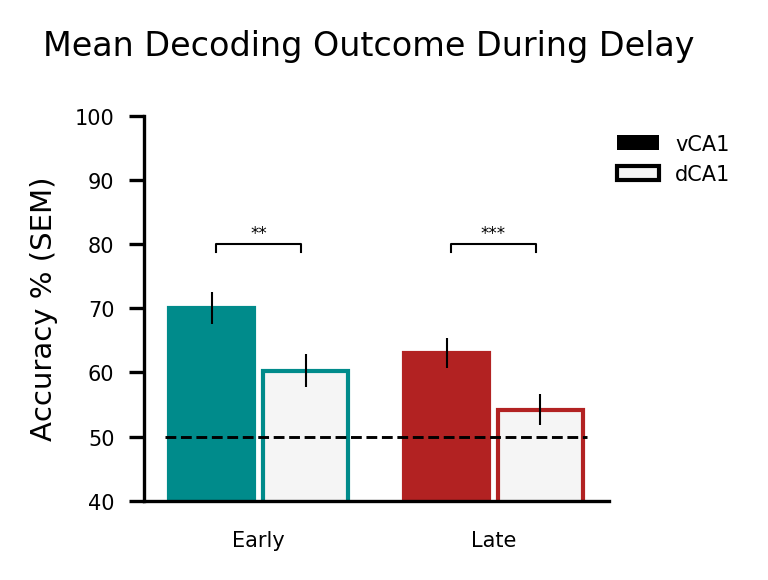

In [102]:
from matplotlib.patches import Patch
width = 0.9  # the width of the bars
loops=10
v={}
d={}
fig, ax = pl.subplots(figsize=(2,1.7))

for reg,i,lab in zip(['vhpc','dhpc'],range(2),['vCA1','dCA1']):
    if reg == 'vhpc':
        c=dark_co[0]
    if reg == 'dhpc':
        c='whitesmoke'
    co=dark_co[0]
    v[sess] = np.array(np.std(eval("scores_tb_6_outcome_trRwCSm_tsShCSm_%s['pre'][:loops]"%reg))*100/np.sqrt(loops-1))
    ax.bar(i, np.mean(eval("scores_tb_6_outcome_trRwCSm_tsShCSm_%s['pre'][:loops]"%reg))*100, width, color=c,edgecolor=co,yerr=v[sess],label=lab)
    if reg == 'vhpc':
        c=dark_co[1]
    if reg == 'dhpc':
        c='whitesmoke'
    co=dark_co[1]
    d[sess] = np.array(np.std(eval("scores_tb_6_outcome_trRwCSm_tsShCSm_%s['post'][:loops]"%reg))*100/np.sqrt(loops-1))
    ax.bar(i + 2.5,  np.mean(eval("scores_tb_6_outcome_trRwCSm_tsShCSm_%s['post'][:loops]"%reg))*100, width,color=c, edgecolor=co,yerr=d[sess])
ax.hlines(50,-.5,4, color='k', lw=.7, linestyles='dashed')
# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Accuracy % (SEM)')
#ax.set_title('Decoding During CS')
ax.set_ylim(40,100)
ax.set_xticks([.5,3])
ax.set_xticklabels(['Early','Late'])
#ax.legend(loc=(1,.7),frameon=False)
ax.legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k')],['vCA1','dCA1'],loc=(1,.8),frameon=False)
ax.tick_params(axis='x',bottom=False)
pvs=[]
sessi = ['pre','post']
for i in range(1):
    pvs.append(add_significance(ax, np.mean(scores_tb_6_outcome_trRwCSm_tsShCSm_vhpc['pre'],1)[:loops], np.mean(scores_tb_6_outcome_trRwCSm_tsShCSm_dhpc['pre'],1)[:loops],
        i+.05,i+.95,80,mcc=1))
    pvs.append(add_significance(ax, np.mean(scores_tb_6_outcome_trRwCSm_tsShCSm_vhpc['post'],1)[:loops], np.mean(scores_tb_6_outcome_trRwCSm_tsShCSm_dhpc['post'],1)[:loops],
        i+2.55,i+3.45,80,mcc=1))

        #max(np.mean(mean_scores_gmin_tb_6_vhpc[sess][:loops])*100+v[sess],
        #    np.mean(mean_scores_gmin_tb_6_dhpc[sess][:loops])*100+d[sess])+6))
    #pvs.append(sig_vs_chance(ax,mean_scores_gmin_tb_6_vhpc[sess][:loops],.5,-.2+i,
    #           np.mean(mean_scores_gmin_tb_6_vhpc[sess][:loops])*100+v[sess]+1,loops=loops,sig_func=None,colors='k'))
    #pvs.append(sig_vs_chance(ax,mean_scores_gmin_tb_6_dhpc[sess][:loops],.5, .2+i,
    #           np.mean(mean_scores_gmin_tb_6_dhpc[sess][:loops])*100+d[sess]+1,loops=loops,sig_func=None,colors='k'))
pl.suptitle('Mean Decoding Outcome During Delay',y=1.05,fontsize=8)

fig.savefig('../figures/%s_bars_outcome_tr_PrPo.pdf'%NOTEBOOK_NAME)

# Break up session into thirds

In [35]:
v_name=[]
for t in range(13):
    for label in non_catch_labels:
        for per in 'early','mid','late':
            for r in 'dhpc','vhpc':
                exec("scores_gmin_tb_%s_%s_%s_%s = {}"%(t,label,per,r))
                for sess in sessions:
                    exec("v_name = 'scores_gmin_tb_%s_%s_%s'"%(t,label,per))
                    exec("path='../notebooks/autorestore/decoding_around_onset_combined_1sec_%s/'"%(r))
                    exec("scores_gmin_tb_%s_%s_%s_%s = ut.load_variable(v_name,path)"%(t,label,per,r))
                    #exec("scores_gmin_tb_%s_%s_%s_%s_t = scores_gmin_tb_%s_%s_%s_%s_t['%s']"%(t,label,per,r,t,label,per,r,sess))
                    #exec("scores_gmin_tb_%s_%s_%s_%s['%s'] = scores_gmin_tb_%s_%s_%s_%s_t"%(t,label,per,r,sess,t,label,per,r))

In [36]:
#get mean of each array
for t in range(13):
    for label in non_catch_labels:
        for per in 'early','mid','late':
            for r in 'dhpc','vhpc':
                exec("mean_scores_gmin_tb_%s_%s_%s_%s={}"%(t,label,per,r))
                for sess in sessions:
                    exec("mean_scores_gmin_tb_%s_%s_%s_%s[sess]=[]"%(t,label,per,r))
                    for i in eval("scores_gmin_tb_%s_%s_%s_%s[sess]"%(t,label,per,r)):
                        exec("mean_scores_gmin_tb_%s_%s_%s_%s[sess].append(i.mean())"%(t,label,per,r))

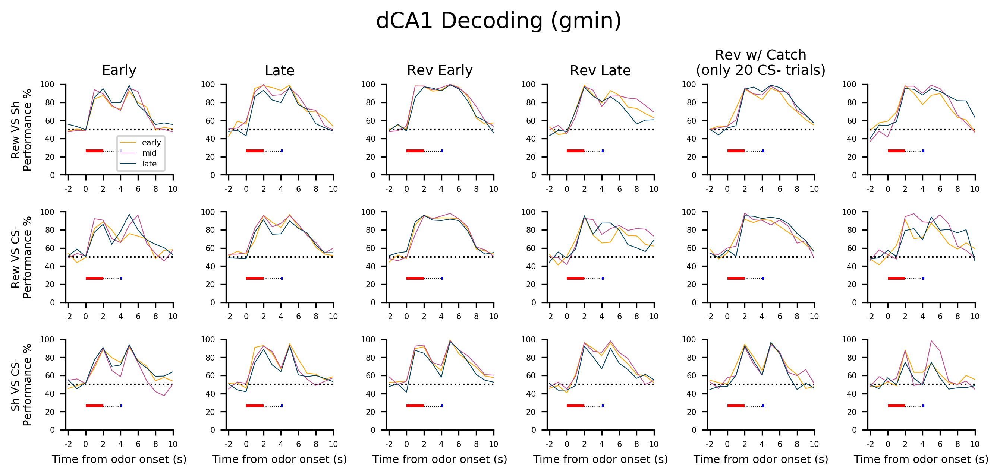

In [39]:
fig, ax = pl.subplots(3,6, figsize=(9, 4))

for sess,r in zip(sessions,range(len(sessions))):
    for lab, x in zip(non_catch_labels,range(len(non_catch_labels))):
        for phase,c in zip(['early','mid','late'],(('#ffa600','#bc5090','#003f5c'))):
            ax[x][r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_%s_dhpc[sess]"%(t,lab,phase)))*100) for t in range(13)], color=c,label=phase)
            m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_%s_dhpc[sess]"%(t,lab,phase)))*100) for t in range(13)])
            s = np.array([np.std(eval("scores_gmin_tb_%s_%s_%s_dhpc[sess]"%(t,lab,phase)))*100 for t in range(13)])
            #ax[x][r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=c,linewidth=0)

for lab, x in zip(['Rew VS Sh','Rew VS CS-','Sh VS CS-'],range(3)):
    for r in range(len(sessions)):
        ax[x][r].set_ylim(0, 100)
        ax[x][r].set_xlim(-2.3, 10)
        ax[x][r].set_xticks(np.arange(-2,11, 2))
        ax[x][r].set_xticklabels(np.arange(-2,11, 2))
        ax[x][r].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
        ax[2][r].set_xlabel('Time from odor onset (s)')
        ax[x][0].set_ylabel(lab+'\nPerformance %')
        pt.plot_period_bar(ax[x][r], 25, start_end=(0, 2), color='r', delta_y=3)
        pt.plot_period_bar(ax[x][r], 25, start_end=(4, 4.2), color='b', delta_y=3)
        ax[x][r].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')
        ax[0][0].legend(bbox_to_anchor=(.96,.47),labelspacing=0.4,fontsize=5)

ax[0][0].set_title('Early', fontsize=9, color = 'k')
ax[0][1].set_title('Late', fontsize=9, color = 'k')
ax[0][2].set_title('Rev Early', fontsize=9, color = 'k')
ax[0][3].set_title('Rev Late', fontsize=9, color = 'k')
ax[0][4].set_title('Rev w/ Catch\n(only 20 CS- trials)', fontsize=9, color='k')

fig.tight_layout(pad=2)
pl.suptitle('dCA1 Decoding (gmin)',fontsize=14,y=1.05)


fig.savefig('../img/%s_gmin_phases_dCA1_labels.pdf'%NOTEBOOK_NAME)

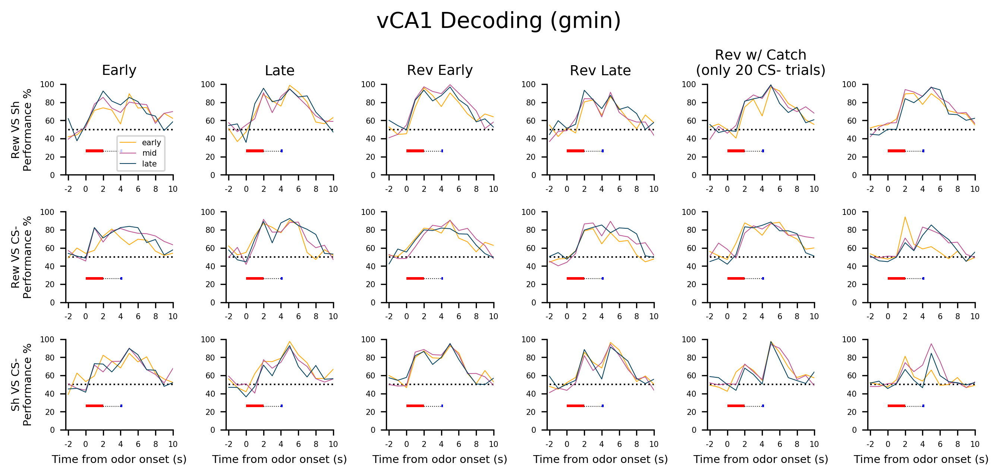

In [40]:
fig, ax = pl.subplots(3,6, figsize=(9, 4))

for sess,r in zip(sessions,range(len(sessions))):
    for lab, x in zip(non_catch_labels,range(len(non_catch_labels))):
        for phase,c in zip(['early','mid','late'],(('#ffa600','#bc5090','#003f5c'))):
            ax[x][r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_%s_vhpc[sess]"%(t,lab,phase)))*100) for t in range(13)], color=c,label=phase)
            m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_%s_vhpc[sess]"%(t,lab,phase)))*100) for t in range(13)])
            s = np.array([np.std(eval("scores_gmin_tb_%s_%s_%s_vhpc[sess]"%(t,lab,phase)))*100 for t in range(13)])
            #ax[x][r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=c,linewidth=0)

for lab, x in zip(['Rew VS Sh','Rew VS CS-','Sh VS CS-'],range(3)):
    for r in range(len(sessions)):
        ax[x][r].set_ylim(0, 100)
        ax[x][r].set_xlim(-2.3, 10)
        ax[x][r].set_xticks(np.arange(-2,11, 2))
        ax[x][r].set_xticklabels(np.arange(-2,11, 2))
        ax[x][r].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
        ax[2][r].set_xlabel('Time from odor onset (s)')
        ax[x][0].set_ylabel(lab+'\nPerformance %')
        pt.plot_period_bar(ax[x][r], 25, start_end=(0, 2), color='r', delta_y=3)
        pt.plot_period_bar(ax[x][r], 25, start_end=(4, 4.2), color='b', delta_y=3)
        ax[x][r].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')
        ax[0][0].legend(bbox_to_anchor=(.96,.47),labelspacing=0.4,fontsize=5)

ax[0][0].set_title('Early', fontsize=9, color = 'k')
ax[0][1].set_title('Late', fontsize=9, color = 'k')
ax[0][2].set_title('Rev Early', fontsize=9, color = 'k')
ax[0][3].set_title('Rev Late', fontsize=9, color = 'k')
ax[0][4].set_title('Rev w/ Catch\n(only 20 CS- trials)', fontsize=9, color='k')

fig.tight_layout(pad=2)
pl.suptitle('vCA1 Decoding (gmin)',fontsize=14,y=1.05)


fig.savefig('../img/%s_gmin_phases_vCA1_labels.pdf'%NOTEBOOK_NAME)

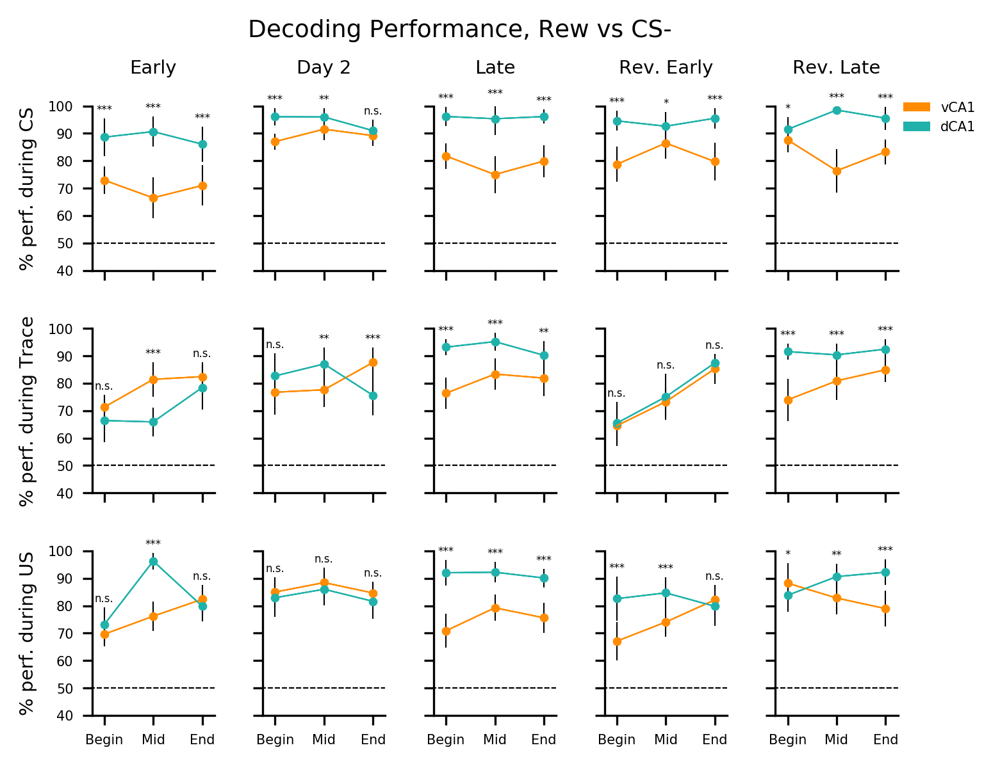

In [47]:
fig,ax = pl.subplots(3,5,figsize=(5,4),sharex=True,sharey=True)
v={}
d={}
label='rwVScsm'
phases=['early','mid','late']
loops=15
for sess,q in zip(sessions[:-1],range(len(sessions[:-1]))):
    for phase,z in zip(['early','mid','late'],(.2,1,1.8)):
        for tb,tb_la,x in zip((4,6,8),('CS','Trace','US',),(range(3))):
                v[sess+phase+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops]"%(tb,label,phase)))*100)
                ax[x][q].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops]"%(tb,label,phase)))*100), 'o',
                              color='darkorange',markersize=2.3)
                ax[x][q].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops]"%(tb,label,phase)))*100),yerr=v[sess+phase+tb_la],
                              color='k')
                d[sess+phase+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops]"%(tb,label,phase)))*100)
                ax[x][q].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops]"%(tb,label,phase)))*100), 'o', color='lightseagreen',
                           markersize=2.3)
                ax[x][q].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops]"%(tb,label,phase)))*100),yerr=d[sess+phase+tb_la],
                              color='k') 
# Add connecting lines 
for sess,sess_la,q in zip(sessions[:-1],all_session_labels[:-1], range(len(sessions[:-1]))):
    for phase,z in zip(['early','mid','late'],(.2,1,1.8)):
        for tb,tb_la,x in zip((4,6,8),('CS','Trace','US',),(range(3))):
                ax[x][q].plot([p for p in (.2,1,1.8)],
                           [(np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops]"%(tb,label,phase)))*100) for phase in phases],
                           color='darkorange')
                ax[x][q].plot([p for p in (.2,1,1.8)],
                           [(np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops]"%(tb,label,phase)))*100) for phase in phases],
                           color='lightseagreen')
            
           #ax[x].tick_params(axis='x',bottom=False,labelbottom=False) # labels along the bottom edge are off
                ax[x][0].set_ylabel('% perf. during '+tb_la)
                ax[x][q].set_ylim(40,100)
                ax[x][q].hlines(50, -.5,2.5, color='k', lw=.5, linestyles='--')
                ax[0][q].set_title(sess_la,y=1.1)
                ax[x][q].set_xlim(0,2)
                ax[x][q].set_xticks((.2,1,1.8))
                ax[x][q].set_xticklabels(['Begin','Mid','End'])
                ax[0][4].legend([Patch(facecolor='darkorange'),Patch(facecolor='lightseagreen')],['vCA1','dCA1'],loc=(1,.8),frameon=False)

#ax[0].legend(loc=(1,0))
pl.suptitle('Decoding Performance, Rew vs CS-',fontsize=9,x=.5,y=1)

pvs=[]
phases=['early','mid','late']
for sess,q in zip(sessions[:-1],range(len(sessions[:-1]))):
    for tb,tb_la,x in zip((4,6,8),('CS','Trace','US'),(range(3))):
        for i,z in zip(range(3),(.2,1,1.8)):
            pvs.append(add_significance(ax[x][q], eval("mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops]"%(tb,label,phases[i])),
                        eval("mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops]"%(tb,label,phases[i])),z,z,
                        max(eval("np.mean(mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops])"%(tb,label,phases[i]))*100+v[sess+phases[i]+tb_la],
                        eval("np.mean(mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops])"%(tb,label,phases[i]))*100+d[sess+phases[i]+tb_la])+1,
                        ticksize=0))
#        for d in range(3):
#            pvs.append(sig_vs_chance(ax[x],eval("mean_scores_gmin_tb_%s_%s_%s['renew'][:loops]"%(tb,phases[d],r)),.5,d,
#                   eval("np.mean(mean_scores_gmin_tb_%s_%s_%s['renew'][:loops])"%(tb,phases[d],r))*100+s[phases[d]+r]+1,loops=loops,colors='k'))
#        #       eval("mean_scores_gmin_tb_%s_%s_%s['pre'][:loops]"%(tb,phases[i],r))*100+s+1,loops=loops,sig_func=None,colors='k'))
    #pvs.append(sig_vs_chance(ax,mean_scores_gmin_tb_8_dhpc[sess][:loops],.5, .2+i,
    #           np.mean(mean_scores_gmin_tb_8_dhpc[sess][:loops])*100+d[sess]+1,loops=loops,sig_func=None,colors='k'))

fig.tight_layout(pad=3)

fig.savefig('../img/%s_gmin_3rdsphases_ALLsess_rwVScsm.pdf'%NOTEBOOK_NAME)

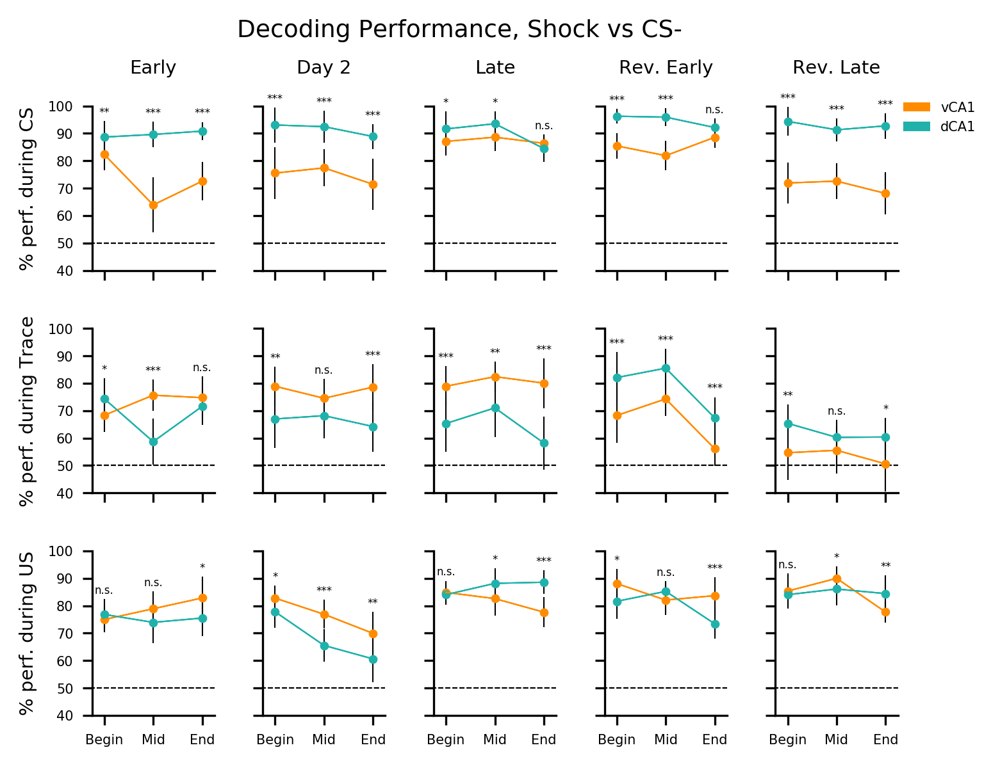

In [46]:
fig,ax = pl.subplots(3,5,figsize=(5,4),sharex=True,sharey=True)
v={}
d={}
label='shVScsm'
phases=['early','mid','late']
loops=15
for sess,q in zip(sessions[:-1],range(len(sessions[:-1]))):
    for phase,z in zip(['early','mid','late'],(.2,1,1.8)):
        for tb,tb_la,x in zip((4,6,8),('CS','Trace','US',),(range(3))):
                v[sess+phase+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops]"%(tb,label,phase)))*100)
                ax[x][q].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops]"%(tb,label,phase)))*100), 'o',
                              color='darkorange',markersize=2.3)
                ax[x][q].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops]"%(tb,label,phase)))*100),yerr=v[sess+phase+tb_la],
                              color='k')
                d[sess+phase+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops]"%(tb,label,phase)))*100)
                ax[x][q].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops]"%(tb,label,phase)))*100), 'o', color='lightseagreen',
                           markersize=2.3)
                ax[x][q].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops]"%(tb,label,phase)))*100),yerr=d[sess+phase+tb_la],
                              color='k')
# Add connecting lines 
for sess,sess_la,q in zip(sessions[:-1],all_session_labels[:-1], range(len(sessions[:-1]))):
    for phase,z in zip(['early','mid','late'],(.2,1,1.8)):
        for tb,tb_la,x in zip((4,6,8),('CS','Trace','US',),(range(3))):
                ax[x][q].plot([p for p in (.2,1,1.8)],
                           [(np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops]"%(tb,label,phase)))*100) for phase in phases],
                           color='darkorange')
                ax[x][q].plot([p for p in (.2,1,1.8)],
                           [(np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops]"%(tb,label,phase)))*100) for phase in phases],
                           color='lightseagreen')
            
           #ax[x].tick_params(axis='x',bottom=False,labelbottom=False) # labels along the bottom edge are off
                ax[x][0].set_ylabel('% perf. during '+tb_la)
                ax[x][q].set_ylim(40,100)
                ax[x][q].hlines(50, -.5,2.5, color='k', lw=.5, linestyles='--')
                ax[0][q].set_title(sess_la,y=1.1)
                ax[x][q].set_xlim(0,2)
                ax[x][q].set_xticks((.2,1,1.8))
                ax[x][q].set_xticklabels(['Begin','Mid','End'])
                ax[0][4].legend([Patch(facecolor='darkorange'),Patch(facecolor='lightseagreen')],['vCA1','dCA1'],loc=(1,.8),frameon=False)

#ax[0].legend(loc=(1,0))
pl.suptitle('Decoding Performance, Shock vs CS-',fontsize=9,x=.5,y=1)

pvs=[]
phases=['early','mid','late']
for sess,q in zip(sessions[:-1],range(len(sessions[:-1]))):
    for tb,tb_la,x in zip((4,6,8),('CS','Trace','US'),(range(3))):
        for i,z in zip(range(3),(.2,1,1.8)):
            pvs.append(add_significance(ax[x][q], eval("mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops]"%(tb,label,phases[i])),
                        eval("mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops]"%(tb,label,phases[i])),z,z,
                        max(eval("np.mean(mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops])"%(tb,label,phases[i]))*100+v[sess+phases[i]+tb_la],
                        eval("np.mean(mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops])"%(tb,label,phases[i]))*100+d[sess+phases[i]+tb_la])+1,
                        ticksize=0))
#        for d in range(3):
#            pvs.append(sig_vs_chance(ax[x],eval("mean_scores_gmin_tb_%s_%s_%s['renew'][:loops]"%(tb,phases[d],r)),.5,d,
#                   eval("np.mean(mean_scores_gmin_tb_%s_%s_%s['renew'][:loops])"%(tb,phases[d],r))*100+s[phases[d]+r]+1,loops=loops,colors='k'))
#        #       eval("mean_scores_gmin_tb_%s_%s_%s['pre'][:loops]"%(tb,phases[i],r))*100+s+1,loops=loops,sig_func=None,colors='k'))
    #pvs.append(sig_vs_chance(ax,mean_scores_gmin_tb_8_dhpc[sess][:loops],.5, .2+i,
    #           np.mean(mean_scores_gmin_tb_8_dhpc[sess][:loops])*100+d[sess]+1,loops=loops,sig_func=None,colors='k'))

fig.tight_layout(pad=3)

fig.savefig('../img/%s_gmin_3rdsphases_ALLsess_shVScsm.pdf'%NOTEBOOK_NAME)

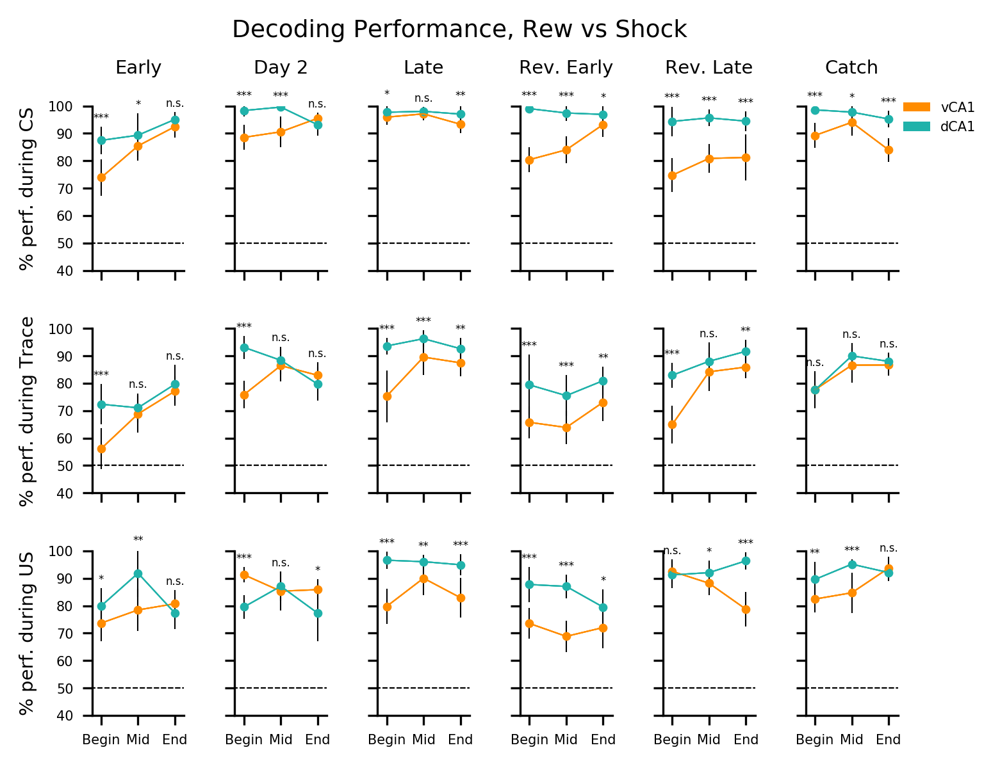

In [45]:
fig,ax = pl.subplots(3,6,figsize=(5,4),sharex=True,sharey=True)
v={}
d={}
label='rwVSsh'
phases=['early','mid','late']
loops=15
for sess,q in zip(sessions,range(len(sessions))):
    for phase,z in zip(['early','mid','late'],(.2,1,1.8)):
        for tb,tb_la,x in zip((4,6,8),('CS','Trace','US',),(range(3))):
                v[sess+phase+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops]"%(tb,label,phase)))*100)
                ax[x][q].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops]"%(tb,label,phase)))*100), 'o',
                              color='darkorange',markersize=2.3)
                ax[x][q].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops]"%(tb,label,phase)))*100),yerr=v[sess+phase+tb_la],
                              color='k')
                d[sess+phase+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops]"%(tb,label,phase)))*100)
                ax[x][q].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops]"%(tb,label,phase)))*100), 'o', color='lightseagreen',
                           markersize=2.3)
                ax[x][q].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops]"%(tb,label,phase)))*100),yerr=d[sess+phase+tb_la],
                              color='k')
# Add connecting lines 
for sess,sess_la,q in zip(sessions,all_session_labels, range(len(sessions))):
    for phase,z in zip(['early','mid','late'],(.2,1,1.8)):
        for tb,tb_la,x in zip((4,6,8),('CS','Trace','US',),(range(3))):
                ax[x][q].plot([p for p in (.2,1,1.8)],
                           [(np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops]"%(tb,label,phase)))*100) for phase in phases],
                           color='darkorange')
                ax[x][q].plot([p for p in (.2,1,1.8)],
                           [(np.mean(eval("mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops]"%(tb,label,phase)))*100) for phase in phases],
                           color='lightseagreen')
            
           #ax[x].tick_params(axis='x',bottom=False,labelbottom=False) # labels along the bottom edge are off
                ax[x][0].set_ylabel('% perf. during '+tb_la)
                ax[x][q].set_ylim(40,100)
                ax[x][q].hlines(50, -.5,2.5, color='k', lw=.5, linestyles='--')
                ax[0][q].set_title(sess_la,y=1.1)
                ax[x][q].set_xlim(0,2)
                ax[x][q].set_xticks((.2,1,1.8))
                ax[x][q].set_xticklabels(['Begin','Mid','End'])
                ax[0][5].legend([Patch(facecolor='darkorange'),Patch(facecolor='lightseagreen')],['vCA1','dCA1'],loc=(1,.8),frameon=False)

#ax[0].legend(loc=(1,0))
pl.suptitle('Decoding Performance, Rew vs Shock',fontsize=9,x=.5,y=1)

pvs=[]
phases=['early','mid','late']
for sess,q in zip(sessions,range(len(sessions))):
    for tb,tb_la,x in zip((4,6,8),('CS','Trace','US'),(range(3))):
        for i,z in zip(range(3),(.2,1,1.8)):
            pvs.append(add_significance(ax[x][q], eval("mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops]"%(tb,label,phases[i])),
                        eval("mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops]"%(tb,label,phases[i])),z,z,
                        max(eval("np.mean(mean_scores_gmin_tb_%s_%s_%s_vhpc[sess][:loops])"%(tb,label,phases[i]))*100+v[sess+phases[i]+tb_la],
                        eval("np.mean(mean_scores_gmin_tb_%s_%s_%s_dhpc[sess][:loops])"%(tb,label,phases[i]))*100+d[sess+phases[i]+tb_la])+1,
                        ticksize=0))
#        for d in range(3):
#            pvs.append(sig_vs_chance(ax[x],eval("mean_scores_gmin_tb_%s_%s_%s['renew'][:loops]"%(tb,phases[d],r)),.5,d,
#                   eval("np.mean(mean_scores_gmin_tb_%s_%s_%s['renew'][:loops])"%(tb,phases[d],r))*100+s[phases[d]+r]+1,loops=loops,colors='k'))
#        #       eval("mean_scores_gmin_tb_%s_%s_%s['pre'][:loops]"%(tb,phases[i],r))*100+s+1,loops=loops,sig_func=None,colors='k'))
    #pvs.append(sig_vs_chance(ax,mean_scores_gmin_tb_8_dhpc[sess][:loops],.5, .2+i,
    #           np.mean(mean_scores_gmin_tb_8_dhpc[sess][:loops])*100+d[sess]+1,loops=loops,sig_func=None,colors='k'))

fig.tight_layout(pad=3)

fig.savefig('../img/%s_gmin_3rdsphases_ALLsess_rwVSsh.pdf'%NOTEBOOK_NAME)

# break session into halves

In [49]:
v_name=[]
for t in range(13):
    for label in non_catch_labels:
        for per in 'firstHalf','lastHalf':
            for r in 'dhpc','vhpc':
                exec("scores_gmin_tb_%s_%s_%s_%s = {}"%(t,label,per,r))
                for sess in sessions:
                    exec("v_name = 'scores_gmin_tb_%s_%s_%s'"%(t,label,per))
                    exec("path='../notebooks/autorestore/decoding_around_onset_combined_1sec_%s/'"%(r))
                    exec("scores_gmin_tb_%s_%s_%s_%s = ut.load_variable(v_name,path)"%(t,label,per,r))
                    #exec("scores_gmin_tb_%s_%s_%s_%s_t = scores_gmin_tb_%s_%s_%s_%s_t['%s']"%(t,label,per,r,t,label,per,r,sess))
                    #exec("scores_gmin_tb_%s_%s_%s_%s['%s'] = scores_gmin_tb_%s_%s_%s_%s_t"%(t,label,per,r,sess,t,label,per,r))

In [50]:
#get mean of each array
for t in range(13):
    for label in non_catch_labels:
        for per in 'firstHalf','lastHalf':
            for r in 'dhpc','vhpc':
                exec("mean_scores_gmin_tb_%s_%s_%s_%s={}"%(t,label,per,r))
                for sess in sessions:
                    exec("mean_scores_gmin_tb_%s_%s_%s_%s[sess]=[]"%(t,label,per,r))
                    for i in eval("scores_gmin_tb_%s_%s_%s_%s[sess]"%(t,label,per,r)):
                        exec("mean_scores_gmin_tb_%s_%s_%s_%s[sess].append(i.mean())"%(t,label,per,r))

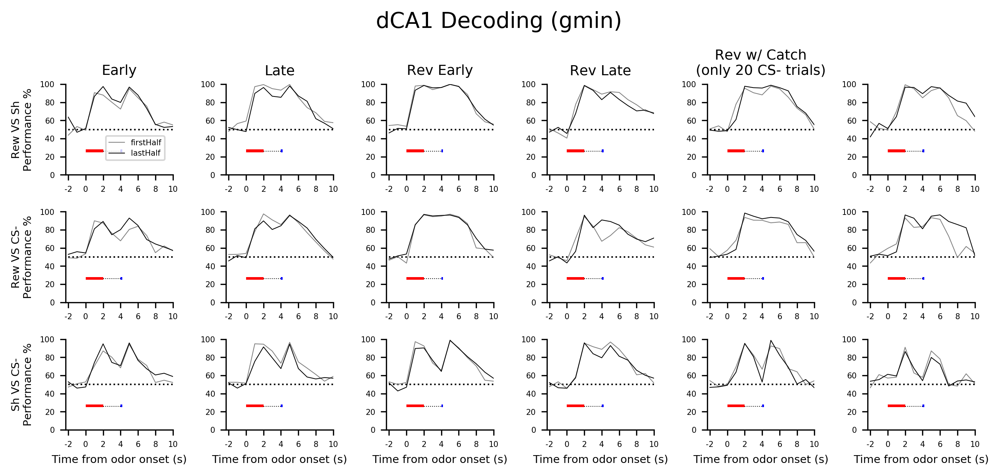

In [52]:
fig, ax = pl.subplots(3,6, figsize=(9, 4))

for sess,r in zip(sessions,range(len(sessions))):
    for lab, x in zip(non_catch_labels,range(len(non_catch_labels))):
        for phase,c in zip(['firstHalf','lastHalf'],(('grey','k'))):
            ax[x][r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_%s_dhpc[sess]"%(t,lab,phase)))*100) for t in range(13)], color=c,label=phase)
            m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_%s_dhpc[sess]"%(t,lab,phase)))*100) for t in range(13)])
            s = np.array([np.std(eval("scores_gmin_tb_%s_%s_%s_dhpc[sess]"%(t,lab,phase)))*100 for t in range(13)])
            #ax[x][r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=c,linewidth=0)

for lab, x in zip(['Rew VS Sh','Rew VS CS-','Sh VS CS-'],range(3)):
    for r in range(len(sessions)):
        ax[x][r].set_ylim(0, 100)
        ax[x][r].set_xlim(-2.3, 10)
        ax[x][r].set_xticks(np.arange(-2,11, 2))
        ax[x][r].set_xticklabels(np.arange(-2,11, 2))
        ax[x][r].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
        ax[2][r].set_xlabel('Time from odor onset (s)')
        ax[x][0].set_ylabel(lab+'\nPerformance %')
        pt.plot_period_bar(ax[x][r], 25, start_end=(0, 2), color='r', delta_y=3)
        pt.plot_period_bar(ax[x][r], 25, start_end=(4, 4.2), color='b', delta_y=3)
        ax[x][r].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')
        ax[0][0].legend(bbox_to_anchor=(.96,.47),labelspacing=0.4,fontsize=5)

ax[0][0].set_title('Early', fontsize=9, color = 'k')
ax[0][1].set_title('Late', fontsize=9, color = 'k')
ax[0][2].set_title('Rev Early', fontsize=9, color = 'k')
ax[0][3].set_title('Rev Late', fontsize=9, color = 'k')
ax[0][4].set_title('Rev w/ Catch\n(only 20 CS- trials)', fontsize=9, color='k')

fig.tight_layout(pad=2)
pl.suptitle('dCA1 Decoding (gmin)',fontsize=14,y=1.05)


fig.savefig('../img/%s_gmin_halves_dCA1_labels.pdf'%NOTEBOOK_NAME)

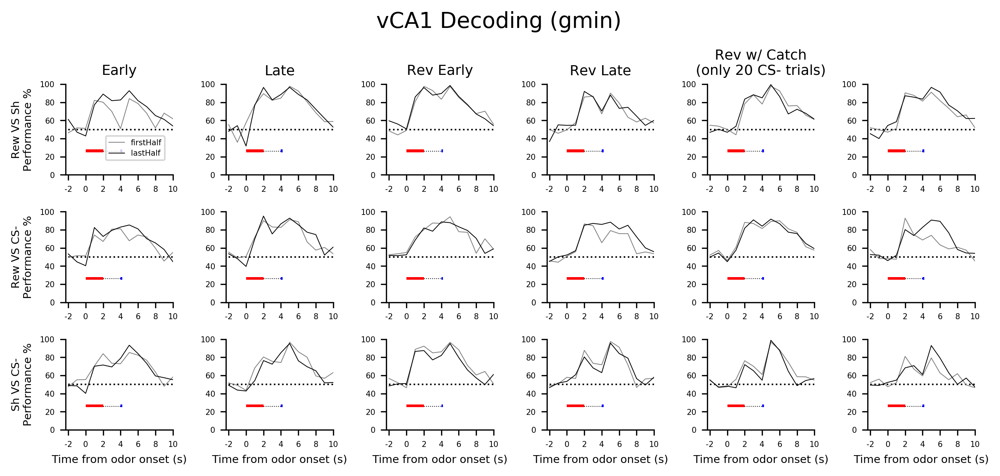

In [53]:
fig, ax = pl.subplots(3,6, figsize=(9, 4))

for sess,r in zip(sessions,range(len(sessions))):
    for lab, x in zip(non_catch_labels,range(len(non_catch_labels))):
        for phase,c in zip(['firstHalf','lastHalf'],(('grey','k'))):
            ax[x][r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_%s_vhpc[sess]"%(t,lab,phase)))*100) for t in range(13)], color=c,label=phase)
            m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_%s_vhpc[sess]"%(t,lab,phase)))*100) for t in range(13)])
            s = np.array([np.std(eval("scores_gmin_tb_%s_%s_%s_vhpc[sess]"%(t,lab,phase)))*100 for t in range(13)])
            #ax[x][r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=c,linewidth=0)

for lab, x in zip(['Rew VS Sh','Rew VS CS-','Sh VS CS-'],range(3)):
    for r in range(len(sessions)):
        ax[x][r].set_ylim(0, 100)
        ax[x][r].set_xlim(-2.3, 10)
        ax[x][r].set_xticks(np.arange(-2,11, 2))
        ax[x][r].set_xticklabels(np.arange(-2,11, 2))
        ax[x][r].hlines(50, -2,10, color='k', lw=1, linestyles='dotted')
        ax[2][r].set_xlabel('Time from odor onset (s)')
        ax[x][0].set_ylabel(lab+'\nPerformance %')
        pt.plot_period_bar(ax[x][r], 25, start_end=(0, 2), color='r', delta_y=3)
        pt.plot_period_bar(ax[x][r], 25, start_end=(4, 4.2), color='b', delta_y=3)
        ax[x][r].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')
        ax[0][0].legend(bbox_to_anchor=(.96,.47),labelspacing=0.4,fontsize=5)

ax[0][0].set_title('Early', fontsize=9, color = 'k')
ax[0][1].set_title('Late', fontsize=9, color = 'k')
ax[0][2].set_title('Rev Early', fontsize=9, color = 'k')
ax[0][3].set_title('Rev Late', fontsize=9, color = 'k')
ax[0][4].set_title('Rev w/ Catch\n(only 20 CS- trials)', fontsize=9, color='k')

fig.tight_layout(pad=2)
pl.suptitle('vCA1 Decoding (gmin)',fontsize=14,y=1.05)


fig.savefig('../img/%s_gmin_halves_vCA1_labels.pdf'%NOTEBOOK_NAME)

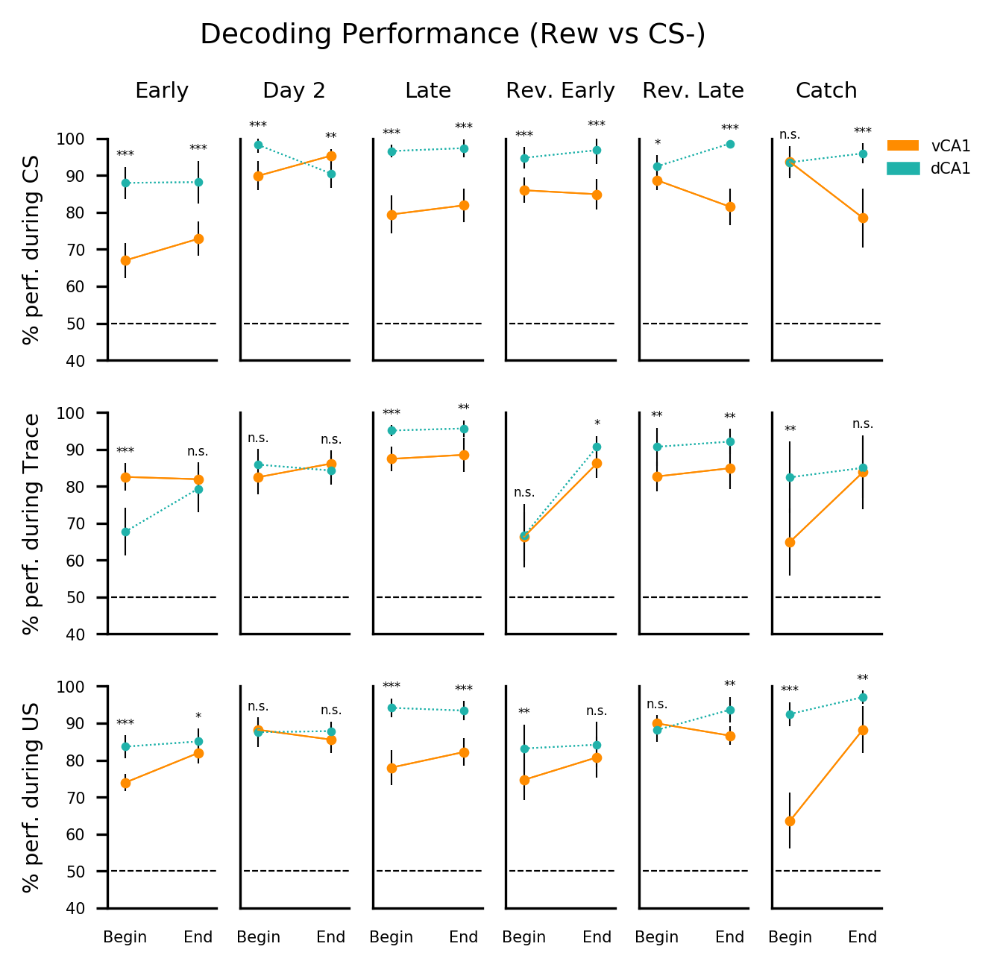

In [57]:
fig,ax = pl.subplots(3,6,figsize=(4,4),sharex=True,sharey=True)
v={}
d={}
phases=['firstHalf','lastHalf']
loops=10

#for sess,r in zip(sessions,range(len(sessions))):
#    for lab, x in zip(non_catch_labels,range(len(non_catch_labels))):
#        for phase,c in zip(['firstHalf','lastHalf'],(('grey','k'))):
#            ax[x][r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_%s_vhpc[sess]"%(t,lab,phase)))*100) for t in range(13)], color=c,label=phase)
#            m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_%s_vhpc[sess]"%(t,lab,phase)))*100) for t in range(13)])
#            s = np.array([np.std(eval("scores_gmin_tb_%s_%s_%s_vhpc[sess]"%(t,lab,phase)))*100 for t in range(13)])

for sess,q in zip(sessions,range(len(sessions))):
    for phase,z in zip(['firstHalf','lastHalf'],(.2,1)):
        for tb,tb_la,x in zip((4,6,8),('CS','Trace','US',),(range(3))):
                v[sess+phase+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_rwVScsm_%s_vhpc[sess][:loops]"%(tb,phase)))*100)
                ax[x][q].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_%s_vhpc[sess][:loops]"%(tb,phase)))*100), 'o', color='darkorange',
                           markersize=2.3)
                ax[x][q].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_%s_vhpc[sess][:loops]"%(tb,phase)))*100),yerr=v[sess+phase+tb_la],
                              color='k')
                d[sess+phase+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_rwVScsm_%s_dhpc[sess][:loops]"%(tb,phase)))*100)
                ax[x][q].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_%s_dhpc[sess][:loops]"%(tb,phase)))*100), 'o', color='lightseagreen',
                           markersize=2.3,mec='lightseagreen',mew=.5)
                ax[x][q].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_%s_dhpc[sess][:loops]"%(tb,phase)))*100),yerr=d[sess+phase+tb_la],
                              color='k')
# Add connecting lines 
for sess,sess_la,q in zip(sessions,('Early','Day 2','Late','Rev. Early','Rev. Late','Catch'), range(len(sessions))):
    for phase,z in zip(['early','late'],(.2,1)):
        for tb,tb_la,x in zip((4,6,8),('CS','Trace','US',),(range(3))):
                ax[x][q].plot([p for p in (.2,1)],
                           [(np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_%s_vhpc[sess][:loops]"%(tb,phase)))*100) for phase in phases],
                           color='darkorange')
                ax[x][q].plot([p for p in (.2,1)],
                           [(np.mean(eval("mean_scores_gmin_tb_%s_rwVScsm_%s_dhpc[sess][:loops]"%(tb,phase)))*100) for phase in phases],
                           color='lightseagreen',linestyle='dotted')
            
                ax[x][q].tick_params(axis='x',bottom=False,labelbottom=True)
                ax[x][q].tick_params(axis='y',left=False)
                ax[x][0].tick_params(axis='y',left=True)
                ax[x][0].set_ylabel('% perf. during '+tb_la)
                ax[x][q].set_ylim(40,100)
                ax[x][q].hlines(50, -.5,2.5, color='k', lw=.5, linestyles='--')
                ax[0][q].set_title(sess_la,y=1.1)
                ax[x][q].set_xlim(0,1.2)
                ax[x][q].set_xticks((.2,1))
                ax[x][q].set_xticklabels(['Begin','End'])
                ax[0][5].legend([Patch(facecolor='darkorange'),Patch(facecolor='lightseagreen',edgecolor='lightseagreen',linewidth=.6)],['vCA1','dCA1'],loc=(1,.8),frameon=False)

#ax[0].legend(loc=(1,0))
pl.suptitle('Decoding Performance (Rew vs CS-)',fontsize=9,x=.5,y=1.05)

pvs=[]
for sess,q in zip(sessions,range(len(sessions))):
    for tb,tb_la,x in zip((4,6,8),('CS','Trace','US'),(range(3))):
        for i,z in zip(range(2),(.2,1)):
            pvs.append(add_significance(ax[x][q], eval("mean_scores_gmin_tb_%s_rwVScsm_%s_vhpc[sess][:loops]"%(tb,phases[i])),
                        eval("mean_scores_gmin_tb_%s_rwVScsm_%s_dhpc[sess][:loops]"%(tb,phases[i])),z,z,
                        max(eval("np.mean(mean_scores_gmin_tb_%s_rwVScsm_%s_vhpc[sess][:loops])"%(tb,phases[i]))*100+v[sess+phases[i]+tb_la],
                        eval("np.mean(mean_scores_gmin_tb_%s_rwVScsm_%s_dhpc[sess][:loops])"%(tb,phases[i]))*100+d[sess+phases[i]+tb_la])+1,
                        ticksize=0))
#        for d in range(3):
#            pvs.append(sig_vs_chance(ax[x],eval("mean_scores_gmin_tb_%s_%s_%s['renew'][:loops]"%(tb,phases[d],r)),.5,d,
#                   eval("np.mean(mean_scores_gmin_tb_%s_%s_%s['renew'][:loops])"%(tb,phases[d],r))*100+s[phases[d]+r]+1,loops=loops,colors='k'))
#        #       eval("mean_scores_gmin_tb_%s_%s_%s['pre'][:loops]"%(tb,phases[i],r))*100+s+1,loops=loops,sig_func=None,colors='k'))
    #pvs.append(sig_vs_chance(ax,mean_scores_gmin_tb_8_dhpc[sess][:loops],.5, .2+i,
    #           np.mean(mean_scores_gmin_tb_8_dhpc[sess][:loops])*100+d[sess]+1,loops=loops,sig_func=None,colors='k'))

fig.tight_layout(w_pad=1,h_pad=2)

fig.savefig('../img/%s_gmin_BegEnd_rwVScsm.jpg'%NOTEBOOK_NAME)

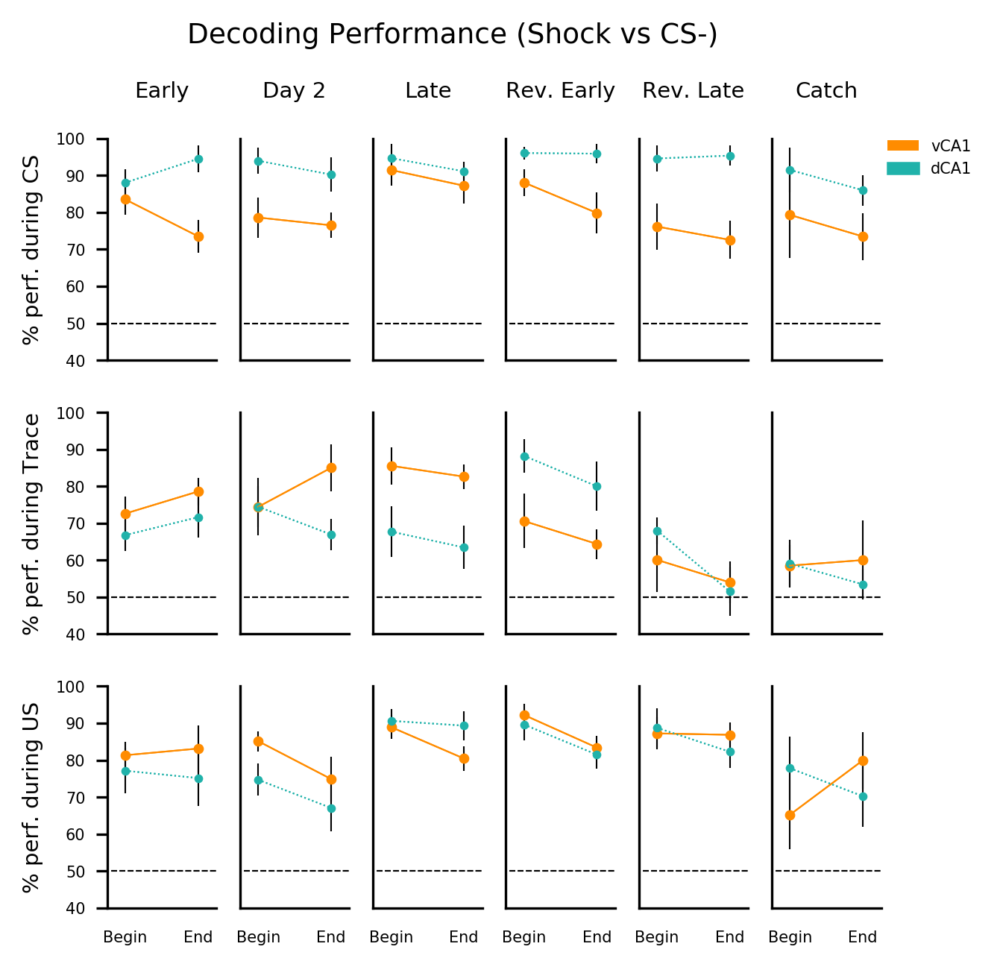

In [60]:
fig,ax = pl.subplots(3,6,figsize=(4,4),sharex=True,sharey=True)
v={}
d={}
phases=['firstHalf','lastHalf']
loops=10

#for sess,r in zip(sessions,range(len(sessions))):
#    for lab, x in zip(non_catch_labels,range(len(non_catch_labels))):
#        for phase,c in zip(['firstHalf','lastHalf'],(('grey','k'))):
#            ax[x][r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_%s_vhpc[sess]"%(t,lab,phase)))*100) for t in range(13)], color=c,label=phase)
#            m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_%s_vhpc[sess]"%(t,lab,phase)))*100) for t in range(13)])
#            s = np.array([np.std(eval("scores_gmin_tb_%s_%s_%s_vhpc[sess]"%(t,lab,phase)))*100 for t in range(13)])

for sess,q in zip(sessions,range(len(sessions))):
    for phase,z in zip(['firstHalf','lastHalf'],(.2,1)):
        for tb,tb_la,x in zip((4,6,8),('CS','Trace','US',),(range(3))):
                v[sess+phase+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_shVScsm_%s_vhpc[sess][:loops]"%(tb,phase)))*100)
                ax[x][q].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_%s_vhpc[sess][:loops]"%(tb,phase)))*100), 'o', color='darkorange',
                           markersize=2.3)
                ax[x][q].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_%s_vhpc[sess][:loops]"%(tb,phase)))*100),yerr=v[sess+phase+tb_la],
                              color='k')
                d[sess+phase+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_shVScsm_%s_dhpc[sess][:loops]"%(tb,phase)))*100)
                ax[x][q].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_%s_dhpc[sess][:loops]"%(tb,phase)))*100), 'o', color='lightseagreen',
                           markersize=2.3,mec='lightseagreen',mew=.5)
                ax[x][q].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_%s_dhpc[sess][:loops]"%(tb,phase)))*100),yerr=d[sess+phase+tb_la],
                              color='k')
# Add connecting lines 
for sess,sess_la,q in zip(sessions,('Early','Day 2','Late','Rev. Early','Rev. Late','Catch'), range(len(sessions))):
    for phase,z in zip(['early','late'],(.2,1)):
        for tb,tb_la,x in zip((4,6,8),('CS','Trace','US',),(range(3))):
                ax[x][q].plot([p for p in (.2,1)],
                           [(np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_%s_vhpc[sess][:loops]"%(tb,phase)))*100) for phase in phases],
                           color='darkorange')
                ax[x][q].plot([p for p in (.2,1)],
                           [(np.mean(eval("mean_scores_gmin_tb_%s_shVScsm_%s_dhpc[sess][:loops]"%(tb,phase)))*100) for phase in phases],
                           color='lightseagreen',linestyle='dotted')
            
                ax[x][q].tick_params(axis='x',bottom=False,labelbottom=True)
                ax[x][q].tick_params(axis='y',left=False)
                ax[x][0].tick_params(axis='y',left=True)
                ax[x][0].set_ylabel('% perf. during '+tb_la)
                ax[x][q].set_ylim(40,100)
                ax[x][q].hlines(50, -.5,2.5, color='k', lw=.5, linestyles='--')
                ax[0][q].set_title(sess_la,y=1.1)
                ax[x][q].set_xlim(0,1.2)
                ax[x][q].set_xticks((.2,1))
                ax[x][q].set_xticklabels(['Begin','End'])
                ax[0][5].legend([Patch(facecolor='darkorange'),Patch(facecolor='lightseagreen',edgecolor='lightseagreen',linewidth=.6)],['vCA1','dCA1'],loc=(1,.8),frameon=False)

#ax[0].legend(loc=(1,0))
pl.suptitle('Decoding Performance (Shock vs CS-)',fontsize=9,x=.5,y=1.05)

pvs=[]
for sess,q in zip(sessions,range(len(sessions))):
    for tb,tb_la,x in zip((4,6,8),('CS','Trace','US'),(range(3))):
        for i,z in zip(range(2),(.2,1)):
            pvs.append(add_significance(ax[x][q], eval("mean_scores_gmin_tb_%s_shVScsm_%s_vhpc[sess][:loops]"%(tb,phases[i])),
                        eval("mean_scores_gmin_tb_%s_shVScsm_%s_dhpc[sess][:loops]"%(tb,phases[i])),z,z,
                        max(eval("np.mean(mean_scores_gmin_tb_%s_shVScsm_%s_vhpc[sess][:loops])"%(tb,phases[i]))*100+v[sess+phases[i]+tb_la],
                        eval("np.mean(mean_scores_gmin_tb_%s_shVScsm_%s_dhpc[sess][:loops])"%(tb,phases[i]))*100+d[sess+phases[i]+tb_la])+1,
                        ticksize=0))
#        for d in range(3):
#            pvs.append(sig_vs_chance(ax[x],eval("mean_scores_gmin_tb_%s_%s_%s['renew'][:loops]"%(tb,phases[d],r)),.5,d,
#                   eval("np.mean(mean_scores_gmin_tb_%s_%s_%s['renew'][:loops])"%(tb,phases[d],r))*100+s[phases[d]+r]+1,loops=loops,colors='k'))
#        #       eval("mean_scores_gmin_tb_%s_%s_%s['pre'][:loops]"%(tb,phases[i],r))*100+s+1,loops=loops,sig_func=None,colors='k'))
    #pvs.append(sig_vs_chance(ax,mean_scores_gmin_tb_8_dhpc[sess][:loops],.5, .2+i,
    #           np.mean(mean_scores_gmin_tb_8_dhpc[sess][:loops])*100+d[sess]+1,loops=loops,sig_func=None,colors='k'))

fig.tight_layout(w_pad=1,h_pad=2)

fig.savefig('../figures/%s_gmin_BegEnd_shVScsm.pdf'%NOTEBOOK_NAME)

### decoding across late and reversal late

In [14]:
for t in range(13): # number of time bins
    for label in non_catch_labels:
        exec('scores_across_tb_%s_%s = {}'%(t,label))
        for comp, vs in zip(comparisons,(all_comparisons[:2],all_comparisons[2:])):
            print comp,label,t,
            eval("scores_across_tb_%s_%s"%(t,label))[comp] = np.r_[[do_test_cross(eval('%s_tb_%s'%(vs[0],t)),
                  eval('labels_%s_%s'%(label,comp.split('VS')[0])),eval('%s_tb_%s'%(vs[1],t)),
                  eval('labels_%s_%s'%(label,comp.split('VS')[1])), n_cells=None) for i in range(n_loops)]]

NameError: name 'comparisons' is not defined

In [94]:
v_name=[]
for t in range(13):
    for label in non_catch_labels:
        for r in 'dhpc','vhpc':
            exec("scores_across_tb_%s_%s_%s = {}"%(t,label,r))
            for sess in ['postVSpost_rev']:
                exec("v_name = 'scores_across_tb_%s_%s'"%(t,label))
                exec("path='../notebooks/autorestore/decoding_around_onset_combined_1sec_%s/'"%(r))
                #exec("scores_tb_%s_outcome_%s_%s_t = {}"%(t,label,r))
                exec("scores_across_tb_%s_%s_%s_t = ut.load_variable(v_name,path)"%(t,label,r))
                exec("scores_across_tb_%s_%s_%s_t = scores_across_tb_%s_%s_%s_t['%s']"%(t,label,r,t,label,r,sess))
                exec("scores_across_tb_%s_%s_%s['%s'] = scores_across_tb_%s_%s_%s_t"%(t,label,r,sess,t,label,r))

NameError: name 'scores_across_tb_0_rwVSsh_dhpc' is not defined

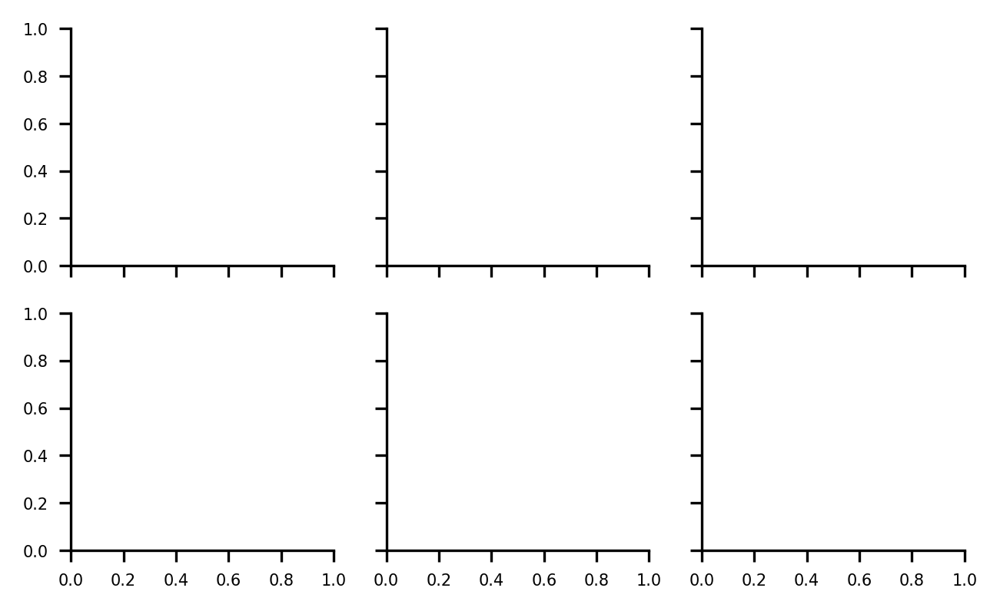

In [13]:
fig, ax = pl.subplots(2,3, figsize=(5,3), sharex=True, sharey=True)

for c,reg in zip(range(2),['dhpc','vhpc']):
    for r,label,col in zip(range(3),non_catch_labels,('darkorchid','tab:blue','tab:red')):
        ax[c][r].plot([(t-2) for t in range(13)], [(np.mean(eval("scores_across_tb_%s_%s_%s['postVSpost_rev']"%(t,label,reg)))*100) for t in range(13)], color=col, ls='-',lw=.5 ,ms=1)
        m = np.array([(np.mean(eval("scores_across_tb_%s_%s_%s['postVSpost_rev']"%(t,label,reg)))*100) for t in range(13)])
        s = np.array([np.std(eval("scores_across_tb_%s_%s_%s['postVSpost_rev']"%(t,label,reg)))*100 for t in range(13)])
        ax[c][r].fill_between([(t-2) for t in range(13)],m-s,m+s,alpha=0.2,color=col,linewidth=0)

for c,reg in zip(range(2),['dhpc','vhpc']):
    for lab, r in zip(['Train: CS1-Rew VS CS2-Sh\nTest:CS2-Rew VS CS1-Sh','Train: CS1-Rew VS CS3\nTest:CS2-Rew VS CS3','Train: CS2-Sh VS CS3\nTest:CS1-Sh VS CS3'],range(3)):
        ax[c][r].set_ylim(0, 100)
        ax[c][r].set_xlim(-2, 10)
        ax[c][r].set_xticks(np.arange(-2,11, 2))
        ax[c][r].set_xticklabels(np.arange(-2,11, 2))
        ax[c][r].hlines(50, -2,10, color='k', lw=1, linestyles='dashed')
        ax[1][r].set_xlabel('Time from odor onset (s)')
        ax[c][0].set_ylabel(reg+'\nPerformance %')
        pt.plot_period_bar(ax[c][r], 0, start_end=(0, 2), color='k', delta_y=100,alpha=.09)
        pt.plot_period_bar(ax[c][r], 0, start_end=(4, 5), color='cornflowerblue', delta_y=100, alpha=.2)
        #ax[c][r].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')
        ax[0][r].set_title(lab, fontsize=6, color = 'dimgrey')

pl.suptitle('Cross-Session Decoding (Late vs Reversal-Late)',fontsize=11,y=1.02)
fig.tight_layout(pad=2)

fig.savefig('../figures/%s_Xsess_lateVSrevlate.pdf'%NOTEBOOK_NAME)

# left off here 3/31/21

### export data to .CSV file for offline stats analysis (2-way ANOVA)

In [51]:
import csv

#header1 = ['Early','Late','Ext1','Ext2','Reinstate']
#header2 = ['CS','CS','CS','CS','Trace','Trace','Trace','Trace','US','US','US','US']
#header3 = ['vhpc','vhpc','dhpc','dhpc','vhpc','vhpc','dhpc','dhpc','vhpc','vhpc','dhpc','dhpc']
#header4 = ['Begin','End','Begin','End','Begin','End','Begin','End','Begin','End','Begin','End']
#header1 = np.repeat(header1,12)
#header2 = header2*5
#header3 = header3*5
#header4 = header4*5

with open('Begin_End_scores_ALL_alt.csv', 'w') as csvfile:    #open fiile in write mode ('w')
    # creating a csv writer object  
    csvwriter = csv.writer(csvfile)  
        
    ## writing the fields  
    #csvwriter.writerows(header1)
    #csvwriter.writerows(header2)
    #csvwriter.writerows(header3)
    #csvwriter.writerows(header4)
    
    csvwriter.writerow(['session','epoch','region','period','score'])    #write header row
    for sess in sessions[1:]:
        for h2,pha in zip([6,8,10],['CS','Trace','US']):
            for h3 in ['vhpc','dhpc']:
                for h4 in ['early','late']:
                    for i in range(loops):
                        csvwriter.writerow([sess,pha,h3,h4, eval("mean_scores_gmin_tb_%s_%s_%s[sess][i]"%(h2,h4,h3))])

In [52]:
import pandas as pd

#create a pandas dataframe to perform 2-way anova
df = pd.read_csv("Begin_End_scores_ALL_alt.csv")
df.head(5)

,session,epoch,region,period,score
0,pre,CS,vhpc,early,0.5800
1,pre,CS,vhpc,early,0.5725
2,pre,CS,vhpc,early,0.5450
3,pre,CS,vhpc,early,0.5825
4,pre,CS,vhpc,early,0.6500


In [53]:
#get subset of data
df_postCS = df.query('session == "post" & epoch == "CS"')

In [54]:
df_postCS.head(5)

,session,epoch,region,period,score
180,post,CS,vhpc,early,0.9325
181,post,CS,vhpc,early,0.9200
182,post,CS,vhpc,early,0.9500
183,post,CS,vhpc,early,0.8975
184,post,CS,vhpc,early,0.9525


In [55]:
#can't get statsmodels to work, so just working with extraced .csv file offline

In [56]:
#import .csv file with 2way ANOVA results
df_2way_results = pd.read_csv("../img/2odor 2way ANOVA - region x time.csv")
test = df_2way_results['Prob>|t|']
df_2way_results.head(4)

,epoch,session,Term,Estimate,Std Error,t Ratio,Prob>|t|
0,CS,ext1,Intercept,0.821833,0.006636,123.85,<.0001
1,CS,ext1,region[dhpc],0.068000,0.006636,10.25,<.0001
2,CS,ext1,period[early],0.061167,0.006636,9.22,<.0001
3,CS,ext1,region[dhpc]*period[early],-0.007000,0.006636,-1.05,0.296


In [57]:
# get rid of the "<.0001" and replace with just 0
df_2way_results ['Prob>|t|'] = pd.to_numeric(df_2way_results['Prob>|t|'], errors='coerce')
df_2way_results = df_2way_results.replace(np.nan, 0, regex=True)
df_2way_results.head(4)

,epoch,session,Term,Estimate,Std Error,t Ratio,Prob>|t|
0,CS,ext1,Intercept,0.821833,0.006636,123.85,0.000
1,CS,ext1,region[dhpc],0.068000,0.006636,10.25,0.000
2,CS,ext1,period[early],0.061167,0.006636,9.22,0.000
3,CS,ext1,region[dhpc]*period[early],-0.007000,0.006636,-1.05,0.296


In [58]:
#extract the main in interaction pvals for each epoch x session combo
for epok in ('CS','Trace','US'):
    for sess in sessions[1:]:
        exec("%s_%s_pvals = {}"%(epok,sess))
        for term,term_la in zip(('region','period','interaction'),('region[dhpc]','period[early]','region[dhpc]*period[early]')):
            exec("%s_%s_pvals[term] = df_2way_results.query('epoch == \"%s\" & session == \"%s\" & Term == \"%s\"')"%(epok,sess,epok,sess,term_la))
            exec("%s_%s_pvals[term] = list(%s_%s_pvals[term]['Prob>|t|'])"%(epok,sess,epok,sess))

In [59]:
CS_ext1_pvals['interaction'][0]

0.29600000000000004

In [12]:
def add_2way_sig(ax, sess, epoch, x, y, thresholds=(0.05, 0.01, 0.001)):
    p_reg = eval("%s_%s_pvals['region'][0]"%(epoch,sess))
    p_per = eval("%s_%s_pvals['period'][0]"%(epoch,sess))
    p_interac = eval("%s_%s_pvals['interaction'][0]"%(epoch,sess))
    for tex,i,ps in zip(('region','period','r X p   '),(8,4,0),(p_reg,p_per,p_interac)):
        ax.text(x, y+i, tex+': '+
            ('n.s.' if ps>thresholds[0] else
            '*' if ps>thresholds[1] else
            '**' if ps>thresholds[2] else
            '***'),
            ha='left', fontsize=3.5)
    return p

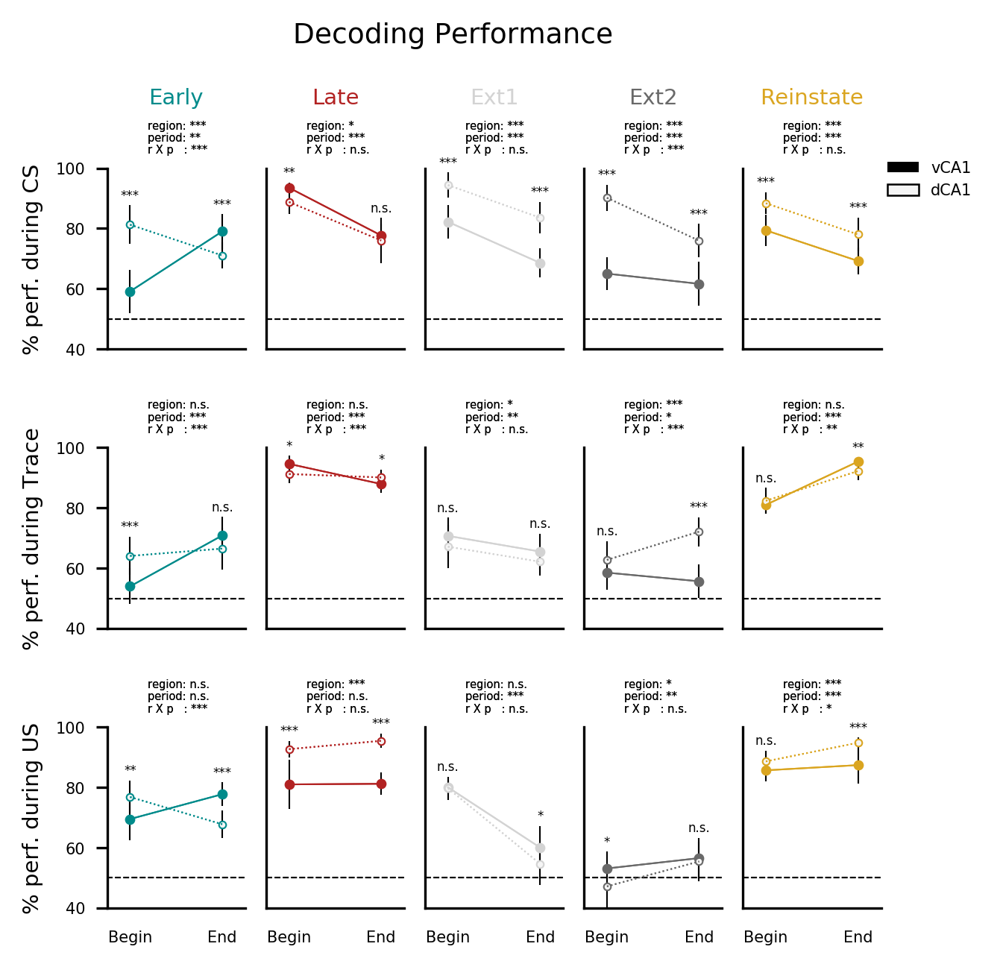

In [61]:
fig,ax = pl.subplots(3,5,figsize=(4,4),sharex=True,sharey=True)
v={}
d={}
phases=['early','late']
loops=15
for sess,q in zip(sessions[1:],range(len(sessions[1:]))):
    for phase,z in zip(['early','late'],(.2,1)):
        for tb,tb_la,x in zip((6,8,10),('CS','Trace','US',),(range(3))):
                v[sess+phase+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_%s_vhpc[sess][:loops]"%(tb,phase)))*100)
                ax[x][q].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_%s_vhpc[sess][:loops]"%(tb,phase)))*100), 'o', color=dark_co[q+1],
                           markersize=2.3)
                ax[x][q].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_%s_vhpc[sess][:loops]"%(tb,phase)))*100),yerr=v[sess+phase+tb_la],
                              color='k')
                d[sess+phase+tb_la] = np.array(np.std(eval("mean_scores_gmin_tb_%s_%s_dhpc[sess][:loops]"%(tb,phase)))*100)
                ax[x][q].plot(z, (np.mean(eval("mean_scores_gmin_tb_%s_%s_dhpc[sess][:loops]"%(tb,phase)))*100), 'o', color='whitesmoke',
                           markersize=2.3,mec=dark_co[q+1],mew=.5)
                ax[x][q].errorbar(z, (np.mean(eval("mean_scores_gmin_tb_%s_%s_dhpc[sess][:loops]"%(tb,phase)))*100),yerr=d[sess+phase+tb_la],
                              color='k')
# Add connecting lines 
for sess,sess_la,q in zip(sessions[1:],('Early','Late','Ext1','Ext2','Reinstate'), range(len(sessions[1:]))):
    for phase,z in zip(['early','late'],(.2,1)):
        for tb,tb_la,x in zip((6,8,10),('CS','Trace','US',),(range(3))):
                ax[x][q].plot([p for p in (.2,1)],
                           [(np.mean(eval("mean_scores_gmin_tb_%s_%s_vhpc[sess][:loops]"%(tb,phase)))*100) for phase in phases],
                           color=dark_co[q+1])
                ax[x][q].plot([p for p in (.2,1)],
                           [(np.mean(eval("mean_scores_gmin_tb_%s_%s_dhpc[sess][:loops]"%(tb,phase)))*100) for phase in phases],
                           color=dark_co[q+1],linestyle='dotted')
            
                ax[x][q].tick_params(axis='x',bottom=False,labelbottom=True)
                ax[x][q].tick_params(axis='y',left=False)
                ax[x][0].tick_params(axis='y',left=True)
                ax[x][0].set_ylabel('% perf. during '+tb_la)
                ax[x][q].set_ylim(40,100)
                ax[x][q].hlines(50, -.5,2.5, color='k', lw=.5, linestyles='--')
                ax[0][q].set_title(sess_la,y=1.25,color=dark_co[q+1])
                ax[x][q].set_xlim(0,1.2)
                ax[x][q].set_xticks((.2,1))
                ax[x][q].set_xticklabels(['Begin','End'])
                ax[0][4].legend([Patch(facecolor='k'),Patch(facecolor='whitesmoke',edgecolor='k',linewidth=.6)],['vCA1','dCA1'],loc=(1,.8),frameon=False)

#ax[0].legend(loc=(1,0))
pl.suptitle('Decoding Performance',fontsize=9,x=.5,y=1.05)

pvs=[]

phases=['early','late']
for sess,q in zip(sessions[1:],range(len(sessions[1:]))):
    for tb,tb_la,x in zip((6,8,10),('CS','Trace','US'),(range(3))):
        for i,z in zip(range(2),(.2,1)):
            pvs.append(add_significance(ax[x][q], eval("mean_scores_gmin_tb_%s_%s_vhpc[sess][:loops]"%(tb,phases[i])),
                        eval("mean_scores_gmin_tb_%s_%s_dhpc[sess][:loops]"%(tb,phases[i])),z,z,
                        max(eval("np.mean(mean_scores_gmin_tb_%s_%s_vhpc[sess][:loops])"%(tb,phases[i]))*100+v[sess+phases[i]+tb_la],
                        eval("np.mean(mean_scores_gmin_tb_%s_%s_dhpc[sess][:loops])"%(tb,phases[i]))*100+d[sess+phases[i]+tb_la])+1,
                        ticksize=0))
            add_2way_sig(ax[x][q],sess,tb_la,.35,105)
#        for d in range(3):
#            pvs.append(sig_vs_chance(ax[x],eval("mean_scores_gmin_tb_%s_%s_%s['renew'][:loops]"%(tb,phases[d],r)),.5,d,
#                   eval("np.mean(mean_scores_gmin_tb_%s_%s_%s['renew'][:loops])"%(tb,phases[d],r))*100+s[phases[d]+r]+1,loops=loops,colors='k'))
#        #       eval("mean_scores_gmin_tb_%s_%s_%s['pre'][:loops]"%(tb,phases[i],r))*100+s+1,loops=loops,sig_func=None,colors='k'))
    #pvs.append(sig_vs_chance(ax,mean_scores_gmin_tb_8_dhpc[sess][:loops],.5, .2+i,
    #           np.mean(mean_scores_gmin_tb_8_dhpc[sess][:loops])*100+d[sess]+1,loops=loops,sig_func=None,colors='k'))

fig.tight_layout(w_pad=1,h_pad=5)

fig.savefig('../img/%s_gmin_BegEnd_ALLsess.pdf'%NOTEBOOK_NAME)

### break up into even finer subsets

In [62]:
v_name=[]
for t in range(13):
    for per in 'Trials1to20','Trials21to40','Trials81to100','Trials101to120':
        for r in 'dhpc','vhpc':
            exec("scores_gmin_tb_%s_%s_%s = {}"%(t,per,r))
            for sess in sessions[1:]:
                exec("v_name = 'scores_gmin_tb_%s_%s'"%(t,per))
                exec("path='../notebooks/autorestore/decoding_around_onset_combined_%s/'"%(r))
                exec("scores_gmin_tb_%s_%s_%s_t = ut.load_variable(v_name,path)"%(t,per,r))
                exec("scores_gmin_tb_%s_%s_%s_t = scores_gmin_tb_%s_%s_%s_t['%s']"%(t,per,r,t,per,r,sess))
                exec("scores_gmin_tb_%s_%s_%s['%s'] = scores_gmin_tb_%s_%s_%s_t"%(t,per,r,sess,t,per,r))

In [63]:
#get mean of each array
for t in range(13):
    for per in 'Trials1to20','Trials21to40','Trials81to100','Trials101to120':
        for r in 'dhpc','vhpc':
            exec("mean_scores_gmin_tb_%s_%s_%s={}"%(t,per,r))
            for sess in sessions[1:]:
                exec("mean_scores_gmin_tb_%s_%s_%s[sess]=[]"%(t,per,r))
                for i in eval("scores_gmin_tb_%s_%s_%s[sess]"%(t,per,r)):
                    exec("mean_scores_gmin_tb_%s_%s_%s[sess].append(i.mean())"%(t,per,r))

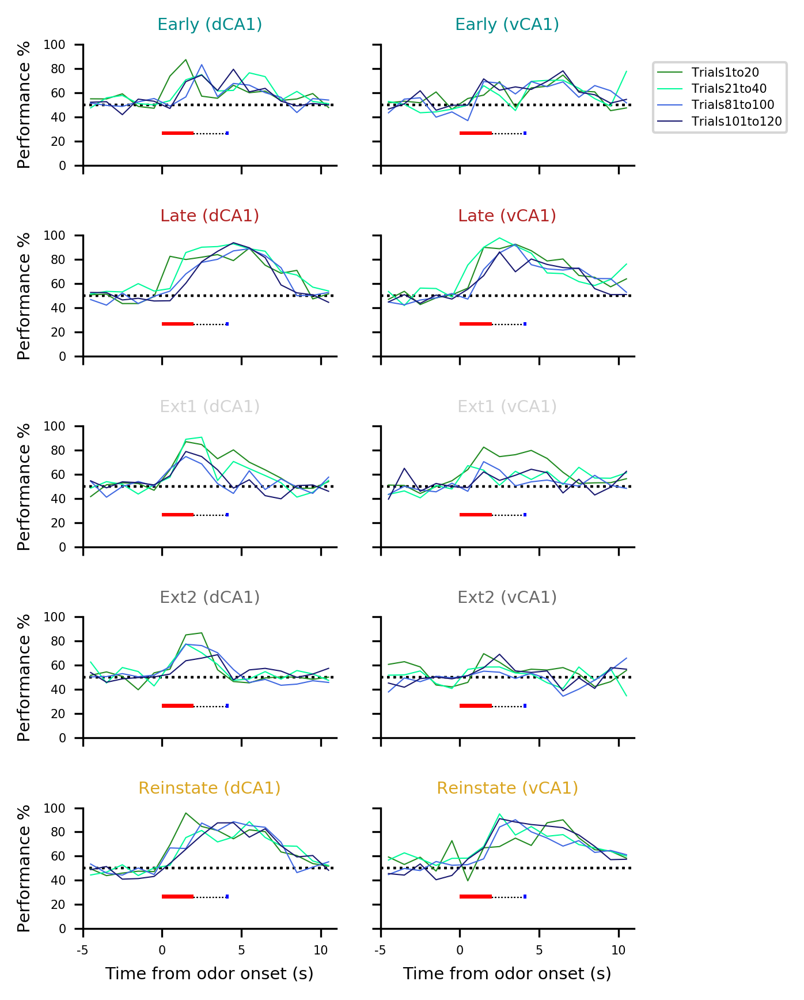

In [64]:
fig, ax = pl.subplots(5,2, figsize=(4, 6),sharex=True,sharey=True)

for sess,x,sess_la in zip(sessions[1:],range(len(sessions[1:])),('Early','Late','Ext1','Ext2','Reinstate')):
    for phase,c in zip(['Trials1to20','Trials21to40','Trials81to100','Trials101to120'],
                       ('forestgreen','mediumspringgreen','royalblue','midnightblue')):
        for r,r_la,i in zip(('dhpc','vhpc'),('dCA1','vCA1'),(0,1)):
            ax[x][i].plot([(t-4.5) for t in range(13)], [(np.mean(eval("scores_gmin_tb_%s_%s_%s[sess]"%(t,phase,r)))*100) for t in range(13)],
                    color=c,label=phase)
            #m = np.array([(np.mean(eval("scores_gmin_tb_%s_%s_%s[sess]"%(t,phase,r)))*100) for t in range(13)])
            #s = np.array([np.std(eval("scores_gmin_tb_%s_%s_%s[sess]"%(t,phase,r)))*100 for t in range(13)])
            #ax[x][i].fill_between([(t-4.5) for t in range(13)],m-s,m+s,alpha=0.2,color=c,linewidth=0)
            ax[x][i].set_title(sess_la+' ('+r_la+')',color=dark_co[x+1])
            pt.plot_period_bar(ax[x][i], 25, start_end=(0, 2), color='r', delta_y=3)
            pt.plot_period_bar(ax[x][i], 25, start_end=(4, 4.2), color='b', delta_y=3)
            ax[x][i].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')
            ax[x][i].hlines(50, -5,11, color='k', lw=1, linestyles='dotted')
            ax[x][0].set_ylabel('Performance %')
ax[0][0].set_ylim(0, 100)
ax[0][0].set_xlim(-5, 11)
ax[0][0].set_xticks(np.arange(-5,11, 5))
ax[0][0].set_xticklabels(np.arange(-5,11, 5))
ax[x][0].set_xlabel('Time from odor onset (s)')
ax[x][1].set_xlabel('Time from odor onset (s)')
ax[0][1].legend(bbox_to_anchor=(1.05,.9),labelspacing=0.4,fontsize=5)
fig.tight_layout(pad=3)

fig.savefig('../img/%s_gmin_phases_ALL.pdf'%NOTEBOOK_NAME)

In [724]:
save_workspace(db)

Could not store variable 'sstats'. Skipping...
Could not store variable 'ip'. Skipping...
Could not store variable 'np'. Skipping...
Could not store variable 'IPython'. Skipping...
Could not store variable 'pickle'. Skipping...
Could not store variable 'cm'. Skipping...
Could not store variable 'pt'. Skipping...
Could not store variable 'pl'. Skipping...
Could not store variable 'sys'. Skipping...
Could not store variable 'ut'. Skipping...
Could not store variable 'matplotlib'. Skipping...
Could not store variable 'os'. Skipping...
